# CILC method

After having implemented the ILC method properly and checking that it is not enough to extract the $\mu$-distorted $y$ signal, I am taking a step further by $\textit{constraining}$ the ILC method, so now I will proceed with the CILC method.

This code must

1. Calculate the covariance matrix: $$ \widehat{\mathbf{R}}_{ij}(\bar{\ell}) = \frac{1}{N_{\bar{\ell}}} \sum_{\bar{\ell} - \Delta \bar{\ell}}^{\bar{\ell} + \Delta \bar{\ell}} \sum_{m} x_{\ell m, i} x_{\ell m, j}^{*} , $$
where $N_{\ell} = (\ell + \Delta \ell + 1)^2 - (\ell - \Delta \ell)^2$.


2. Compute the transposed weights: $$\underline{\omega^t} = \frac{(\underline{b^t} \cdot \underline{\underline{\widehat{R}^{-1}}} \cdot \underline{b}) \cdot \underline{a^t} \cdot \underline{\underline{\widehat{R}^{-1}}} - (\underline{a^t} \cdot \underline{\underline{\widehat{R}^{-1}}} \cdot \underline{b}) \cdot \underline{b^t} \cdot \underline{\underline{\widehat{R}^{-1}}} }{ (\underline{a^t} \cdot {\underline{\underline{\widehat{R}^{-1}}}} \cdot \underline{a}) (\underline{b^t} \cdot \underline{\underline{\widehat{R}^{-1}}} \cdot \underline{b}) - (\underline{a^t} \cdot {\underline{\underline{\widehat{R}^{-1}}}} \cdot \underline{b})^2 } $$

3. Apply the weights ($\underline{\omega^t}$) to the data ($d_i$).

4. Get the output: $$\hat{y} = \Sigma_i \left( \omega_i \cdot d_i (p) \right), $$
and multiply it by $\mu$.

5. Marginalise over the $\widehat{\mu y}$ tSZ signal so that:
$$ <\widehat{\mu y}>^2 \text{is minimum,}$$
$$ \tilde{\underline{w^t}} \cdot \underline{h} = 1,$$
$$ \tilde{\underline{w^t}} \cdot \underline{g} = 0.$$

### Previous

In [14]:
### IMPORT PACKAGES ###

import healpy as hp
import numpy as np
import pandas as pd
import scipy as sp
import numba as nb
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as patches

import gc
import os
import math
from joblib import Parallel, delayed
from numba import njit, prange
from scipy.interpolate import *
from scipy import stats
from scipy import odr
from scipy.signal import windows

from astropy.wcs import WCS
from astropy.io import fits
from reproject import reproject_from_healpix

import datetime
from pathlib import Path

print("Packages imported successfully")

Packages imported successfully


In [15]:
### MEMORY MANAGEMENT ###

import gc # Garbage Collector

# Before starting a new run, clear previous big variables if they exist
if 'data_cube' in locals():
    del data_cube
if 'alms_list' in locals():
    del alms_list
if 'y_hat_harmonic' in locals():
    del y_hat_harmonic
if 'y_hat_pixel' in locals():
    del y_hat_pixel
if 'muy_hat_harmonic' in locals():
    del muy_hat_harmonic
if 'muy_hat_pixel' in locals():
    del muy_hat_pixel
if 'residuals_harmonic' in locals():
    del residuals_harmonic
if 'residuals_pixel' in locals():
    del residuals_pixel
if 'stack_y_cilc_10e3' in locals():
    del stack_y_cilc_10e3
if 'stack_muy_cilc_10e3' in locals():
    del stack_muy_cilc_10e3
if 'stack_y_cilc_10e4' in locals():
    del stack_y_cilc_10e4
if 'stack_muy_cilc_10e4' in locals():
    del stack_muy_cilc_10e4
if 'stack_y_ilc_10e3' in locals():
    del stack_y_ilc_10e3
if 'stack_muy_ilc_10e3' in locals():
    del stack_muy_ilc_10e3
if 'stack_y_ilc_10e4' in locals():
    del stack_y_ilc_10e4
if 'stack_muy_ilc_10e4' in locals():
    del stack_muy_ilc_10e4
if 'stack_y_real_10e3' in locals():
    del stack_y_real_10e3
if 'stack_muy_real_10e3' in locals():
    del stack_muy_real_10e3
if 'stack_y_real_10e4' in locals():
    del stack_y_real_10e4
if 'stack_muy_real_10e4' in locals():
    del stack_muy_real_10e4


gc.collect() # Manually trigger memory cleanup

25409

### Check frequencies and mu value!

In [16]:
### DEFINITIONS: CONSTANTS, FREQUENCIES, ETC. ###

# Nside
nside_work = 2048

# Conversion factor for Compton-y to muK
T_cmb_muK = 2.7255e6

# Planck frequencies in GHz --- kickoff diapo. 8
planck_frequencies = [30, 44, 70, 100, 143, 217, 353, 545, 857]

# Zegeye paper frequencies in GHz
zegeye_frequencies = [30, 40, 90, 150, 220, 270]

# PICO paper frequencies in GHz
PICO_frequencies = [21, 25, 30, 36, 43, 52, 62, 75, 90, 108, 129, 155, 186, 223, 268, 321, 385, 462, 555, 666, 799]

# Define the name of the frequencies used as a string
freq_str_name = "Zegeye"  # Can be "Planck", "Zegeye", or "PICO"

# Reference noise
base_sensitivity_uk_arcmin = 0.2

# Theoretical (LCDM) mu-distortion value
#mu = 2e-8
mu = 2e-4

# Calculate area of pixel in arcmin^2 for the working resolution. As hp.nside2pixarea gives us the area in steradians, we convert it to arcmin^2 by multiplying by (180*60/pi)^2
pixel_area_arcmin2 = hp.nside2pixarea(nside_work) * (180*60/np.pi)**2

print("----------------------------------------")
print("------------ Configuration -------------")
print("----------------------------------------")
print(f"Nside: {nside_work}")
print(f"Frequencies (GHz): {zegeye_frequencies}")
print(rf"T_CMB: {T_cmb_muK:.0f} muK")
print(f"Theoretical mu-distortion value: {mu:.0e}")
print(f"Base sensitivity: {base_sensitivity_uk_arcmin} uK-arcmin")
print(f"Pixel area at Nside {nside_work}: {pixel_area_arcmin2:.2f} arcmin^2")
print("----------------------------------------")
print("------- Date:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"),"------")
print("----------------------------------------")

----------------------------------------
------------ Configuration -------------
----------------------------------------
Nside: 2048
Frequencies (GHz): [30, 40, 90, 150, 220, 270]
T_CMB: 2725500 muK
Theoretical mu-distortion value: 2e-04
Base sensitivity: 0.2 uK-arcmin
Pixel area at Nside 2048: 2.95 arcmin^2
----------------------------------------
------- Date: 2026-07-08 12:05:55 ------
----------------------------------------


### Pipeline

In [4]:
### 1. Load the processed Maps and the data_cube_32 ###

path_to_websky = '/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/'
data_cube_name = f"data_cube_32_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_{mu:.0e}.fits"
if not os.path.exists(path_to_websky + data_cube_name):
    print(f"Error: The file {data_cube_name} does not exist in the path {path_to_websky}. Please check the file name (and path).")

# A. Load the Data Cube (The 'Observed' (simulated) data)
data_cube = hp.read_map(path_to_websky + data_cube_name, field=None).astype(np.float32)
print(f"Loading the {data_cube_name} (4 layers: CMB + tSZ + noise + mu-distorted tSZ) from file...")

# B. Load the Truth Maps (For validation and residuals)
y_map = hp.read_map(path_to_websky + "y_map.fits").astype(np.float32)
muy_map = mu * y_map
cmb_map = hp.read_map(path_to_websky + "cmb_map.fits").astype(np.float32)
print("Loading the original y_map and cmb_map for validation...")

print(f"Data Cube loaded. Shape: {data_cube.shape}")
print(f"{data_cube.shape[0]} frequencies: {zegeye_frequencies} with 4 layer maps of {data_cube.shape[1]} pixels as Nside = {nside_work}.")
# Should be (9, 50331648) for Nside 2048

Loading the data_cube_32_6freq_0.2muK_2e-04.fits (4 layers: CMB + tSZ + noise + mu-distorted tSZ) from file...
Loading the original y_map and cmb_map for validation...
Data Cube loaded. Shape: (6, 50331648)
6 frequencies: [30, 40, 90, 150, 220, 270] with 4 layer maps of 50331648 pixels as Nside = 2048.


In [7]:
# 1.5. MEMORY FLUSH: delete the data_cube as long as it is not used (PLOTS... it is only used when ILC/CILC methods are implemented)
if 'data_cube' in locals():
    del data_cube
gc.collect()  # Forces your Mac to reclaim those 4+ Gigabytes immediately

0

In [5]:
### 2. Define the tSZ frequency scaling function g(nu) and Taylor expansion h(nu) ###

def get_physics_constants(nu):
    """Calculate the physics constants needed for tSZ scaling."""
    T_cmb = 2.7255     # CMB temperature in K
    k_B = 1.380649e-23 # Boltzmann constant in J/K
    h = 6.62607015e-34 # Planck constant in J*s
    x = (h * nu * 1e9) / (k_B * T_cmb) # Dimensionless frequency
    return x

def get_tsz_g(nu):
    """Calculate the tSZ frequency scaling g(nu) in dimensionless units."""
    x = get_physics_constants(nu)
    g_nu = x * (np.exp(x) + 1) / (np.exp(x) - 1) - 4 # or alternatively: g_nu = x * (1 / np.tanh(x / 2)) - 4
    return g_nu

def get_tsz_h(nu):
    """Calculate the tSZ Taylor expansion frequency scaling h(nu) in dimensionless units."""
    x = get_physics_constants(nu)
    h_nu = (-x/2) * ( 1 / ( (np.exp(x) - np.exp(-x)) / 2 )**2 ) # or alternatively: h_nu = (-x/2) * (1 / np.sinh(x/2)**2)
    #h_nu = (-x/2) * (1 / np.sinh(x/2)**2)
    return h_nu

## CILC

### Outline 

1. CILC method definition: Pixel CILC (P-CILC) & Harmonic CILC (H-CILC).

2. Processing for each signal:

| **Subsection** | __Signal__ | **SED** | **Extracted map** |
| :---: | :---: | :---: | :---: |
| 2.1. | tSZ | $g(\nu) = x \coth \left( \frac{x}{2} \right) - 4 $ | $y$-map |
| 2.2. | CMB | $a=[1,...,1]$ | $CMB$-map |
| 2.3. | $\mu$-distorted tSZ | $h(\nu) = - \frac{x}{2} \frac{1}{\sinh^2\left( \frac{x}{2} \right)}$ | $\mu y$-map |

3. Plotting two views for every map:
- Zoomed view.
- Mollweide view.

4. Extra plots.

5. TT map: $\mu y$ Vs. $y$ for $\mu$ extraction.

## 1. ILC

### 1.1. ILC method definition

In [ ]:
def run_pixel_ilc(data_cube, vector_muK): ### UNITLESS MAP OUTPUT + WEIGHTS ###

    # C definition
    n_freq, n_pix = data_cube.shape
    C = (1.0 / n_pix) * (data_cube @ data_cube.T) # IS IT THAT d_i (p') * d_j (p') = data_cube @ data_cube.T
    C_inv = np.linalg.pinv(C)

    # Calculate the weights
    weights = (C_inv @ vector_muK) / (vector_muK.T @ C_inv @ vector_muK)

    return weights @ data_cube, weights

# weights @ data_cube IS UNITLESS AS [weights] = 1/g^t * data_cube = 1/T_cmb * T_cmb
# [g] = T_cmb_muK
# [data_cube] = T_cmb_muK

In [ ]:
def run_harmonic_ilc_with_weights(data_cube, vector_muK, l_bins): ### UNITLESS MAP OUTPUT + WEIGHTS PER BIN  ###
    """Advanced Harmonic-Space ILC (Multi-scale)"""
    n_freq, n_pix = data_cube.shape
    nside = hp.npix2nside(n_pix)
    lmax = 3*nside-1
    alms_list = [hp.map2alm(m, lmax=lmax) for m in data_cube]
    final_alms = np.zeros(hp.Alm.getsize(lmax), dtype=np.complex128)
    ell, _ = hp.Alm.getlm(lmax)
    
    # NEW: Matrix to store weights for each bin
    weights_per_bin = []

    for i in range(len(l_bins)-1):
        mask = (ell >= l_bins[i]) & (ell < l_bins[i+1])
        bin_alms = np.array([alms[mask] for alms in alms_list])
        cov_bin = np.real(np.conj(bin_alms) @ bin_alms.T) / np.sum(mask)
        inv_cov = np.linalg.pinv(cov_bin)
        
        # Calculate weights for THIS specific scale
        w_bin = (inv_cov @ vector_muK) / (vector_muK.T @ inv_cov @ vector_muK)
        weights_per_bin.append(w_bin) # Store them
        
        final_alms[mask] = w_bin @ bin_alms
        
    return hp.alm2map(final_alms, nside=nside), np.array(weights_per_bin)

### 1.2. P-ILC implementation for later comparison

1.2.1. $y$-map

In [ ]:
### Define the g_vector_muK ###

# Define g_vector (and h_vector) in muK units for the frequencies in the data cube
g_vector_muK = np.array([get_tsz_g(nu) for nu in zegeye_frequencies]) * T_cmb_muK # IT HAS TO BE MULTIPLIED BY T_CMB * 10^6 or T_CMB_MU_K

# If we wanted to do the same for h_vector (for the mu distorted tSZ signal ILC), we would do:
#h_vector_muK = np.array([get_tsz_h(nu) for nu in zegeye_frequencies]) * T_cmb_muK

In [ ]:
### Check lengths of the vectors and frequencies ###

print(len(g_vector_muK)) # Should be 9, one for each frequency
print(len(zegeye_frequencies)) # Should be 9, one for each frequency

6
6


In [ ]:
### See the g_vector values for the frequencies ### 

print(g_vector_muK/T_cmb_muK) # Should be unitless and match the expected g(nu) values for the frequencies

[-1.9537051  -1.91799162 -1.59794759 -0.95332592  0.03829958  0.83696256]


In [ ]:
### P-ILC ###

# Run P-ILC. The resulting map is unitless.
y_hat_pixel_ilc, w_pixel_y_ilc = run_pixel_ilc(data_cube, g_vector_muK)

# Calculate the residual in dimensionless y units (Truth - Reconstruction)
y_residual_pixel_ilc = y_map - y_hat_pixel_ilc

"""
# As y_map is also unitless, I will leave both unitless. However, I could aslo convert both to muK units and have a 10^5 scale factor.
y_map_muK = y_map * T_cmb_muK
y_residual_pixel_muK = y_map_muK - y_hat_pixel_ilc * T_cmb_muK
"""

# Validation: Both should be order 10^-5
print(f"Truth max: {np.max(y_map):.2e}")
print(f"Reco max: {np.max(y_hat_pixel_ilc):.2e}")
print(f"Residual max: {np.max(y_residual_pixel_ilc):.2e}")
print("WATCH!!! IS THERE A PROBLEM WITH RECO?")

Truth max: 1.99e-04
Reco max: 1.99e-04
Residual max: 1.54e-07
WATCH!!! IS THERE A PROBLEM WITH RECO?


In [ ]:
### P-ILC WEIGHTS ANALYSIS ON THE tSZ SIGNAL ###

df_weights_pixel_ilc = pd.DataFrame({
    'Freq (GHz)': zegeye_frequencies,
    'Weight': w_pixel_y_ilc,
    'g(nu) * T_cmb_muK': g_vector_muK
})
# Transpose it for horizontal display
df_horizontal_pixel_ilc = df_weights_pixel_ilc.set_index('Freq (GHz)').T
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.max_columns', None)
print("------------------------------")
print("--- P-ILC Analysis Weights ---")
print("------------------------------")
print(df_horizontal_pixel_ilc)

# Verify the constraint is satisfied
constraint_check_pixel_ilc = np.sum(w_pixel_y_ilc * g_vector_muK)
w_pixel_y_ilc_sum = np.sum(w_pixel_y_ilc)
print("------------------------------")
print(f"Constraint Check: {constraint_check_pixel_ilc:.4f}")
print(f"Sum of Weights: {w_pixel_y_ilc_sum:.4f}")
print("Great! Since the CMB has the same value in every channel, the ILC 'subtracts' the low-frequency channels from the high-frequency ones to make the CMB disappear.")

------------------------------
--- P-ILC Analysis Weights ---
------------------------------
Freq (GHz)                  30            40            90            150           220           270
Weight             4.057364e-08 -4.367881e-08 -1.693581e-07  4.094056e-08 -2.593183e-08  1.574693e-07
g(nu) * T_cmb_muK -5.324823e+06 -5.227486e+06 -4.355206e+06 -2.598290e+06  1.043855e+05  2.281141e+06
------------------------------
Constraint Check: 1.0000
Sum of Weights: 0.0000
Great! Since the CMB has the same value in every channel, the ILC 'subtracts' the low-frequency channels from the high-frequency ones to make the CMB disappear.


In [ ]:
### SAVE THE y P-ILC MAP and residual IN THE LOCAL DISK ###

hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/ILC_for_comparison/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits", y_hat_pixel_ilc, 
            coord='G', overwrite=True, dtype=np.float32)

hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/ILC_for_comparison/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits", y_residual_pixel_ilc, 
            coord='G', overwrite=True, dtype=np.float32)

print(f"ILC y_map (muK units) saved successfully as 'P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits'.")
print(f"ILC residual map (muK units) saved successfully as 'P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits'.")
print("---------------------------------")
print("--- y (hat) P-ILC Information ---")
print("---------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Map shape: {y_hat_pixel_ilc.shape}")
print(f"Map dtype: {y_hat_pixel_ilc.dtype}")
print(f"Map memory usage: {y_hat_pixel_ilc.nbytes / 1e6:.2f} MB")
print(f"Map frequencies: {zegeye_frequencies} GHz")
print("Date and Time of data generation:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("---------------------------------")

ILC y_map (muK units) saved successfully as 'P_ILC_6freq_0.2muK_y_map.fits'.
ILC residual map (muK units) saved successfully as 'P_ILC_6freq_0.2muK_y_residual_map.fits'.
---------------------------------
--- y (hat) P-ILC Information ---
---------------------------------
mu = 5e-05
Map shape: (50331648,)
Map dtype: float64
Map memory usage: 402.65 MB
Map frequencies: [30, 40, 90, 150, 220, 270] GHz
Date and Time of data generation: 2026-05-11 17:12:29
---------------------------------


1.2.2. $\mu y$-map

In [ ]:
### Define the h_vector_muK ###

# Define h_vector in muK units for the frequencies in the data cube
h_vector_muK = np.array([get_tsz_h(nu) for nu in zegeye_frequencies]) * T_cmb_muK # IT HAS TO BE MULTIPLIED BY T_CMB * 10^6 or T_CMB_MU_K

In [ ]:
### Check lengths of the vectors and frequencies ###

print(len(h_vector_muK)) # Should be 9, one for each frequency
print(len(zegeye_frequencies)) # Should be 9, one for each frequency

6
6


In [ ]:
### See the h_vector values for the frequencies ### 

print(h_vector_muK/T_cmb_muK) # Should be unitless and match the expected h(nu) values for the frequencies

[-8.63164472e-01 -6.03276709e-01 -1.45132725e-01 -2.71060541e-02
 -3.34750331e-03 -7.05694421e-04]


In [ ]:
### P-ILC ON THE MU-DISTORTED tSZ SIGNAL ###

# Run P-ILC. The resulting map is unitless.
muy_hat_pixel_ilc, w_pixel_muy_ilc = run_pixel_ilc(data_cube, h_vector_muK)

muy_map = mu * y_map # The true mu-distorted tSZ signal in dimensionless units

# Calculate the residual in dimensionless mu*y units (Truth - Reconstruction)
muy_residual_pixel_ilc = muy_map - muy_hat_pixel_ilc

"""
# As y_map is also unitless, I will leave both unitless. However, I could also convert both to muK units and have a 10^5 scale factor.
muy_map_muK = muy_map * T_cmb_muK
residual_pixel_muK = muy_map_muK - muy_hat_pixel_ilc * T_cmb_muK
"""

# Validation: Both should be order 10^-13 (since mu is 10^-8 and y is 10^-5)
print(f"Truth max: {np.max(mu*y_map):.2e}")
print(f"Reco max: {np.max(muy_hat_pixel_ilc):.2e}")
print(f"Residual max: {np.max(muy_residual_pixel_ilc):.2e}")
print("WATCH!!! IS THERE A PROBLEM WITH RECO?")

Truth max: 9.97e-09
Reco max: 3.41e-05
Residual max: 3.54e-05
WATCH!!! IS THERE A PROBLEM WITH RECO?


In [ ]:
### P-ILC WEIGHTS ANALYSIS ON THE MU-DISTORTED tSZ SIGNAL ###

df_weights_pixel_ilc_muy = pd.DataFrame({
    'Freq (GHz)': zegeye_frequencies,
    'Weight': w_pixel_muy_ilc,
    'h(nu) * T_cmb_muK': h_vector_muK
})
# Transpose it for horizontal display
df_horizontal_pixel_ilc = df_weights_pixel_ilc_muy.set_index('Freq (GHz)').T
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.max_columns', None)
print("------------------------------")
print("--- P-ILC Analysis Weights ---")
print("------------------------------")
print(df_horizontal_pixel_ilc)

# Verify the constraint is satisfied
constraint_check_pixel_ilc = np.sum(w_pixel_muy_ilc * h_vector_muK)
w_pixel_muy_ilc_sum = np.sum(w_pixel_muy_ilc)
print("------------------------------")
print(f"Constraint Check: {constraint_check_pixel_ilc:.4f}")
print(f"Sum of Weights: {w_pixel_muy_ilc_sum:.4f}")
#print("Great! Since the CMB has the same value in every channel, the ILC 'subtracts' the low-frequency channels from the high-frequency ones to make the CMB disappear.")

------------------------------
--- P-ILC Analysis Weights ---
------------------------------
Freq (GHz)                  30            40             90            150          220          270
Weight            -2.900463e-05  4.236773e-05      -0.000003     -0.000014    -0.000002     0.000007
h(nu) * T_cmb_muK -2.352555e+06 -1.644231e+06 -395559.240795 -73877.550460 -9123.620259 -1923.370146
------------------------------
Constraint Check: 1.0000
Sum of Weights: 0.0000


In [ ]:
### SAVE THE mu_y P-ILC MAP IN THE LOCAL DISK ###

hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/ILC_for_comparison/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits",
            muy_hat_pixel_ilc, coord='G', overwrite=True, dtype=np.float32)
hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/ILC_for_comparison/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits",
            muy_residual_pixel_ilc, coord='G', overwrite=True, dtype=np.float32)

print(f"ILC mu_y_map (muK units) saved successfully as 'P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits'.")
print(f"ILC mu_y_residual_map (muK units) saved successfully as 'P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits'.")
print("---------------------------------------")
print("--- mu_y (hat) P-ILC Information ---")
print("---------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Map shape: {muy_hat_pixel_ilc.shape}")
print(f"Map dtype: {muy_hat_pixel_ilc.dtype}")
print(f"Map memory usage: {muy_hat_pixel_ilc.nbytes / 1e6:.2f} MB")
print(f"Map frequencies: {zegeye_frequencies} GHz")
print("Date and Time of data generation:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------")

ILC mu_y_map (muK units) saved successfully as 'P_ILC_6freq_0.2muK_mu_y_map.fits'.
ILC mu_y_residual_map (muK units) saved successfully as 'P_ILC_6freq_0.2muK_mu_y_residual_map.fits'.
---------------------------------------
--- mu_y (hat) P-ILC Information ---
---------------------------------------
mu = 5e-05
Map shape: (50331648,)
Map dtype: float64
Map memory usage: 402.65 MB
Map frequencies: [30, 40, 90, 150, 220, 270] GHz
Date and Time of data generation: 2026-05-11 17:12:59
--------------------------------------


## 2. CILC implementation

In [21]:
### RE-Define the mixing vectors (SEDs) in muK: g_vector_muK, h_vector_muK, a_cmb_muK ###

# Define g_vector and h_vector in muK units for the frequencies in the data cube
# Mixing vectors (SEDs) in muK
g_vector_muK = np.array([get_tsz_g(nu) for nu in zegeye_frequencies]) * T_cmb_muK # IT HAS TO BE MULTIPLIED BY T_CMB * 10^6 or T_CMB_MU_K
h_vector_muK = np.array([get_tsz_h(nu) for nu in zegeye_frequencies]) * T_cmb_muK

# CMB mixing vector in muK units (constant across frequencies) --- NOT NEEDED SO FAR...
#a_cmb_muK = np.ones(len(frequencies)) * T_cmb_muK

In [22]:
### Check lengths of the vectors and frequencies ###

print("Length of g_vector_muK:", len(g_vector_muK)) # Should be 9, one for each frequency
print("Length of h_vector_muK:", len(h_vector_muK)) # Should be 9, one for each frequency
#print("Length of a_cmb_muK: ", len(a_cmb_muK)) # Should be 9, one for each frequency
print("Length of frequencies: ", len(zegeye_frequencies)) # Should be 9, one for each frequency

Length of g_vector_muK: 6
Length of h_vector_muK: 6
Length of frequencies:  6


In [23]:
### Show both vectors for the frequencies ###

df_sed_muK = pd.DataFrame({
    'Freq (GHz)': zegeye_frequencies,
    'g(nu)': g_vector_muK/T_cmb_muK,
    'h(nu)': h_vector_muK/T_cmb_muK,
    'g(nu) * T_cmb_muK': g_vector_muK,
    'h(nu) * T_cmb_muK': h_vector_muK
})

# Transpose it for horizontal display
df_horizontal_sed_muK = df_sed_muK.set_index('Freq (GHz)').T
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.max_columns', None)

print("--- Mixing Vectors (SEDs) in muK units ---")
print(df_horizontal_sed_muK)
print()

--- Mixing Vectors (SEDs) in muK units ---
Freq (GHz)                  30            40            90            150            220           270
g(nu)             -1.953705e+00 -1.917992e+00 -1.597948e+00 -9.533259e-01       0.038300  8.369626e-01
h(nu)             -8.631645e-01 -6.032767e-01 -1.451327e-01 -2.710605e-02      -0.003348 -7.056944e-04
g(nu) * T_cmb_muK -5.324823e+06 -5.227486e+06 -4.355206e+06 -2.598290e+06  104385.501357  2.281141e+06
h(nu) * T_cmb_muK -2.352555e+06 -1.644231e+06 -3.955592e+05 -7.387755e+04   -9123.620259 -1.923370e+03



In [24]:
def run_pixel_cilc_2(data_cube, a, b):
    # R definition
    n_freq, n_pix = data_cube.shape
    # Ensure double precision for tiny signal extraction
    R = (1.0 / n_pix) * (data_cube.astype(np.float64) @ data_cube.T.astype(np.float64))
    R_inv = np.linalg.pinv(R)

    # Scalar terms for the denominator and numerator
    # We use .item() or np.dot to ensure these are scalars, not 1x1 arrays
    iRa = R_inv @ a
    iRb = R_inv @ b
    
    aRa = a.T @ iRa
    bRb = b.T @ iRb
    aRb = a.T @ iRb


    # Numerator calculation
    numerator = (bRb * iRa.T) - (aRb * iRb.T)

    # Corrected formula with explicit multiplication (*)
    denominator = (aRa * bRb) - (aRb**2)
    

    w_pixel = numerator / denominator

    # Apply weights: w_pixel is a row vector, data_cube is (n_freq, n_pix)
    return w_pixel @ data_cube, w_pixel

### 2.1. tSZ signal: $g(\nu) \rightarrow$ ($y$-map)

Execute both P-CILC & H-CILC methods separetly for the seek of time. Harmonic-space is more time consuming as more bins are considered.

In [25]:
### CALL THE P-CILC METHOD FOR THE tSZ --- run_pixel_cilc_2 ###

y_hat_pixel_cilc, w_pixel_y_cilc = run_pixel_cilc_2(data_cube, g_vector_muK, h_vector_muK) # Want to preserve g and null h

y_residual_pixel_cilc = y_map - y_hat_pixel_cilc

print(f"Truth max: {np.max(y_map):.2e}")
print(f"Reco max: {np.max(y_hat_pixel_cilc):.2e}")
print(f"Residual max: {np.max(y_residual_pixel_cilc):.2e}")

Truth max: 1.99e-04
Reco max: 1.99e-04
Residual max: 1.42e-07


In [26]:
### ANALYSIS WEIGHTS FOR PIXEL CILC ###

df_weights_pixel_cilc = pd.DataFrame({
    'Freq (GHz)': zegeye_frequencies,
    'Weight': w_pixel_y_cilc,
    'g(nu)': g_vector_muK/T_cmb_muK,
    'h(nu)': h_vector_muK/T_cmb_muK,
    'g(nu) * T_cmb_muK': g_vector_muK,
    'h(nu) * T_cmb_muK': h_vector_muK
})
# Transpose it for horizontal display
df_horizontal_pixel_cilc = df_weights_pixel_cilc.set_index('Freq (GHz)').T
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.max_columns', None)
print("------------------------------")
print("--- CILC Analysis Weights ---")
print("------------------------------")
print(df_horizontal_pixel_cilc)
print("------------------------------")

# Verify the constraint is satisfied
constraint_check_pixel_cilc_g = np.sum(w_pixel_y_cilc * g_vector_muK)
constraint_check_pixel_cilc_h = np.sum(w_pixel_y_cilc * h_vector_muK)
w_pixel_y_cilc_sum = np.sum(w_pixel_y_cilc)
print(f"Constraint Check (g): {constraint_check_pixel_cilc_g:.4f}")
print(f"Constraint Check (h): {constraint_check_pixel_cilc_h:.4f}")
print(f"Sum of Weights: {w_pixel_y_cilc_sum:.4f}")
#print("Great! Since the CMB has the same value in every channel, the ILC 'subtracts' the low-frequency channels from the high-frequency ones to make the CMB disappear.")

------------------------------
--- CILC Analysis Weights ---
------------------------------
Freq (GHz)                  30            40            90            150           220           270
Weight             4.280521e-08 -2.831468e-08 -1.237427e-07 -7.960734e-08  4.441242e-08  1.444504e-07
g(nu)             -1.953705e+00 -1.917992e+00 -1.597948e+00 -9.533259e-01  3.829958e-02  8.369626e-01
h(nu)             -8.631645e-01 -6.032767e-01 -1.451327e-01 -2.710605e-02 -3.347503e-03 -7.056944e-04
g(nu) * T_cmb_muK -5.324823e+06 -5.227486e+06 -4.355206e+06 -2.598290e+06  1.043855e+05  2.281141e+06
h(nu) * T_cmb_muK -2.352555e+06 -1.644231e+06 -3.955592e+05 -7.387755e+04 -9.123620e+03 -1.923370e+03
------------------------------
Constraint Check (g): 1.0000
Constraint Check (h): -0.0000
Sum of Weights: 0.0000


In [27]:
### CHECK THE CONSTRAINTS FOR PIXEL CILC ###

print(f"Check Mu-Preservation (should be 1): {np.dot(w_pixel_y_cilc, h_vector_muK):.4f}")
print(f"Check tSZ-Nulling (should be 0):     {np.dot(w_pixel_y_cilc, g_vector_muK):.4e}")

Check Mu-Preservation (should be 1): -0.0000
Check tSZ-Nulling (should be 0):     1.0000e+00


In [ ]:
### DOUBLE CHECK THE CONSTRAINTS ###

print(f"Constraint a (should be 0): {w_pixel_y_cilc @ h_vector_muK:.4f}")
print(f"Constraint b (should be 1): {w_pixel_y_cilc @ g_vector_muK:.4f}")

Constraint a (should be 1): -0.0000
Constraint b (should be 0): 1.0000


In [ ]:
### MU VALUE ###
print(f"mu = {mu:.0e}")

Mu = 2e-04


In [30]:
### SAVE THE y P-CILC MAP and residual IN THE LOCAL DISK ###

hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits", y_hat_pixel_cilc, 
            coord='G', overwrite=True, dtype=np.float32)
hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits", y_residual_pixel_cilc, 
            coord='G', overwrite=True, dtype=np.float32)

print(f"CILC y_map (muK units) saved successfully as 'P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits'.")
print(f"CILC residual map (muK units) saved successfully as 'P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits'.")
print("----------------------------------")
print("--- y (hat) P-CILC Information ---")
print("----------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Map shape: {y_hat_pixel_cilc.shape}")
print(f"Map dtype: {y_hat_pixel_cilc.dtype}")
print(f"Map memory usage: {y_hat_pixel_cilc.nbytes / 1e6:.2f} MB")
print(f"Map frequencies: {zegeye_frequencies} GHz")
print("Date and Time of data generation:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("----------------------------------")

CILC y_map (muK units) saved successfully as 'P_CILC_6freq_0.2muK_y_map.fits'.
CILC residual map (muK units) saved successfully as 'P_CILC_6freq_0.2muK_y_residual_map.fits'.
----------------------------------
--- y (hat) P-CILC Information ---
----------------------------------
mu = 2e-04
Map shape: (50331648,)
Map dtype: float64
Map memory usage: 402.65 MB
Map frequencies: [30, 40, 90, 150, 220, 270] GHz
Date and Time of data generation: 2026-05-11 13:39:56
----------------------------------


### 2.2. $\mu$-distorted tSZ: $f(\nu) \rightarrow$ ($\mu y$-map)

In [31]:
### CALL THE P-CILC METHOD FOR mu-distorted tSZ --- run_pixel_cilc_2 ###

# True mu-distorted tSZ signal in dimensionless units
muy_map = mu * y_map
# ALREADY DEFINED ABOVE, NO NEED TO RE-DEFINE IT

# Pixel CILC --- we want to preserve h and null g
muy_hat_pixel_cilc, w_pixel_muy_cilc = run_pixel_cilc_2(data_cube, h_vector_muK, g_vector_muK)

# Calculate the residual in dimensionless mu*y units (Truth - Reconstruction)
muy_residual_pixel_cilc = muy_map - muy_hat_pixel_cilc

# Validation: Both should be order 10^-13 (since mu is 10^-8 and y is 10^-5)
print(f"Truth max: {np.max(muy_map):.2e}")
print(f"Reco max: {np.max(muy_hat_pixel_cilc):.2e}")
print(f"Residual max: {np.max(muy_residual_pixel_cilc):.2e}")
print("WATCH!!! IS THERE A PROBLEM WITH RECO?")

Truth max: 3.99e-08
Reco max: 4.18e-07
Residual max: 4.15e-07
WATCH!!! IS THERE A PROBLEM WITH RECO?


In [32]:
### ANALYSIS WEIGHTS FOR PIXEL CILC ###

df_weights_pixel_cilc_muy = pd.DataFrame({
    'Freq (GHz)': zegeye_frequencies,
    'Weight': w_pixel_muy_cilc,
    'g(nu)': g_vector_muK/T_cmb_muK,
    'h(nu)': h_vector_muK/T_cmb_muK,
    'g(nu) * T_cmb_muK': g_vector_muK,
    'h(nu) * T_cmb_muK': h_vector_muK
})
# Transpose it for horizontal display
df_horizontal_pixel_cilc_muy = df_weights_pixel_cilc_muy.set_index('Freq (GHz)').T
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.max_columns', None)
print("------------------------------")
print("--- CILC Analysis Weights ---")
print("------------------------------")
print(df_horizontal_pixel_cilc_muy)
print("------------------------------")

# Verify the constraint is satisfied
constraint_check_pixel_cilc_g = np.sum(w_pixel_muy_cilc * g_vector_muK)
constraint_check_pixel_cilc_h = np.sum(w_pixel_muy_cilc * h_vector_muK)
w_pixel_muy_cilc_sum = np.sum(w_pixel_muy_cilc)
print(f"Constraint Check (g): {constraint_check_pixel_cilc_g:.4f}")
print(f"Constraint Check (h): {constraint_check_pixel_cilc_h:.4f}")
print(f"Sum of Weights: {w_pixel_muy_cilc_sum:.4f}")
#print("Great! Since the CMB has the same value in every channel, the ILC 'subtracts' the low-frequency channels from the high-frequency ones to make the CMB disappear.")

------------------------------
--- CILC Analysis Weights ---
------------------------------
Freq (GHz)                  30            40            90            150           220           270
Weight            -4.188322e-07 -1.094162e-07  3.592768e-07  3.121549e-07  4.583164e-08 -1.890150e-07
g(nu)             -1.953705e+00 -1.917992e+00 -1.597948e+00 -9.533259e-01  3.829958e-02  8.369626e-01
h(nu)             -8.631645e-01 -6.032767e-01 -1.451327e-01 -2.710605e-02 -3.347503e-03 -7.056944e-04
g(nu) * T_cmb_muK -5.324823e+06 -5.227486e+06 -4.355206e+06 -2.598290e+06  1.043855e+05  2.281141e+06
h(nu) * T_cmb_muK -2.352555e+06 -1.644231e+06 -3.955592e+05 -7.387755e+04 -9.123620e+03 -1.923370e+03
------------------------------
Constraint Check (g): 0.0000
Constraint Check (h): 1.0000
Sum of Weights: -0.0000


In [33]:
### CHECK THE CONSTRAINTS FOR PIXEL CILC ###

print(f"Check Mu-Preservation (should be 1): {np.dot(w_pixel_muy_cilc, h_vector_muK):.4f}")
print(f"Check tSZ-Nulling (should be 0):     {np.dot(w_pixel_muy_cilc, g_vector_muK):.4e}")

Check Mu-Preservation (should be 1): 1.0000
Check tSZ-Nulling (should be 0):     1.9051e-13


In [34]:
### DOUBLE CHECK THE CONSTRAINTS ###

print(f"Constraint a (should be 1): {w_pixel_muy_cilc @ h_vector_muK:.4f}")
print(f"Constraint b (should be 0): {w_pixel_muy_cilc @ g_vector_muK:.4f}")

Constraint a (should be 1): 1.0000
Constraint b (should be 0): 0.0000


In [ ]:
### MU VALUE ###

print(f"mu = {mu:.0e}")

Mu = 2e-04


In [36]:
### SAVE THE mu_y P-CILC MAP and residual IN THE LOCAL DISK ###

hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits", muy_hat_pixel_cilc, 
            coord='G', overwrite=True, dtype=np.float32)
hp.write_map(f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits", muy_residual_pixel_cilc, 
            coord='G', overwrite=True, dtype=np.float32)

print(f"CILC mu_y_map (muK units) saved successfully as 'P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits'.")
print(f"CILC mu_y_residual_map (muK units) saved successfully as 'P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits'.")
print("---------------------------------------")
print("--- mu * y (hat) P-CILC Information ---")
print("---------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Map shape: {muy_hat_pixel_cilc.shape}")
print(f"Map dtype: {muy_hat_pixel_cilc.dtype}")
print(f"Map memory usage: {muy_hat_pixel_cilc.nbytes / 1e6:.2f} MB")
print(f"Map frequencies: {zegeye_frequencies} GHz")
print("Date and Time of data generation:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------")

CILC mu_y_map (muK units) saved successfully as 'P_CILC_6freq_0.2muK_mu_y_map.fits'.
CILC mu_y_residual_map (muK units) saved successfully as 'P_CILC_6freq_0.2muK_mu_y_residual_map.fits'.
---------------------------------------
--- mu * y (hat) P-CILC Information ---
---------------------------------------
mu = 2e-04
Map shape: (50331648,)
Map dtype: float64
Map memory usage: 402.65 MB
Map frequencies: [30, 40, 90, 150, 220, 270] GHz
Date and Time of data generation: 2026-05-11 13:42:01
--------------------------------------


## 3. LOAD AND PLOT THE MAPS

In [6]:
print(f"mu = {mu:.0e}")

mu = 2e-04


In [7]:
### READ THE PREVIOUSLY COMPUTED P-ILC, H-ILC, P-CILC & H-CILC MAPS ###

path_comparison = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/ILC_for_comparison/"
print(f"Reading the previously computed y & mu*y P-ILC maps from {path_comparison} for comparison")

### P-ILC ###
y_hat_pixel_ilc = hp.read_map(f"{path_comparison}/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits")
y_residual_pixel_ilc = hp.read_map(f"{path_comparison}/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits")
muy_hat_pixel_ilc = hp.read_map(f"{path_comparison}/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits")
muy_residual_pixel_ilc = hp.read_map(f"{path_comparison}/P_ILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits")

### H-ILC ###
#y_hat_harmonic = hp.read_map(f"{path_comparison}/H_ILC_{len(zegeye_frequencies)}freq_no_y_{base_sensitivity_uk_arcmin}muK_map.fits")
#muy_hat_harmonic = hp.read_map(f"{path_comparison}/H_ILC_{len(zegeye_frequencies)}freq_no_y_{base_sensitivity_uk_arcmin}muK_map.fits")

path_cilc = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/"
print(f"Reading the previously computed y & mu*y P-CILC maps from {path_cilc}")

### P-CILC ###
y_hat_pixel_cilc = hp.read_map(f"{path_cilc}/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map.fits")
y_residual_pixel_cilc = hp.read_map(f"{path_cilc}/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_residual_map.fits")
muy_hat_pixel_cilc = hp.read_map(f"{path_cilc}/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits")
muy_residual_pixel_cilc = hp.read_map(f"{path_cilc}/P_CILC_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_residual_map.fits")

### H-CILC ###
#y_hat_harmonic = hp.read_map(f"{path_cilc}/H_CILC_{len(zegeye_frequencies)}freq_no_y_{base_sensitivity_uk_arcmin}muK_y_map.fits")
#muy_hat_harmonic = hp.read_map(f"{path_cilc}/H_CILC_{len(zegeye_frequencies)}freq_no_y_{base_sensitivity_uk_arcmin}muK_mu_y_map.fits")

Reading the previously computed y & mu*y P-ILC maps from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_2e-04_maps/ILC_for_comparison/ for comparison
Reading the previously computed y & mu*y P-CILC maps from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_2e-04_maps/


In [8]:
# --- Build WCS matching healpy gnomonic projection ---
def build_gnomonic_wcs(rot, xsize, reso):
    w = WCS(naxis=2)

    cdelt = reso / 60.0  # deg/pixel

    # Reference pixel (center)
    w.wcs.crpix = [xsize / 2, xsize / 2]

    # Reference sky coordinate
    w.wcs.crval = [rot[0], rot[1]]

    # Projection type (Galactic TAN = gnomonic)
    w.wcs.ctype = ["GLON-TAN", "GLAT-TAN"]

    # For Equatorial coordinates, use:
    #w.wcs.ctype = ["RA---TAN", "DEC--TAN"]

    # Pixel scale (flip x-axis for correct orientation)
    w.wcs.cdelt = [-cdelt, cdelt]

    return w

### 3.1. P-ILC & H-ILC: $y$-maps

/var/folders/pr/429w6vjs7g15jgb94g5_03_40000gn/T/ipykernel_13834/2105068246.py:115: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saving figure to: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_2e-04_Zegeye_0.2muK/y_maps/P-ILC_zoomed_maps_WCS.pdf


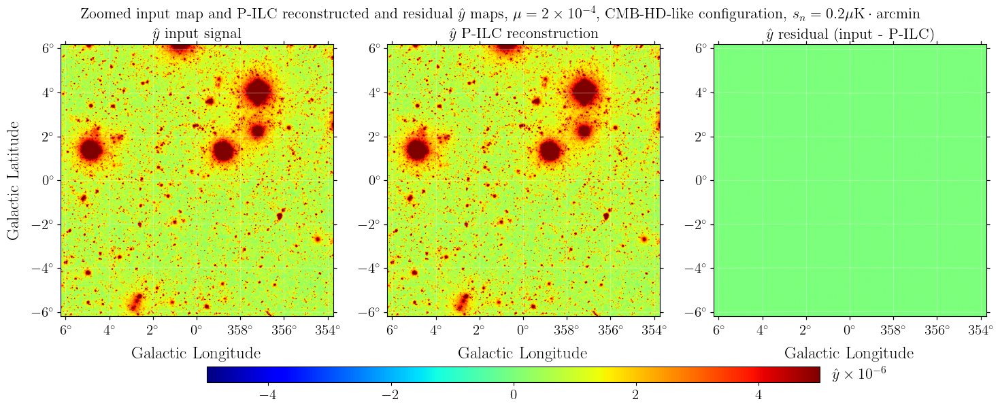

In [9]:
# ================= FULL WCS-BASED PLOTTING CELL --- P-ILC =================

import matplotlib.ticker as ticker

# --- Parameters ---
params_zoom_y = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-6, 'max': 5*10**-6}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_y['rot'],
    xsize=params_zoom_y['xsize'],
    reso=params_zoom_y['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(y_map, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_2 = hp.gnomview(y_hat_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_3 = hp.gnomview(y_residual_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_y)

# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS PER A SUBPLOTS ---
# ============================================================================
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 13,               # Llegenda ben clara i ajustada per a densitat
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15,                # Números de l'eix y
    "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
})
# --- Plot (Augmentem lleugerament l'alçada per encabir bé la barra horitzontal a sota) ---
fig = plt.figure(figsize=(15, 6.5))


# Panel 1
ax1 = plt.subplot(1, 3, 1, projection=wcs)
im1 = ax1.imshow(proj_map_1, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax1.set_title(rf"$\hat{{y}}$ input signal")
ax1.coords.grid(True, color='white', alpha=0.3)

# Panel 2
ax2 = plt.subplot(1, 3, 2, projection=wcs)
im2 = ax2.imshow(proj_map_2, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax2.set_title(rf"$\hat{{y}}$ P-ILC reconstruction")
ax2.coords.grid(True, color='white', alpha=0.3)

# Panel 3
ax3 = plt.subplot(1, 3, 3, projection=wcs)
im3 = ax3.imshow(proj_map_3, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax3.set_title(rf"$\hat{{y}}$ residual (input - P-ILC)")
ax3.coords.grid(True, color='white', alpha=0.3)

# --- Axis labels (Neteja visual: posem Longitude a tots, però Latitude només a la primera) ---
ax1.coords[0].set_axislabel("Galactic Longitude")
ax1.coords[1].set_axislabel("Galactic Latitude")
ax2.coords[0].set_axislabel("Galactic Longitude")
ax2.coords[1].set_axislabel("") # Eliminem labels duplicats interiors perquè no xequin
ax3.coords[0].set_axislabel("Galactic Longitude")
ax3.coords[1].set_axislabel("") 

# ============================================================================
# --- IMPLEMENTACIÓ DE LA COLORBAR UNIFICADA HORITZONTAL ---
# ============================================================================
cbar = fig.colorbar(
    im1, 
    ax=[ax1, ax2, ax3], 
    orientation='horizontal', 
    fraction=0.045,      
    pad=-0.2,            
    aspect=40            
)

# 1. Configuren el format científic normal perquè els números de la barra s'actualitzin (-5, 0, 5)
cbar.formatter = ticker.ScalarFormatter(useMathText=True)
cbar.formatter.set_scientific(True)
cbar.formatter.set_powerlimits((-3, 3))
cbar.update_ticks()

# --- TRUC CRÍTIC: ELIMINEM L'ETIQUETA AUTOMÀTICA VELLA I EN PERMETEM LA NOSTRA ---
# 2. Agafem l'offset de l'eix X (que és el que es genera a baix a la dreta) i l'ocultem completament
cbar.ax.xaxis.get_offset_text().set_visible(False)

# 3. EXTRAIEM L'EXPONENT DIRECTAMENT DEL LÍMIT REAL DE RECOLECCIÓ DELS PLOTS (5e-6)
# math.log10(5 * 10**-6) dona -5.30. Amb math.floor() ho forcem a -6 de forma exacta.
if params_zoom_y['max'] > 0:
    calculated_exponent = int(math.floor(math.log10(params_zoom_y['max'])))
else:
    calculated_exponent = -6  # Valor de seguretat per defecte

# 4. CREEM L'ETIQUETA COHERENT SENSE CORXETS SEGONS LA TEVA PETICIÓ
colorbar_label = rf"$\hat{{y}} \times 10^{{{calculated_exponent}}}$"

# 5. AFEGIM EL NOSTRE TEXT PERSONALITZAT COL·LOCAT MANUALMENT I PERFECTAMENT ALINEAT
cbar.ax.text(
    1.02, 0.5, 
    colorbar_label, 
    transform=cbar.ax.transAxes, 
    fontsize=16, 
    va='center', 
    ha='left'
)

# --- Title & layout ---
plt.suptitle(rf"Zoomed input map and P-ILC reconstructed and residual $\hat{{y}}$ maps, $\mu = {mu/1e-4:.0f} \times 10^{{-4}}$, CMB-HD-like configuration, $s_n = {base_sensitivity_uk_arcmin} \mu\mathrm{{K\cdot arcmin}}$",
             fontsize=16, y=0.96, x=0.5, ha='center', va='top')

# Utilitzem tight_layout i tanquem de seguretat per la memòria (evita el MallocStackLogging del teu Mac)
plt.tight_layout()

# --- Save ---
from pathlib import Path
save_path = Path(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/y_maps/P-ILC_zoomed_maps_WCS.pdf')
save_path.parent.mkdir(parents=True, exist_ok=True)
print("Saving figure to:", save_path)

plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
plt.close('all') # Neteja radical de memòria RAM

Saving multi-colorbar WCS figure to: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_2e-04_Zegeye_0.2muK/y_maps/P-ILC_zoomed_maps_WCS_3cbars.pdf


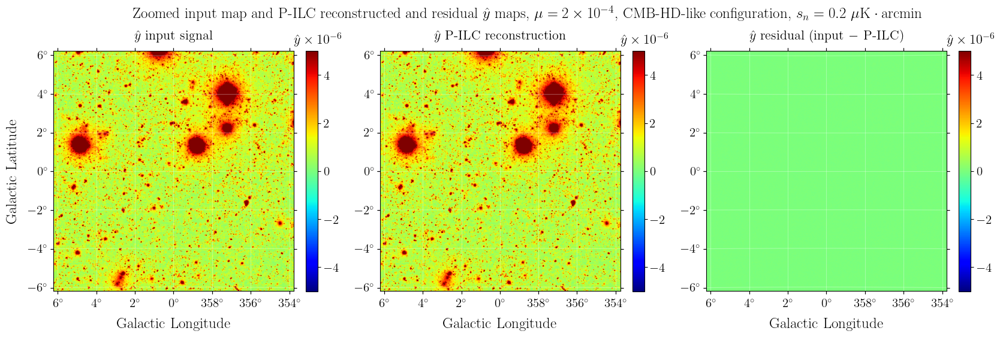

In [11]:
# ================= FULL WCS-BASED PLOTTING CELL --- P-CILC (3-CBARS) =================

import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from pathlib import Path
import healpy as hp

# --- Parameters ---
params_zoom_y = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-6, 'max': 5*10**-6}
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-9, 'max': 5*10**-9}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_y['rot'],
    xsize=params_zoom_y['xsize'],
    reso=params_zoom_y['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(y_map, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_2 = hp.gnomview(y_hat_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_3 = hp.gnomview(y_residual_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_y)

maps = [proj_map_1, proj_map_2, proj_map_3]
titles = [
    rf"$\hat{{y}}$ input signal", 
    rf"$\hat{{y}}$ P-ILC reconstruction", 
    rf"$\hat{{y}}$ residual (input $-$ P-ILC)"
]

# --- DEFINICIÓ MANUAL DE L'ESCALA MÀXIMA PER A CADA MAPA WCS ---
# Modifica aquests 3 valors manualment per ajustar el rang dinàmic de cada canal
v_max_manuals = [5e-6, 5e-6, 5e-6]

# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS ---
# ============================================================================
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 13,               # Llegenda ben clara i ajustada per a densitat
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15,                # Números de l'eix y
    "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
})

# Creem el llenç ample per encabir de forma neta les 3 colorbars verticals
fig = plt.figure(figsize=(18, 6.5))

for i in range(3):
    # Inicialitzem el subplot injectant les coordenades WCS astronòmiques reals
    ax = plt.subplot(1, 3, i + 1, projection=wcs)
    
    v_max_local = v_max_manuals[i]
    v_min_local = -v_max_local
    
    # Renderitzat simètric amb l'escala forçada manualment
    im = ax.imshow(maps[i], origin='lower', cmap='jet', vmin=v_min_local, vmax=v_max_local)
    
    ax.set_title(titles[i], pad=14, weight='bold')
    ax.coords.grid(True, color='white', alpha=0.3)
    
    # Eixos i neteja visual de labels duplicats en coordenades galàctiques
    ax.coords[0].set_axislabel("Galactic Longitude")
    if i == 0:
        ax.coords[1].set_axislabel("Galactic Latitude")
    else:
        ax.coords[1].set_axislabel("") # Amaguem la brossa de text interior

    # --- GESTIÓ INDEPENDENT DE CADA BARRA DE COLOR VERTICAL ---
    # shrink=0.85 i pad=0.04 fa que la barra s'estiri verticalment de forma ideal sota WCS
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.04, shrink=0.95)
    
    # Purga de la notació automàtica superior original de Matplotlib
    cbar.formatter = ticker.ScalarFormatter(useMathText=True)
    cbar.formatter.set_scientific(True)
    cbar.formatter.set_powerlimits((-3, 3))
    cbar.update_ticks()
    cbar.ax.yaxis.get_offset_text().set_visible(False)
    
    # Extracció matemàtica exacta de l'exponent local des del teu v_max_manual
    local_exponent = int(math.floor(math.log10(v_max_local)))

    # Injectem el nostre text polidíssim a dalt de tot de cada barra vertical (x=0, y=1.03)
    cbar_label = rf"$\hat{{y}} \times 10^{{{local_exponent}}}$"
    cbar.ax.text(
        -1.0, 1.02, 
        cbar_label, 
        transform=cbar.ax.transAxes, 
        fontsize=16, 
        va='bottom', 
        ha='left'
    )

# --- SUPER-TÍTOL EN FORMAT GRANS DIMENSIONS SENSE ENTORNS PERILLOSOS ---
title_text = (rf"Zoomed input map and P-ILC reconstructed and residual $\hat{{y}}$ maps, $\mu = {mu/1e-4:.0f} \times 10^{{-4}}$, CMB-HD-like configuration, $s_n = {base_sensitivity_uk_arcmin}\ \mu\mathrm{{K\cdot arcmin}}$")

plt.suptitle(title_text, fontsize=18, y=0.9, va='top', ha='center')

# Distribució quirúrgica de subplots: fixem wspace=0.25 perquè les colorbars tinguin espai net per respirar
fig.subplots_adjust(left=0.06, right=0.94, bottom=0.15, top=0.8, wspace=0.1)

# --- Save Engine ---
save_path = Path(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/y_maps/P-ILC_zoomed_maps_WCS_3cbars.pdf')
save_path.parent.mkdir(parents=True, exist_ok=True)
print("Saving multi-colorbar WCS figure to:", save_path)

fig.savefig(save_path, dpi=300)
plt.show()
plt.close('all') # Alliberament radical del Mac de 8GB

### 3.2. P-ILC & H-ILC: $\mu y$-maps

/var/folders/pr/429w6vjs7g15jgb94g5_03_40000gn/T/ipykernel_13834/3968649892.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saving figure to: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_2e-04_Zegeye_0.2muK/mu_y_maps/P-ILC_zoomed_maps_WCS.pdf


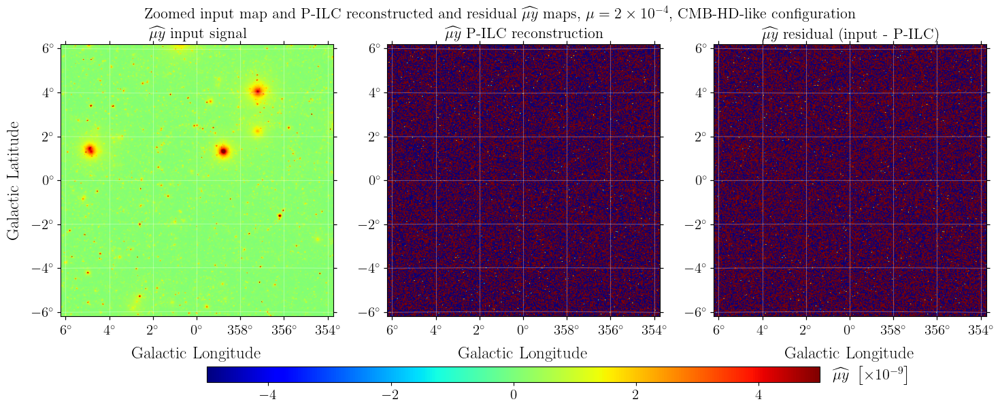

In [12]:
# ================= FULL WCS-BASED PLOTTING CELL --- P-ILC =================

# --- Parameters ---
params_zoom_y = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-6, 'max': 5*10**-6}
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-9, 'max': 5*10**-9}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_muy['rot'],
    xsize=params_zoom_muy['xsize'],
    reso=params_zoom_muy['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(muy_map, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_2 = hp.gnomview(muy_hat_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_3 = hp.gnomview(muy_residual_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_muy)

# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS PER A SUBPLOTS ---
# ============================================================================
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 13,               # Llegenda ben clara i ajustada per a densitat
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15,                # Números de l'eix y
    "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
})

# --- Plot (Augmentem lleugerament l'alçada per encabir bé la barra horitzontal a sota) ---
fig = plt.figure(figsize=(15, 6.5))

# Panel 1
ax1 = plt.subplot(1, 3, 1, projection=wcs)
im1 = ax1.imshow(proj_map_1, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax1.set_title(rf"$\widehat{{\mu y}}$ input signal")
ax1.coords.grid(True, color='white', alpha=0.3)

# Panel 2
ax2 = plt.subplot(1, 3, 2, projection=wcs)
im2 = ax2.imshow(proj_map_2, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax2.set_title(rf"$\widehat{{\mu y}}$ P-ILC reconstruction")
ax2.coords.grid(True, color='white', alpha=0.3)

# Panel 3
ax3 = plt.subplot(1, 3, 3, projection=wcs)
im3 = ax3.imshow(proj_map_3, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax3.set_title(rf"$\widehat{{\mu y}}$ residual (input - P-ILC)")
ax3.coords.grid(True, color='white', alpha=0.3)

# --- Axis labels (Neteja visual: posem Longitude a tots, però Latitude només a la primera) ---
ax1.coords[0].set_axislabel("Galactic Longitude")
ax1.coords[1].set_axislabel("Galactic Latitude")
ax2.coords[0].set_axislabel("Galactic Longitude")
ax2.coords[1].set_axislabel("") # Eliminem labels duplicats interiors perquè no xequin
ax3.coords[0].set_axislabel("Galactic Longitude")
ax3.coords[1].set_axislabel("") 

# ============================================================================
# --- IMPLEMENTACIÓ DE LA COLORBAR UNIFICADA HORITZONTAL ---
# ============================================================================
cbar = fig.colorbar(
    im1, 
    ax=[ax1, ax2, ax3], 
    orientation='horizontal', 
    fraction=0.045,      
    pad=-0.2,            
    aspect=40            
)

# 1. Configuren el format científic normal perquè els números de la barra s'actualitzin (-5, 0, 5)
cbar.formatter = ticker.ScalarFormatter(useMathText=True)
cbar.formatter.set_scientific(True)
cbar.formatter.set_powerlimits((-3, 3))
cbar.update_ticks()

# --- TRUC CRÍTIC: ELIMINEM L'ETIQUETA AUTOMÀTICA VELLA I EN PERMETEM LA NOSTRA ---
# 2. Agafem l'offset de l'eix X (que és el que es genera a baix a la dreta) i l'ocultem completament
cbar.ax.xaxis.get_offset_text().set_visible(False)

# 3. EXTRAIEM L'EXPONENT AUTOMÀTIC DE MANERA MATEMÀTICA DES DE params_zoom_muy['max']
# math.log10(5 * 10**-9) donarà aproximadament -8.30. Amb math.floor() ho forcem a -9 de forma exacta.
if params_zoom_muy['max'] > 0:
    params_max_exponent = int(math.floor(math.log10(params_zoom_muy['max'])))
else:
    params_max_exponent = -9  # Valor de seguretat per defecte

# 4. CREEM L'ETIQUETA COMPLETA AUTOCONSISTENT (Usant la nova variable fixa del diccionari)
colorbar_label = rf"$\widehat{{\mu y}}\ \left[\times 10^{{{params_max_exponent}}}\right]$"

# 5. AFEGIM EL NOSTRE TEXT PERSONALITZAT COL·LOCAT MANUALMENT I PERFECTAMENT ALINEAT
cbar.ax.text(
    1.02, 0.5, 
    colorbar_label, 
    transform=cbar.ax.transAxes, 
    fontsize=16, 
    va='center', 
    ha='left'
)

# --- Title & layout ---
plt.suptitle(rf"Zoomed input map and P-ILC reconstructed and residual $\widehat{{\mu y}}$ maps, $\mu = {mu/1e-4:.0f} \times 10^{{-4}}$, CMB-HD-like configuration", fontsize=16, y=0.96)

# Utilitzem tight_layout i tanquem de seguretat per la memòria (evita el MallocStackLogging del teu Mac)
plt.tight_layout()

# --- Save ---
from pathlib import Path
save_path = Path(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/mu_y_maps/P-ILC_zoomed_maps_WCS.pdf')
save_path.parent.mkdir(parents=True, exist_ok=True)
print("Saving figure to:", save_path)

plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
plt.close('all') # Neteja radical de memòria RAM

Saving multi-colorbar WCS figure to: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_2e-04_Zegeye_0.2muK/mu_y_maps/P-ILC_zoomed_maps_WCS.pdf


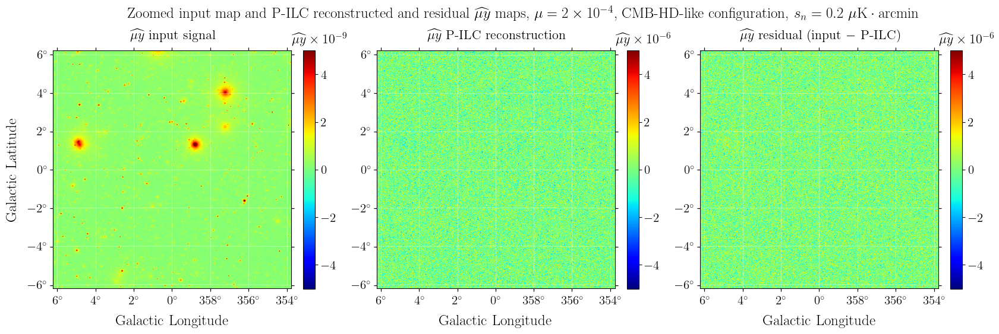

In [13]:
# ================= FULL WCS-BASED PLOTTING CELL --- P-ILC (3-CBARS FIXED) =================

import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from pathlib import Path
import healpy as hp

# --- Parameters ---
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'min': -5*10**-9, 'max': 5*10**-9}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_muy['rot'],
    xsize=params_zoom_muy['xsize'],
    reso=params_zoom_muy['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(muy_map, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_2 = hp.gnomview(muy_hat_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_3 = hp.gnomview(muy_residual_pixel_ilc, return_projected_map=True, no_plot=True, **params_zoom_muy)

maps = [proj_map_1, proj_map_2, proj_map_3]
titles = [
    rf"$\widehat{{\mu y}}$ input signal", 
    rf"$\widehat{{\mu y}}$ P-ILC reconstruction", 
    rf"$\widehat{{\mu y}}$ residual (input $-$ P-ILC)"
]

# --- DEFINICIÓ MANUAL DE L'ESCALA MÀXIMA PER A CADA MAPA WCS ---
# Modifica aquests 3 valors manualment per ajustar el rang dinàmic de cada canal
v_max_manuals = [5e-9, 5e-6, 5e-6]

# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS ---
# ============================================================================
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 13,               # Llegenda ben clara i ajustada per a densitat
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15,                # Números de l'eix y
    "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
})

# Creem el llenç ample per encabir de forma neta les 3 colorbars verticals
fig = plt.figure(figsize=(18, 6.5))

for i in range(3):
    # Inicialitzem el subplot injectant les coordenades WCS astronòmiques reals
    ax = plt.subplot(1, 3, i + 1, projection=wcs)
    
    v_max_local = v_max_manuals[i]
    v_min_local = -v_max_local
    
    # Renderitzat simètric amb l'escala forçada manualment
    im = ax.imshow(maps[i], origin='lower', cmap='jet', vmin=v_min_local, vmax=v_max_local)
    
    ax.set_title(titles[i], pad=14, weight='bold')
    ax.coords.grid(True, color='white', alpha=0.3)
    
    # Eixos i neteja visual de labels duplicats en coordenades galàctiques
    ax.coords[0].set_axislabel("Galactic Longitude")
    if i == 0:
        ax.coords[1].set_axislabel("Galactic Latitude")
    else:
        ax.coords[1].set_axislabel("") # Amaguem la brossa de text interior

    # --- GESTIÓ INDEPENDENT DE CADA BARRA DE COLOR VERTICAL ---
    # shrink=0.85 i pad=0.04 fa que la barra s'estiri verticalment de forma ideal sota WCS
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.04, shrink=0.95)
    
    # Purga de la notació automàtica superior original de Matplotlib
    cbar.formatter = ticker.ScalarFormatter(useMathText=True)
    cbar.formatter.set_scientific(True)
    cbar.formatter.set_powerlimits((-3, 3))
    cbar.update_ticks()
    cbar.ax.yaxis.get_offset_text().set_visible(False)
    
    # Extracció matemàtica exacta de l'exponent local des del teu v_max_manual
    local_exponent = int(math.floor(math.log10(v_max_local)))
    
    # Injectem el nostre text polidíssim a dalt de tot de cada barra vertical (x=0, y=1.03)
    cbar_label = rf"$\widehat{{\mu y}} \times 10^{{{local_exponent}}}$"
    cbar.ax.text(
        -1.0, 1.02, 
        cbar_label, 
        transform=cbar.ax.transAxes, 
        fontsize=16, 
        va='bottom', 
        ha='left'
    )

# --- SUPER-TÍTOL EN FORMAT GRANS DIMENSIONS SENSE ENTORNS PERILLOSOS ---
plt.suptitle(rf"Zoomed input map and P-ILC reconstructed and residual $\widehat{{\mu y}}$ maps, $\mu = {mu/1e-4:.0f} \times 10^{{-4}}$, CMB-HD-like configuration, $s_n = {base_sensitivity_uk_arcmin}\ \mu\mathrm{{K\cdot arcmin}}$",
             fontsize=18, y=0.9, va='top', ha='center')

# Distribució quirúrgica de subplots: fixem wspace=0.25 perquè les colorbars tinguin espai net per respirar
fig.subplots_adjust(left=0.06, right=0.94, bottom=0.15, top=0.8, wspace=0.1)

# Utilitzem tight_layout i tanquem de seguretat per la memòria (evita el MallocStackLogging del teu Mac)
#plt.tight_layout()


# --- Save Engine ---
save_path = Path(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/mu_y_maps/P-ILC_zoomed_maps_WCS.pdf')
save_path.parent.mkdir(parents=True, exist_ok=True)
print("Saving multi-colorbar WCS figure to:", save_path)

fig.savefig(save_path, dpi=300)
plt.show()
plt.close('all') # Alliberament radical del Mac de 8GB

### 3.3. P-CILC: $y$-maps

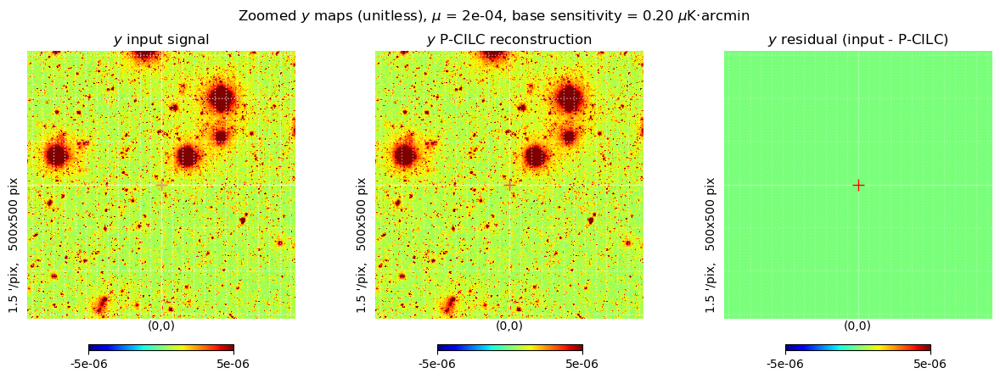

In [39]:
### A.1. PIXEL CILC ZOOMED MAPS ###

params_zoom = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-6, 'max': 5*10**-6} # Added 'coord': 'G' to specify Galactic coordinates
#params_zoom = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True}

# --- Plotting ---
fig_harm = plt.figure(figsize=(15, 5))

ax1 = plt.subplot(1, 3, 1)
hp.gnomview(y_map, title=rf"$y$ input signal", **params_zoom)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax2 = plt.subplot(1, 3, 2)
hp.gnomview(y_hat_pixel_cilc, title=rf"$y$ P-CILC reconstruction", **params_zoom)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax3 = plt.subplot(1, 3, 3)
hp.gnomview(y_residual_pixel_cilc, title=rf"$y$ residual (input - P-CILC)", **params_zoom)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

plt.suptitle(rf"Zoomed $y$ maps (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/y_maps/P-CILC_zoomed_maps.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [40]:
# --- Build WCS matching healpy gnomonic projection ---
def build_gnomonic_wcs(rot, xsize, reso):
    w = WCS(naxis=2)

    cdelt = reso / 60.0  # deg/pixel

    # Reference pixel (center)
    w.wcs.crpix = [xsize / 2, xsize / 2]

    # Reference sky coordinate
    w.wcs.crval = [rot[0], rot[1]]

    # Projection type (Galactic TAN = gnomonic)
    w.wcs.ctype = ["GLON-TAN", "GLAT-TAN"]

    # For Equatorial coordinates, use:
    #w.wcs.ctype = ["RA---TAN", "DEC--TAN"]

    # Pixel scale (flip x-axis for correct orientation)
    w.wcs.cdelt = [-cdelt, cdelt]

    return w

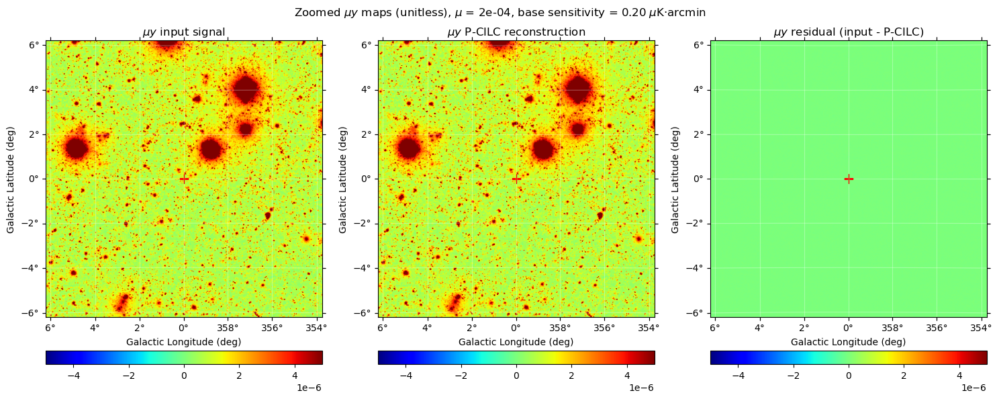

In [41]:
# ================= FULL WCS-BASED PLOTTING CELL =================

# --- Parameters ---
params_zoom_y = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-6, 'max': 5*10**-6}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_y['rot'],
    xsize=params_zoom_y['xsize'],
    reso=params_zoom_y['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(y_map, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_2 = hp.gnomview(y_hat_pixel_cilc, return_projected_map=True, no_plot=True, **params_zoom_y)
proj_map_3 = hp.gnomview(y_residual_pixel_cilc, return_projected_map=True, no_plot=True, **params_zoom_y)

# --- Plot ---
fig = plt.figure(figsize=(15, 6))

# Panel 1
ax1 = plt.subplot(1, 3, 1, projection=wcs)
im1 = ax1.imshow(proj_map_1, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax1.set_title(rf"$\mu y$ input signal")
ax1.coords.grid(True, color='white', alpha=0.3)
ax1.plot(params_zoom_y['xsize']/2, params_zoom_y['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# Panel 2
ax2 = plt.subplot(1, 3, 2, projection=wcs)
im2 = ax2.imshow(proj_map_2, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax2.set_title(rf"$\mu y$ P-CILC reconstruction")
ax2.coords.grid(True, color='white', alpha=0.3)
ax2.plot(params_zoom_y['xsize']/2, params_zoom_y['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# Panel 3
ax3 = plt.subplot(1, 3, 3, projection=wcs)
im3 = ax3.imshow(proj_map_3, origin='lower', cmap='jet',
                 vmin=params_zoom_y['min'], vmax=params_zoom_y['max'])
ax3.set_title(rf"$\mu y$ residual (input - P-CILC)")
ax3.coords.grid(True, color='white', alpha=0.3)
ax3.plot(params_zoom_y['xsize']/2, params_zoom_y['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# --- Axis labels (only left & bottom for cleanliness) ---
ax1.coords[0].set_axislabel("Galactic Longitude (deg)")
ax1.coords[1].set_axislabel("Galactic Latitude (deg)")
ax2.coords[0].set_axislabel("Galactic Longitude (deg)")
ax2.coords[1].set_axislabel("Galactic Latitude (deg)")
ax3.coords[0].set_axislabel("Galactic Longitude (deg)")
ax3.coords[1].set_axislabel("Galactic Latitude (deg)")

fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.1, orientation='horizontal')
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.1, orientation='horizontal')
fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.1, orientation='horizontal')

#cbar = fig.colorbar(im1, ax=[ax1, ax2, ax3], fraction=0.075, pad=0.15, orientation='horizontal')
#cbar.ax.tick_params(labelsize=10)

# --- Title & layout ---
plt.suptitle(rf"Zoomed $\mu y$ maps (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.tight_layout()

# --- Save ---
plt.savefig(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/y_maps/P-CILC_zoomed_maps_WCS.pdf', dpi=300, bbox_inches='tight')
plt.show()

### 3.4. P-CILC: $\mu y$-maps

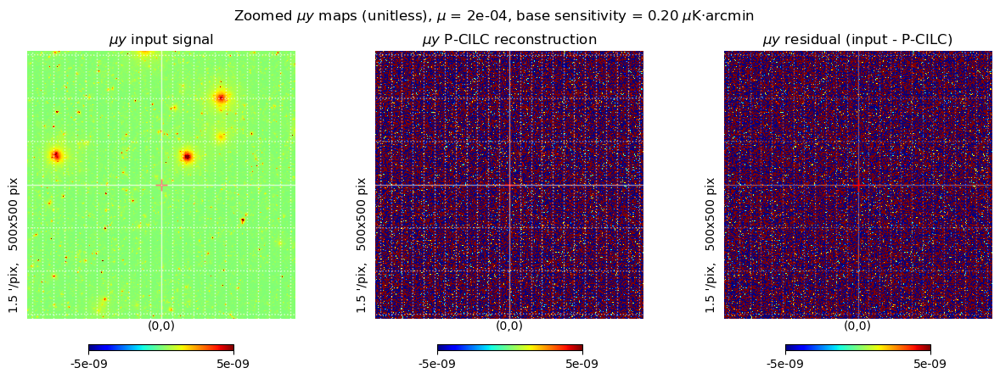

In [10]:
### A.1. PIXEL CILC ZOOMED MAPS ###

params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-9, 'max': 5*10**-9} # Added 'coord': 'G' to specify Galactic coordinates
#params_zoom = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True}

# --- Plotting ---
fig_harm = plt.figure(figsize=(15, 5))

ax1 = plt.subplot(1, 3, 1)
hp.gnomview(muy_map, title=rf"$\mu y$ input signal", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax2 = plt.subplot(1, 3, 2)
hp.gnomview(muy_hat_pixel_cilc, title=rf"$\mu y$ P-CILC reconstruction", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax3 = plt.subplot(1, 3, 3)
hp.gnomview(muy_residual_pixel_cilc, title=rf"$\mu y$ residual (input - P-CILC)", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

plt.suptitle(rf"Zoomed $\mu y$ maps (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/mu_y_maps/P-CILC_zoomed_maps.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [11]:
# --- Build WCS matching healpy gnomonic projection ---
def build_gnomonic_wcs(rot, xsize, reso):
    w = WCS(naxis=2)

    cdelt = reso / 60.0  # deg/pixel

    # Reference pixel (center)
    w.wcs.crpix = [xsize / 2, xsize / 2]

    # Reference sky coordinate
    w.wcs.crval = [rot[0], rot[1]]

    # Projection type (Galactic TAN = gnomonic)
    w.wcs.ctype = ["GLON-TAN", "GLAT-TAN"]

    # For Equatorial coordinates, use:
    #w.wcs.ctype = ["RA---TAN", "DEC--TAN"]

    # Pixel scale (flip x-axis for correct orientation)
    w.wcs.cdelt = [-cdelt, cdelt]

    return w

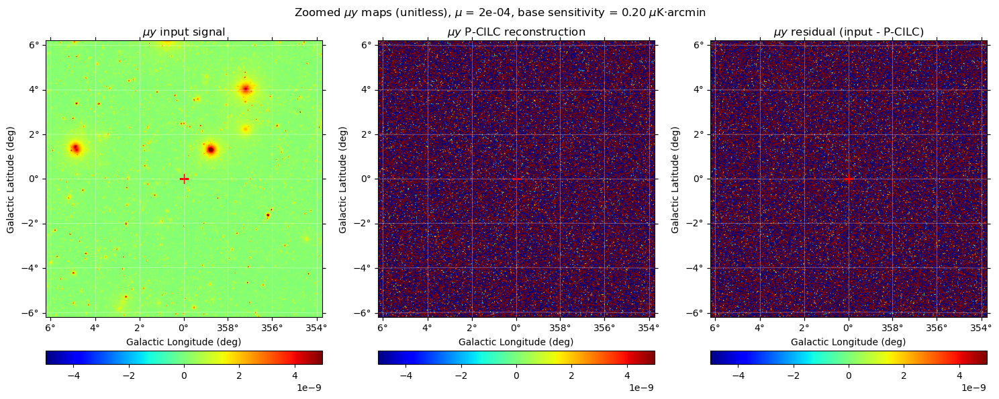

In [12]:
# ================= FULL WCS-BASED PLOTTING CELL =================

# --- Parameters ---
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': True, 'min': -5*10**-9, 'max': 5*10**-9}

# --- Build WCS ---
wcs = build_gnomonic_wcs(
    rot=params_zoom_muy['rot'],
    xsize=params_zoom_muy['xsize'],
    reso=params_zoom_muy['reso']
)

# --- Get projected maps from healpy ---
proj_map_1 = hp.gnomview(muy_map, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_2 = hp.gnomview(muy_hat_pixel_cilc, return_projected_map=True, no_plot=True, **params_zoom_muy)
proj_map_3 = hp.gnomview(muy_residual_pixel_cilc, return_projected_map=True, no_plot=True, **params_zoom_muy)

# --- Plot ---
fig = plt.figure(figsize=(15, 6))

# Panel 1
ax1 = plt.subplot(1, 3, 1, projection=wcs)
im1 = ax1.imshow(proj_map_1, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax1.set_title(rf"$\mu y$ input signal")
ax1.coords.grid(True, color='white', alpha=0.3)
ax1.plot(params_zoom_muy['xsize']/2, params_zoom_muy['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# Panel 2
ax2 = plt.subplot(1, 3, 2, projection=wcs)
im2 = ax2.imshow(proj_map_2, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax2.set_title(rf"$\mu y$ P-CILC reconstruction")
ax2.coords.grid(True, color='white', alpha=0.3)
ax2.plot(params_zoom_muy['xsize']/2, params_zoom_muy['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# Panel 3
ax3 = plt.subplot(1, 3, 3, projection=wcs)
im3 = ax3.imshow(proj_map_3, origin='lower', cmap='jet',
                 vmin=params_zoom_muy['min'], vmax=params_zoom_muy['max'])
ax3.set_title(rf"$\mu y$ residual (input - P-CILC)")
ax3.coords.grid(True, color='white', alpha=0.3)
ax3.plot(params_zoom_muy['xsize']/2, params_zoom_muy['xsize']/2, marker='+', color='red', markersize=10, label='Center')

# --- Axis labels (only left & bottom for cleanliness) ---
ax1.coords[0].set_axislabel("Galactic Longitude (deg)")
ax1.coords[1].set_axislabel("Galactic Latitude (deg)")
ax2.coords[0].set_axislabel("Galactic Longitude (deg)")
ax2.coords[1].set_axislabel("Galactic Latitude (deg)")
ax3.coords[0].set_axislabel("Galactic Longitude (deg)")
ax3.coords[1].set_axislabel("Galactic Latitude (deg)")

fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.1, orientation='horizontal')
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.1, orientation='horizontal')
fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.1, orientation='horizontal')

#cbar = fig.colorbar(im1, ax=[ax1, ax2, ax3], fraction=0.075, pad=0.15, orientation='horizontal')
#cbar.ax.tick_params(labelsize=10)

# --- Title & layout ---
plt.suptitle(rf"Zoomed $\mu y$ maps (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.tight_layout()

# --- Save ---
plt.savefig(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/mu_y_maps/P-CILC_zoomed_maps_WCS.pdf', dpi=300, bbox_inches='tight')
plt.show()

## 4. P-ILC Vs. P-CILC

### 4.1. $y$-maps

In [45]:
### PIXEL ILC VS CILC RESIDUALS ###

# Calculate the residual difference between P-ILC and P-CILC
y_residual_pcilc_pilc = y_hat_pixel_ilc - y_hat_pixel_cilc

print(f"Max Residual (P-ILC): {np.max(y_residual_pixel_ilc):.2e}")
print(f"Max Residual (P-CILC): {np.max(y_residual_pixel_cilc):.2e}")
print(f"Max Residual Difference (P-ILC - P-CILC): {np.max(y_residual_pcilc_pilc):.2e}")

Max Residual (P-ILC): 1.62e-07
Max Residual (P-CILC): 1.42e-07
Max Residual Difference (P-ILC - P-CILC): 1.66e-07


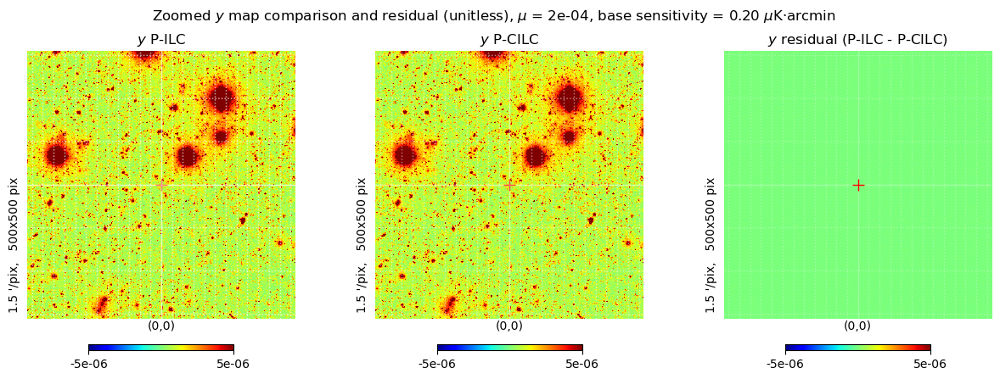

In [85]:
### PLOT THE RESIDUAL DIFFERENCE BETWEEN P-ILC AND P-CILC ###

params_zoom_y = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-6, 'max': 5*10**-6}
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-8, 'max': 5*10**-8}
#params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-13, 'max': 5*10**-13}

# Plotting the residual difference
fig_residual_comparison = plt.figure(figsize=(15, 5))

ax1 = plt.subplot(1, 3, 1)
hp.gnomview(y_hat_pixel_ilc, title=rf"$y$ P-ILC", **params_zoom_y)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax2 = plt.subplot(1, 3, 2)
hp.gnomview(y_hat_pixel_cilc, title=rf"$y$ P-CILC", **params_zoom_y)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax3 = plt.subplot(1, 3, 3)
hp.gnomview(y_residual_pcilc_pilc, title=rf"$y$ residual (P-ILC - P-CILC)", **params_zoom_y)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')
plt.suptitle(rf"Zoomed $y$ map comparison and residual (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.savefig(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_VS_CILC_{mu:.0e}/y_maps/Residual_Comparison_P-CILC_VS_P-ILC.pdf', dpi=300, bbox_inches='tight')
plt.show()

### 4.2. $\mu y$-maps

In [47]:
### PIXEL ILC VS CILC RESIDUALS for muy-map ###

# Calculate the residual difference between P-ILC and P-CILC
muy_residual_pcilc_pilc = muy_hat_pixel_ilc - muy_hat_pixel_cilc

print(f"Max Residual (P-ILC): {np.max(muy_residual_pixel_ilc):.2e}")
print(f"Max Residual (P-CILC): {np.max(muy_residual_pixel_cilc):.2e}")
print(f"Max Residual Difference (P-ILC - P-CILC): {np.max(muy_residual_pcilc_pilc):.2e}")

Max Residual (P-ILC): 4.92e-06
Max Residual (P-CILC): 4.15e-07
Max Residual Difference (P-ILC - P-CILC): 4.04e-06


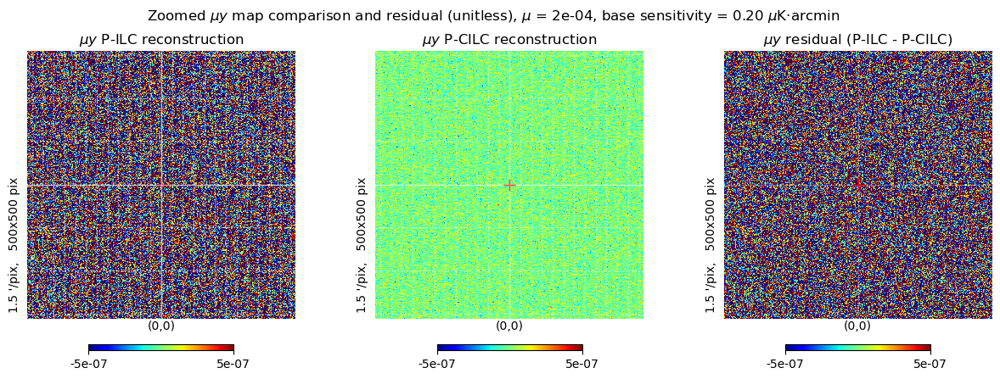

In [86]:
### PLOT THE RESIDUAL DIFFERENCE BETWEEN P-ILC AND P-CILC ###

#params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-9, 'max': 5*10**-9}
params_zoom_muy = {'rot': [0, 0], 'reso': 1.5, 'xsize': 500, 'hold': True, 'cmap': 'jet', 'notext': False, 'min': -5*10**-7, 'max': 5*10**-7}

# Plotting the residual difference
fig_residual_comparison = plt.figure(figsize=(15, 5))

ax1 = plt.subplot(1, 3, 1)
hp.gnomview(muy_hat_pixel_ilc, title=rf"$\mu y$ P-ILC reconstruction", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax2 = plt.subplot(1, 3, 2)
hp.gnomview(muy_hat_pixel_cilc, title=rf"$\mu y$ P-CILC reconstruction", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')

ax3 = plt.subplot(1, 3, 3)
hp.gnomview(muy_residual_pcilc_pilc, title=rf"$\mu y$ residual (P-ILC - P-CILC)", **params_zoom_muy)
hp.graticule(dpar=0.5, dmer=0.5, color='white', alpha=0.3)
plt.plot(0, 0, marker='+', color='red', markersize=10, label='Center')
plt.suptitle(rf"Zoomed $\mu y$ map comparison and residual (unitless), $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin")
plt.savefig(f'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/ILC_VS_CILC_{mu:.0e}/mu_y_maps/Residual_Comparison_P-CILC_VS_P-ILC.pdf', dpi=300, bbox_inches='tight')
plt.show()

## 5. Stacking

### 5.1. Calculating cluster galactic coordinates: (l,b)

In [7]:
### DEFINITION FOR READING THE 10^x BRIGHTEST CLUSTERS FROM THE .TXT FILE ###

def read_coords_from_txt(n_label):
    input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.txt"
    coords = []
    with open(input_path, 'r') as f:
        # Skip the 2 header lines
        lines = f.readlines()[2:]
        for line in lines:
            if line.strip(): # ignore empty lines
                lon_str, lat_str = line.split(",")
                coords.append((float(lon_str), float(lat_str)))
    print(f"Read {len(coords)} coordinates from {input_path}")
    return coords

### $10^3$

In [14]:
def get_brightest_cluster_coords(y_map, n_clusters=1000, min_dist_deg=1.0):
    """Finds the coordinates of the n brightest clusters."""
    # Create a copy to avoid modifying original
    temp_map = np.copy(y_map)
    nside = hp.npix2nside(len(temp_map))
    coords = []
    
    for i in range(n_clusters):
        # Find pixel with maximum value
        pix_max = np.argmax(temp_map)
        
        # Convert to Galactic coordinates
        theta, phi = hp.pix2ang(nside, pix_max)
        lon = np.degrees(phi)
        lat = 90 - np.degrees(theta)
        coords.append((lon, lat))
        
        # Zero out the surrounding area so we don't pick the same cluster
        # A 1-degree radius is usually enough for WebSky clusters
        vec = hp.pix2vec(nside, pix_max)
        disc_pix = hp.query_disc(nside, vec, radius=np.radians(min_dist_deg))
        temp_map[disc_pix] = 0
        
    return coords

In [15]:
### EXTRACTING THE COORDINATES OF THE 10^3 BRIGHTEST CLUSTERS ###
cluster_coords_10e3 = get_brightest_cluster_coords(y_map, n_clusters=1000, min_dist_deg=1.0)
print(f"Coordinates of the {len(cluster_coords_10e3)} brightest clusters.")
print("Only the first 10 are shown for brevity (lon, lat) in degrees):")
for i, (lon, lat) in enumerate(cluster_coords_10e3[:5]):  # Print only the first 10 for brevity
    print(f"{i+1}: (lon: {lon:.2f}, lat: {lat:.2f})")

Coordinates of the 1000 brightest clusters.
Only the first 10 are shown for brevity (lon, lat) in degrees):
1: (lon: 33.25, lat: -42.09)
2: (lon: 267.82, lat: -11.49)
3: (lon: 115.58, lat: -7.54)
4: (lon: 281.82, lat: -13.77)
5: (lon: 105.11, lat: 57.23)


In [19]:
### SAVE THE COORDINATES OF THE 10^3 BRIGHTEST CLUSTERS IN A .TXT FILE AND A .NPY FILE FOR FUTURE USE ###

# 1. Define and create the general directory
base_coord_dir = "/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/"
if not os.path.exists(base_coord_dir):
    os.makedirs(base_coord_dir)

# 2. Function to save coordinates (Human readable and Machine readable)
def save_cluster_coords(coords, n_label=1000):
    """
    coords: the list of (lon, lat) tuples
    n_label: string like '10e3', '10e4', or '10e5'
    """
    # Save as .npy for fast loading in Python (Highly Recommended)
    npy_path = os.path.join(base_coord_dir, f"coords_{n_label}.npy")
    np.save(npy_path, np.array(coords))
    
    # Save as .txt for human reading (Full list)
    txt_path = os.path.join(base_coord_dir, f"coords_{n_label}.txt")
    with open(txt_path, 'w') as f:
        f.write(f"Brightest Clusters Coordinates - Count: {len(coords)}\n")
        f.write("lon, lat (degrees)\n")
        for lon, lat in coords:
            f.write(f"{lon:.6f}, {lat:.6f}\n")
            
    print(f"Saved {len(coords)} coordinates to:")
    print(f"  - {npy_path}")
    print(f"  - {txt_path}")

# --- Usage ---
# Assuming you have your calculated coords in a variable:
save_cluster_coords(cluster_coords_10e3, "10e3")

Saved 1000 coordinates to:
  - /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e3.npy
  - /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e3.txt


In [20]:
### READ THE COORDINATES OF THE 10^3 BRIGHTEST CLUSTERS FROM THE .NPY FILE ###

n_label = "10e3" # or "10e4", etc.
input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.npy"

# Load and convert back to list of tuples
cluster_coords_10e3 = [tuple(x) for x in np.load(input_path)]

print(f"Read {len(cluster_coords_10e3)} coordinates from {input_path}")

Read 1000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e3.npy


In [21]:
### READ THE COORDINATES OF THE 10^3 BRIGHTEST CLUSTERS FROM THE .TXT FILE ###

def read_coords_from_txt(n_label):
    input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.txt"
    coords = []
    with open(input_path, 'r') as f:
        # Skip the 2 header lines
        lines = f.readlines()[2:]
        for line in lines:
            if line.strip(): # ignore empty lines
                lon_str, lat_str = line.split(",")
                coords.append((float(lon_str), float(lat_str)))
    print(f"Read {len(coords)} coordinates from {input_path}")
    return coords

# Usage:
cluster_coords_10e3 = read_coords_from_txt("10e3")

Read 1000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e3.txt


### $10^4$

In [33]:
def get_brightest_cluster_coords(y_map, n_clusters=10000, min_dist_deg=1.0):
    """Finds the coordinates of the n brightest clusters."""
    # Create a copy to avoid modifying original
    temp_map = np.copy(y_map)
    nside = hp.npix2nside(len(temp_map))
    coords = []
    
    for i in range(n_clusters):
        # Find pixel with maximum value
        pix_max = np.argmax(temp_map)
        
        # Convert to Galactic coordinates
        theta, phi = hp.pix2ang(nside, pix_max)
        lon = np.degrees(phi)
        lat = 90 - np.degrees(theta)
        coords.append((lon, lat))
        
        # Zero out the surrounding area so we don't pick the same cluster
        # A 1-degree radius is usually enough for WebSky clusters
        vec = hp.pix2vec(nside, pix_max)
        disc_pix = hp.query_disc(nside, vec, radius=np.radians(min_dist_deg))
        temp_map[disc_pix] = 0
        
    return coords

In [ ]:
### EXTRACTING THE COORDINATES OF THE 10^4 BRIGHTEST CLUSTERS ###
cluster_coords_10e4 = get_brightest_cluster_coords(y_map, n_clusters=10000, min_dist_deg=1.0)
print(f"Coordinates of the {len(cluster_coords_10e4)} brightest clusters.")
print("Only the first 10 are shown for brevity (lon, lat) in degrees):")
for i, (lon, lat) in enumerate(cluster_coords_10e4[:5]):  # Print only the first 10 for brevity
    print(f"{i+1}: (lon: {lon:.2f}, lat: {lat:.2f})")

Coordinates of the 500 brightest clusters.
Only the first 10 are shown for brevity (lon, lat) in degrees):
1: (lon: 33.25, lat: -42.09)
2: (lon: 267.82, lat: -11.49)
3: (lon: 115.58, lat: -7.54)
4: (lon: 281.82, lat: -13.77)
5: (lon: 105.11, lat: 57.23)
6: (lon: 207.55, lat: 14.38)
7: (lon: 262.53, lat: 16.78)
8: (lon: 318.82, lat: -6.56)
9: (lon: 88.10, lat: 51.88)
10: (lon: 146.18, lat: -14.09)


In [ ]:
### SAVE THE COORDINATES OF THE 10^4 BRIGHTEST CLUSTERS IN A .TXT FILE AND A .NPY FILE FOR FUTURE USE ###

# 1. Define and create the general directory
base_coord_dir = "/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/"
if not os.path.exists(base_coord_dir):
    os.makedirs(base_coord_dir)

# 2. Function to save coordinates (Human readable and Machine readable)
def save_cluster_coords(coords, n_label=10000):
    """
    coords: the list of (lon, lat) tuples
    n_label: string like '10e3', '10e4', or '10e5'
    """
    # Save as .npy for fast loading in Python (Highly Recommended)
    npy_path = os.path.join(base_coord_dir, f"coords_{n_label}.npy")
    np.save(npy_path, np.array(coords))
    
    # Save as .txt for human reading (Full list)
    txt_path = os.path.join(base_coord_dir, f"coords_{n_label}.txt")
    with open(txt_path, 'w') as f:
        f.write(f"Brightest Clusters Coordinates - Count: {len(coords)}\n")
        f.write("lon, lat (degrees)\n")
        for lon, lat in coords:
            f.write(f"{lon:.6f}, {lat:.6f}\n")
            
    print(f"Saved {len(coords)} coordinates to:")
    print(f"  - {npy_path}")
    print(f"  - {txt_path}")

# --- Usage ---
# Assuming you have your calculated coords in a variable:
save_cluster_coords(cluster_coords_10e4, "10e4")

Saved 10000 coordinates to:
  - /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e4.npy
  - /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e4.txt


In [ ]:
### READ THE COORDINATES OF THE 10^4 BRIGHTEST CLUSTERS FROM THE .NPY FILE ###

n_label = "10e4" # or "10e3", etc.
input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.npy"

# Load and convert back to list of tuples
cluster_coords_10e4 = [tuple(x) for x in np.load(input_path)]

print(f"Read {len(cluster_coords_10e4)} coordinates from {input_path}")

Read 10000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e4.npy


In [22]:
### READ THE COORDINATES OF THE 10^4 BRIGHTEST CLUSTERS FROM THE .TXT FILE ###

def read_coords_from_txt(n_label):
    input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.txt"
    coords = []
    with open(input_path, 'r') as f:
        # Skip the 2 header lines
        lines = f.readlines()[2:]
        for line in lines:
            if line.strip(): # ignore empty lines
                lon_str, lat_str = line.split(",")
                coords.append((float(lon_str), float(lat_str)))
    print(f"Read {len(coords)} coordinates from {input_path}")
    return coords

# Usage:
cluster_coords_10e4 = read_coords_from_txt("10e4")

Read 10000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e4.txt


### $10^5$

In [1]:
def get_brightest_cluster_coords(y_map, n_clusters=100000, min_dist_deg=1.0):
    """Finds the coordinates of the n brightest clusters."""
    # Create a copy to avoid modifying original
    temp_map = np.copy(y_map)
    nside = hp.npix2nside(len(temp_map))
    coords = []
    
    for i in range(n_clusters):
        # Find pixel with maximum value
        pix_max = np.argmax(temp_map)
        
        # Convert to Galactic coordinates
        theta, phi = hp.pix2ang(nside, pix_max)
        lon = np.degrees(phi)
        lat = 90 - np.degrees(theta)
        coords.append((lon, lat))
        
        # Zero out the surrounding area so we don't pick the same cluster
        # A 1-degree radius is usually enough for WebSky clusters
        vec = hp.pix2vec(nside, pix_max)
        disc_pix = hp.query_disc(nside, vec, radius=np.radians(min_dist_deg))
        temp_map[disc_pix] = 0
        
    return coords

In [ ]:
### EXTRACTING THE COORDINATES OF THE 10^5 BRIGHTEST CLUSTERS ###
cluster_coords_10e5 = get_brightest_cluster_coords(y_map, n_clusters=100000, min_dist_deg=1.0)
print(f"Coordinates of the {len(cluster_coords_10e5)} brightest clusters.")
print("Only the first 10 are shown for brevity (lon, lat) in degrees):")
for i, (lon, lat) in enumerate(cluster_coords_10e5[:5]):  # Print only the first 10 for brevity
    print(f"{i+1}: (lon: {lon:.2f}, lat: {lat:.2f})")

In [23]:
### SAVE THE COORDINATES OF THE 10^5 BRIGHTEST CLUSTERS IN A .TXT FILE AND A .NPY FILE FOR FUTURE USE ###

# 1. Define and create the general directory
base_coord_dir = "/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/"
if not os.path.exists(base_coord_dir):
    os.makedirs(base_coord_dir)

# 2. Function to save coordinates (Human readable and Machine readable)
def save_cluster_coords(coords, n_label=100000):
    """
    coords: the list of (lon, lat) tuples
    n_label: string like '10e3', '10e4', or '10e5'
    """
    # Save as .npy for fast loading in Python (Highly Recommended)
    npy_path = os.path.join(base_coord_dir, f"coords_{n_label}.npy")
    np.save(npy_path, np.array(coords))
    
    # Save as .txt for human reading (Full list)
    txt_path = os.path.join(base_coord_dir, f"coords_{n_label}.txt")
    with open(txt_path, 'w') as f:
        f.write(f"Brightest Clusters Coordinates - Count: {len(coords)}\n")
        f.write("lon, lat (degrees)\n")
        for lon, lat in coords:
            f.write(f"{lon:.6f}, {lat:.6f}\n")
            
    print(f"Saved {len(coords)} coordinates to:")
    print(f"  - {npy_path}")
    print(f"  - {txt_path}")

# --- Usage ---
# Assuming you have your calculated coords in a variable:
save_cluster_coords(cluster_coords_10e5, "10e5")

NameError: name 'cluster_coords_10e5' is not defined

In [ ]:
### READ THE COORDINATES OF THE 10^5 BRIGHTEST CLUSTERS FROM THE .NPY FILE ###

n_label = "10e5"
input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.npy"

# Load and convert back to list of tuples
cluster_coords_10e5 = [tuple(x) for x in np.load(input_path)]

print(f"Read {len(cluster_coords_10e5)} coordinates from {input_path}")

Read 100000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e5.npy


In [24]:
### READ THE COORDINATES OF THE 10^5 BRIGHTEST CLUSTERS FROM THE .TXT FILE ###

def read_coords_from_txt(n_label):
    input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.txt"
    coords = []
    with open(input_path, 'r') as f:
        # Skip the 2 header lines
        lines = f.readlines()[2:]
        for line in lines:
            if line.strip(): # ignore empty lines
                lon_str, lat_str = line.split(",")
                coords.append((float(lon_str), float(lat_str)))
    print(f"Read {len(coords)} coordinates from {input_path}")
    return coords

# Usage:
cluster_coords_10e5 = read_coords_from_txt("10e5")

Read 100000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e5.txt


### 5.2. Stacking clusters from $y$ and $\mu y$ maps

In [12]:
def stack_clusters(hp_map, coords, reso_arcmin=1.5, xsize=100):
    """Stacks small patches around specified coordinates."""
    stacked_patch = np.zeros((xsize, xsize))
    
    for lon, lat in coords:
        # Project a small area into a flat 2D patch
        patch = hp.gnomview(hp_map, rot=[lon, lat], reso=reso_arcmin, 
                            xsize=xsize, return_projected_map=True, no_plot=True)
        stacked_patch += patch
        
    return stacked_patch / len(coords)

### $10^3$

In [ ]:
### STACKING THE INPUT SIGNALS AROUND THE 10^3 BRIGHTEST CLUSTERS - test on the stacking method ###

# Use the truth maps first to verify the method)
stack_y_real_10e3 = stack_clusters(y_map, cluster_coords_10e3)
stack_muy_real_10e3 = stack_clusters(muy_map, cluster_coords_10e3)

In [ ]:
### SAVE THE STACKED INPUT SIGNALS IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps_10e3 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+03/"
path_y_real_10e3 = f"{path_stacked_maps_10e3}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map_{len(cluster_coords_10e3)}.fits"
path_muy_real_10e3 = f"{path_stacked_maps_10e3}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map_{len(cluster_coords_10e3)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_real_10e3, stack_y_real_10e3.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_real_10e3, stack_muy_real_10e3.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_real_10e3.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_real_10e3.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e3)}")
print(f"Stacked Patch shapes (y, mu_y): {stack_y_real_10e3.shape}, {stack_muy_real_10e3.shape}") # This will now be (100, 100)
print(f"Data dtypes (y, mu_y): {stack_y_real_10e3.dtype}, {stack_muy_real_10e3.dtype}")
print(f"Memory usage (y, mu_y): {stack_y_real_10e3.nbytes / 1e6:.2f} MB, {stack_muy_real_10e3.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'Input_6freq_0.2muK_y_map_1000.fits'.
Stacked mu_y_map saved successfully as 'Input_6freq_0.2muK_mu_y_map_1000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 1000
Stacked Patch shapes (y, mu_y): (100, 100), (100, 100)
Data dtypes (y, mu_y): float64, float64
Memory usage (y, mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 18:23:00
--------------------------------------------------


In [ ]:
### STACKING THE P-ILC SIGNALS AROUND THE 10^3 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-ILC reconstructions
stack_y_ilc_10e3 = stack_clusters(y_hat_pixel_ilc, cluster_coords_10e3)
stack_muy_ilc_10e3 = stack_clusters(muy_hat_pixel_ilc, cluster_coords_10e3)

In [ ]:
### SAVE THE 10^3 STACKED P-ILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps_10e3 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+03/"
path_y_ilc_10e3 = f"{path_stacked_maps_10e3}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e3)}.fits"
path_muy_ilc_10e3 = f"{path_stacked_maps_10e3}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e3)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_ilc_10e3, stack_y_ilc_10e3.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_ilc_10e3, stack_muy_ilc_10e3.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_ilc_10e3.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_ilc_10e3.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e3)}")
print(f"Stacked Patch shapes (y, mu_y): {stack_y_ilc_10e3.shape}, {stack_muy_ilc_10e3.shape}") # This will now be (100, 100)
print(f"Data dtypes (y, mu_y): {stack_y_ilc_10e3.dtype}, {stack_muy_ilc_10e3.dtype}")
print(f"Memory usage (y, mu_y): {stack_y_ilc_10e3.nbytes / 1e6:.2f} MB, {stack_muy_ilc_10e3.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_ILC_6freq_0.2muK_y_map_1000.fits'.
Stacked mu_y_map saved successfully as 'P_ILC_6freq_0.2muK_mu_y_map_1000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 1000
Stacked Patch shapes (y, mu_y): (100, 100), (100, 100)
Data dtypes (y, mu_y): float64, float64
Memory usage (y, mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 18:22:42
--------------------------------------------------


In [ ]:
### STACKING THE P-CILC SIGNALS AROUND THE 10^3 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-CILC reconstructions
stack_y_cilc_10e3 = stack_clusters(y_hat_pixel_cilc, cluster_coords_10e3)
stack_muy_cilc_10e3 = stack_clusters(muy_hat_pixel_cilc, cluster_coords_10e3)

In [ ]:
### SAVE THE 10^3 STACKED P-CILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps_10e3 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+03/"
path_y_cilc_10e3 = f"{path_stacked_maps_10e3}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e3)}.fits"
path_muy_cilc_10e3 = f"{path_stacked_maps_10e3}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e3)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_cilc_10e3, stack_y_cilc_10e3.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_cilc_10e3, stack_muy_cilc_10e3.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_cilc_10e3.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_cilc_10e3.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e3)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_cilc_10e3.shape}, {stack_muy_cilc_10e3.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_cilc_10e3.dtype}, {stack_muy_cilc_10e3.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_cilc_10e3.nbytes / 1e6:.2f} MB, {stack_muy_cilc_10e3.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_CILC_6freq_0.2muK_y_map_1000.fits'.
Stacked mu_y_map saved successfully as 'P_CILC_6freq_0.2muK_mu_y_map_1000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 1000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 18:22:52
--------------------------------------------------


### $10^4$

In [ ]:
### STACKING THE INPUT SIGNALS AROUND THE 10^4 BRIGHTEST CLUSTERS - test on the stacking method ###

# Use the truth maps first to verify the method)
stack_y_real_10e4 = stack_clusters(y_map, cluster_coords_10e4)
stack_muy_real_10e4 = stack_clusters(muy_map, cluster_coords_10e4)

In [ ]:
### SAVE THE 10^4 STACKED INPUT SIGNALS IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+04/"
path_y_real_10e4 = f"{path_stacked_maps}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map_{len(cluster_coords_10e4)}.fits"
path_muy_real_10e4 = f"{path_stacked_maps}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map_{len(cluster_coords_10e4)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_real_10e4, stack_y_real_10e4.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_real_10e4, stack_muy_real_10e4.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_real_10e4.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_real_10e4.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e4)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_real_10e4.shape}, {stack_muy_real_10e4.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_real_10e4.dtype}, {stack_muy_real_10e4.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_real_10e4.nbytes / 1e6:.2f} MB, {stack_muy_real_10e4.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'Input_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 15:06:43
--------------------------------------------------


In [ ]:
### STACKING THE P-ILC SIGNALS AROUND THE 10^4 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-ILC reconstructions
stack_y_ilc_10e4 = stack_clusters(y_hat_pixel_ilc, cluster_coords_10e4)
stack_muy_ilc_10e4 = stack_clusters(muy_hat_pixel_ilc, cluster_coords_10e4)

In [ ]:
### SAVE THE 10^4 STACKED P-ILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+04/"
path_y_ilc_10e4 = f"{path_stacked_maps}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e4)}.fits"
path_muy_ilc_10e4 = f"{path_stacked_maps}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e4)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_ilc_10e4, stack_y_ilc_10e4.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_ilc_10e4, stack_muy_ilc_10e4.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_ilc_10e4.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_ilc_10e4.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e4)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_ilc_10e4.shape}, {stack_muy_ilc_10e4.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_ilc_10e4.dtype}, {stack_muy_ilc_10e4.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_ilc_10e4.nbytes / 1e6:.2f} MB, {stack_muy_ilc_10e4.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_ILC_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 16:17:36
--------------------------------------------------


In [ ]:
### STACKING THE P-CILC SIGNALS AROUND THE 10^4 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-CILC reconstructions
stack_y_cilc_10e4 = stack_clusters(y_hat_pixel_cilc, cluster_coords_10e4)
stack_muy_cilc_10e4 = stack_clusters(muy_hat_pixel_cilc, cluster_coords_10e4)

In [ ]:
### SAVE THE 10^4 STACKED P-CILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/"
path_y_cilc_10e4 = f"{path_stacked_maps}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e4)}.fits"
path_muy_cilc_10e4 = f"{path_stacked_maps}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e4)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_cilc_10e4, stack_y_cilc_10e4.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_cilc_10e4, stack_muy_cilc_10e4.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_cilc_10e4.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_cilc_10e4.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e4)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_cilc_10e4.shape}, {stack_muy_cilc_10e4.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_cilc_10e4.dtype}, {stack_muy_cilc_10e4.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_cilc_10e4.nbytes / 1e6:.2f} MB, {stack_muy_cilc_10e4.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_CILC_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 17:10:05
--------------------------------------------------


### $10^5$

In [ ]:
### STACKING THE INPUT SIGNALS AROUND THE 10^5 BRIGHTEST CLUSTERS - test on the stacking method ###

# Use the truth maps first to verify the method)
stack_y_real_10e5 = stack_clusters(y_map, cluster_coords_10e5)
stack_muy_real_10e5 = stack_clusters(muy_map, cluster_coords_10e5)

In [ ]:
### SAVE THE 10^5 STACKED INPUT SIGNALS IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+05/"
path_y_real_10e5 = f"{path_stacked_maps}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_y_map_{len(cluster_coords_10e5)}.fits"
path_muy_real_10e5 = f"{path_stacked_maps}Input_{len(zegeye_frequencies)}freq_{base_sensitivity_uk_arcmin}muK_mu_y_map_{len(cluster_coords_10e5)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_real_10e5, stack_y_real_10e5.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_real_10e5, stack_muy_real_10e5.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_real_10e5.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_real_10e5.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e5)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_real_10e5.shape}, {stack_muy_real_10e5.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_real_10e5.dtype}, {stack_muy_real_10e5.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_real_10e5.nbytes / 1e6:.2f} MB, {stack_muy_real_10e5.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'Input_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 15:06:43
--------------------------------------------------


In [ ]:
### STACKING THE P-ILC SIGNALS AROUND THE 10^5 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-ILC reconstructions
stack_y_ilc_10e5 = stack_clusters(y_hat_pixel_ilc, cluster_coords_10e5)
stack_muy_ilc_10e5 = stack_clusters(muy_hat_pixel_ilc, cluster_coords_10e5)

In [ ]:
### SAVE THE 10^5 STACKED P-ILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+05/"
path_y_ilc_10e5 = f"{path_stacked_maps}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e5)}.fits"
path_muy_ilc_10e5 = f"{path_stacked_maps}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e5)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_ilc_10e5, stack_y_ilc_10e5.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_ilc_10e5, stack_muy_ilc_10e5.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_ilc_10e5.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_ilc_10e5.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e5)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_ilc_10e5.shape}, {stack_muy_ilc_10e5.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_ilc_10e5.dtype}, {stack_muy_ilc_10e5.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_ilc_10e5.nbytes / 1e6:.2f} MB, {stack_muy_ilc_10e5.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_ILC_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 16:17:36
--------------------------------------------------


In [ ]:
### STACKING THE P-CILC SIGNALS AROUND THE 10^5 BRIGHTEST CLUSTERS ###

# Extract stacked signals from the P-CILC reconstructions
stack_y_cilc_10e5 = stack_clusters(y_hat_pixel_cilc, cluster_coords_10e5)
stack_muy_cilc_10e5 = stack_clusters(muy_hat_pixel_cilc, cluster_coords_10e5)

In [ ]:
### SAVE THE 10^5 STACKED P-CILC IN THE LOCAL DISK ###

# Define file paths
path_stacked_maps = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+05/"
path_y_cilc_10e5 = f"{path_stacked_maps}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e5)}.fits"
path_muy_cilc_10e5 = f"{path_stacked_maps}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e5)}.fits"

# Save y_real patch using Astropy
fits.writeto(path_y_cilc_10e5, stack_y_cilc_10e5.astype(np.float32), overwrite=True)

# Save muy_real patch using Astropy
fits.writeto(path_muy_cilc_10e5, stack_muy_cilc_10e5.astype(np.float32), overwrite=True)

print(f"Stacked y_map saved successfully as '{path_y_cilc_10e5.split('/')[-1]}'.")
print(f"Stacked mu_y_map saved successfully as '{path_muy_cilc_10e5.split('/')[-1]}'.")

# --- Information prints ---
print("--------------------------------------------------")
print("--- y and mu_y (hat) Stacked Input Information ---")
print("--------------------------------------------------")
print(rf"mu = {mu:.0e}")
print(f"Number of clusters stacked: {len(cluster_coords_10e5)}")
print(f"Stacked Patch shapes (y and mu_y): {stack_y_cilc_10e5.shape}, {stack_muy_cilc_10e5.shape}") # This will now be (100, 100)
print(f"Data dtypes (y and mu_y): {stack_y_cilc_10e5.dtype}, {stack_muy_cilc_10e5.dtype}")
print(f"Memory usage (y and mu_y): {stack_y_cilc_10e5.nbytes / 1e6:.2f} MB, {stack_muy_cilc_10e5.nbytes / 1e6:.2f} MB")
print(f"Frequencies used: {zegeye_frequencies} GHz")
print("Date and Time:", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
print("--------------------------------------------------")

Stacked y_map saved successfully as 'P_CILC_6freq_0.2muK_y_map_10000.fits'.
--------------------------------------------------
--- y and mu_y (hat) Stacked Input Information ---
--------------------------------------------------
mu = 2e-04
Number of clusters stacked: 10000
Stacked Patch shapes (y and mu_y): (100, 100), (100, 100)
Data dtypes (y and mu_y): float64, float64
Memory usage (y and mu_y): 0.08 MB, 0.08 MB
Frequencies used: [30, 40, 90, 150, 220, 270] GHz
Date and Time: 2026-05-13 17:10:05
--------------------------------------------------


### READ THE SAVED STACKED MAPS

In [17]:
### DEFINITION FOR READING THE 10^x BRIGHTEST CLUSTERS FROM THE .TXT FILE ###

def read_coords_from_txt(n_label):
    input_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_{n_label}.txt"
    coords = []
    with open(input_path, 'r') as f:
        # Skip the 2 header lines
        lines = f.readlines()[2:]
        for line in lines:
            if line.strip(): # ignore empty lines
                lon_str, lat_str = line.split(",")
                coords.append((float(lon_str), float(lat_str)))
    print(f"Read {len(coords)} coordinates from {input_path}")
    return coords

In [9]:
### READ THE PREVIOUSLY COMPUTED STACKED 10^3 MAPS ###

# 1. Define the paths to your saved files
# Use the same naming convention used during the saving process
path_stacked_maps_10e3 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+03/"
cluster_coords_10e3 = read_coords_from_txt("10e3")

# 2. Read the 2D data arrays
stack_y_10e3 = fits.getdata(f"{path_stacked_maps_10e3}Input_6freq_0.2muK_y_map_{len(cluster_coords_10e3)}.fits")
stack_muy_10e3 = fits.getdata(f"{path_stacked_maps_10e3}Input_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e3)}.fits")

stack_y_ilc_10e3 = fits.getdata(f"{path_stacked_maps_10e3}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e3)}.fits")
stack_muy_ilc_10e3 = fits.getdata(f"{path_stacked_maps_10e3}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e3)}.fits")

stack_y_cilc_10e3 = fits.getdata(f"{path_stacked_maps_10e3}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e3)}.fits")
stack_muy_cilc_10e3 = fits.getdata(f"{path_stacked_maps_10e3}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e3)}.fits")

print(f"Stacked 10^3 maps read successfully at {datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')}.")

Read 1000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e3.txt
Stacked 10^3 maps read successfully at 2026-05-27 10:57:29.


In [18]:
### READ THE PREVIOUSLY COMPUTED STACKED 10^4 MAPS ###

# 1. Define the paths to your saved files
# Use the same naming convention used during the saving process
path_stacked_maps_10e4 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+04/"
cluster_coords_10e4 = read_coords_from_txt("10e4")  # Make sure this matches the label used when saving

# 2. Read the 2D data arrays
stack_y_real_10e4 = fits.getdata(f"{path_stacked_maps_10e4}Input_6freq_0.2muK_y_map_{len(cluster_coords_10e4)}.fits")
stack_muy_real_10e4 = fits.getdata(f"{path_stacked_maps_10e4}Input_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e4)}.fits")

stack_y_ilc_10e4 = fits.getdata(f"{path_stacked_maps_10e4}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e4)}.fits")
stack_muy_ilc_10e4 = fits.getdata(f"{path_stacked_maps_10e4}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e4)}.fits")

stack_y_cilc_10e4 = fits.getdata(f"{path_stacked_maps_10e4}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e4)}.fits")
stack_muy_cilc_10e4 = fits.getdata(f"{path_stacked_maps_10e4}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e4)}.fits")

print(f"Stacked 10^4 maps read successfully at {datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')}.")

Read 10000 coordinates from /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/Brightest_clusters_coordinates/coords_10e4.txt
Stacked 10^4 maps read successfully at 2026-07-08 12:06:02.


In [ ]:
### READ THE PREVIOUSLY COMPUTED STACKED 10^5 MAPS ###

# 1. Define the paths to your saved files
# Use the same naming convention used during the saving process
path_stacked_maps_10e5 = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_maps/Stacked_maps/1e+05/"
cluster_coords_10e5 = read_coords_from_txt("10e5")  # Make sure this matches the label used when saving

# 2. Read the 2D data arrays
stack_y_10e5 = fits.getdata(f"{path_stacked_maps_10e5}Input_6freq_0.2muK_y_map_{len(cluster_coords_10e5)}.fits")
stack_muy_10e5 = fits.getdata(f"{path_stacked_maps_10e5}Input_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e5)}.fits")

stack_y_ilc_10e5 = fits.getdata(f"{path_stacked_maps_10e5}P_ILC_6freq_0.2muK_y_map_{len(cluster_coords_10e5)}.fits")
stack_muy_ilc_10e5 = fits.getdata(f"{path_stacked_maps_10e5}P_ILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e5)}.fits")

stack_y_cilc_10e5 = fits.getdata(f"{path_stacked_maps_10e5}P_CILC_6freq_0.2muK_y_map_{len(cluster_coords_10e5)}.fits")
stack_muy_cilc_10e5 = fits.getdata(f"{path_stacked_maps_10e5}P_CILC_6freq_0.2muK_mu_y_map_{len(cluster_coords_10e5)}.fits")

print(f"Stacked 10^5 maps read successfully at {datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')}.")

### 5.3. Plotting the stacked clusters

### 5.3.1. SINGLE STACKED MAP

In [ ]:
def plot_stacked_patches_one(stacked_map, n_clusters, filename, method_name):
    """
    Plots the average (stacked) patches for the only signal with a circle.
    """
    fig, ax = plt.subplots(figsize=(6, 5)) # Definim 'ax' per poder afegir el patch
    
    # Calculem l'extensió per centrar el mapa
    half_x = stacked_map.shape[0] // 2
    half_y = stacked_map.shape[1] // 2
    extent = [-half_x, half_x, -half_y, half_y]
    
    im = ax.imshow(stacked_map, origin='lower', cmap='jet', extent=extent)
    plt.colorbar(im, label='Average Signal (unitless)')
    
    # --- DIBUIX DEL CERCLE ---
    # Paràmetres: (centre_x, centre_y), radi, color...
    radi_cercle = 5  # Pots ajustar aquest valor segons l'escala dels teus píxels
    cercle = patches.Circle((0, 0), radi_cercle, color='black', fill=False, linewidth=1.5, linestyle='-')
    ax.add_patch(cercle)
    
    # Mantenim el punt central si vols marcar el centre exacte
    #ax.plot(0, 0, marker='+', color='white', markersize=10, label='Center')
    
    # Configuració de títols i etiquetes
    ax.set_title(f'{method_name} stacked patch of {n_clusters} brightest clusters')
    ax.set_xlabel('Pixels')
    ax.set_ylabel('Pixels')
    
    # Guardar i mostrar
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/Stacking/{filename}_{n_clusters}_clusters.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

In [19]:
def plot_stacked_patches_combined_radii(stacked_map, n_clusters, mu, filename, method_name, 
                                         radius_list=[5, 10, 15], reso_arcmin=1.5):
    """
    Generates a single, publication-quality LaTeX-rendered thesis plot overlaying 
    multiple aperture rings (5, 10, 15 px) onto the stacked cluster profile map.
    Staggers label angles to guarantee zero overlapping or obscuring of text.
    """
    # --- ACTIVE LATEX STYLE ENGINE ---
    plt.rcParams.update({
        "text.usetex": True,                 # Force true LaTeX font compilation
        "font.family": "serif",              # Use default LaTeX Computer Modern Serif
        "font.serif": ["Computer Modern Roman"],
        "font.size": 14,                     # High visual font size base
        "axes.labelsize": 14,                # Large distinct axes markers
        "axes.titlesize": 14,                
        "legend.fontsize": 12,               
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}" 
    })

    # Base grid properties
    grid_pixel_area_arcmin2 = reso_arcmin**2  # 1.5^2 = 2.25 arcmin^2
    center = np.array(stacked_map.shape) // 2
    y_idx, x_idx = np.indices(stacked_map.shape)
    dist = np.sqrt((x_idx - center[1])**2 + (y_idx - center[0])**2)

    # --- SETUP SINGLE COMBINED CANVAS ---
    fig, ax = plt.subplots(figsize=(7.5, 6)) # Balanced layout adjusting for colorbar margins
    
    half_x, half_y = stacked_map.shape[0] // 2, stacked_map.shape[1] // 2
    extent = [-half_x, half_x, -half_y, half_y]
    
    # Render underlying profile using standard astrophysics colormaps ('jet' or 'viridis')
    im = ax.imshow(stacked_map, origin='lower', cmap='jet', extent=extent)
    cbar = fig.colorbar(im, ax=ax, pad=0.025)

    # Cores and styling parameters for concentric rings
    ring_styles = {
        5:  {"color": "black", "ls": "-", "alpha": 0.7},
        10: {"color": "black", "ls": "-", "alpha": 0.8},
        15: {"color": "black", "ls": "-", "alpha": 0.9}
    }

    # --- STAGGERED ANGLES CONFIGURATION TO PREVENT OVERLAPPING ---
    # Assign each distinct ring radius size to a completely different angle sector (in degrees)
    # 5 px points upper-right, 10 px points upper-left, 15 px points lower-right
    label_angles_deg = {
        5: 45,
        10: 0,
        15: -45
    }

    # --- LOOP TO OVERLAY APERTURE RINGS & STAGGERED INLINE LABELS ---
    for r_pix in sorted(radius_list):
        mask = dist <= r_pix
        num_pixels = np.sum(mask)
        exact_area_arcmin2 = num_pixels * grid_pixel_area_arcmin2
        radius_arcmin = r_pix * reso_arcmin
        
        # Pull distinct structural parameters for this ring
        style = ring_styles.get(r_pix, {"color": "black", "ls": "-", "alpha": 0.8})
        
        # Create visual patch circle vector centered at (0,0) coordinate relative framework
        cercle = patches.Circle((0, 0), r_pix, color=style["color"], fill=False, 
                               linewidth=2.0, linestyle=style["ls"], alpha=style["alpha"])
        ax.add_patch(cercle)
        
        # --- STAGGERED ANTI-OVERLAPPING INLINE LABELS ---
        # Obtain this specific ring's targeted projection angle
        angle_deg = label_angles_deg.get(r_pix, 45)
        angle_rad = np.deg2rad(angle_deg)
        
        # Position text slightly outside each ring's specific radius limit
        text_r = r_pix + 0.6  
        text_x = text_r * np.cos(angle_rad)
        text_y = text_r * np.sin(angle_rad)
        
        label_text = rf"${r_pix}\,\mathrm{{px}}\ ({radius_arcmin:.1f}^\prime)$"
        
        # Optimize horizontal/vertical text anchor alignment depending on which quadrant it hits
        if text_x >= 0:
            ha_align = 'left'
            rotation_angle = angle_deg
        else:
            ha_align = 'right'
            rotation_angle = angle_deg - 180  # Keeps text right-side-up in left quadrants
            
        va_align = 'bottom' if text_y >= 0 else 'top'
        
        txt = ax.text(text_x, text_y, label_text, color='black', fontsize=12,
                      ha=ha_align, va=va_align, rotation=rotation_angle, rotation_mode='anchor')
        
        # Add a high-contrast white halo outline so the text is fully legible over the jet colormap
        #txt.set_path_effects([
        #    patheffects.withStroke(linewidth=3, foreground='white')
        #])
        ax.text(text_x, text_y, label_text, color='black', fontsize=12,
                ha=ha_align, va=va_align, rotation=rotation_angle, rotation_mode='anchor',
                bbox=dict(facecolor='white', alpha=1.0, edgecolor='none', pad=1.5))

    # --- AXIS LABELS & VIEW CORRECTIONS ---
    ax.set_xlabel(r'Relative Spatial Longitude [Pixels]')
    ax.set_ylabel(r'Relative Spatial Latitude [Pixels]')
    ax.set_xlim(-half_x, half_x)
    ax.set_ylim(-half_y, half_y)

    # Forcem Matplotlib a utilitzar la notació científica interna
    cbar.formatter = ticker.ScalarFormatter(useMathText=True)
    cbar.formatter.set_scientific(True)
    cbar.formatter.set_powerlimits((-3, 3))
    cbar.update_ticks()

    # ============================================================================
    # --- OPTIMITZACIÓ I AUTOMATITZACIÓ DEL MULTIPLICADOR I ETIQUETA ---
    # ============================================================================
    # 1. Ocultem l'offset automàtic original de l'eix Y de la barra
    cbar.ax.yaxis.get_offset_text().set_visible(False)

    # 2. CALCULEM L'EXPONENT AUTOMÀTIC: Busquem l'ordre de magnitud del valor màxim absolut del mapa
    max_val = np.max(np.abs(stacked_map))
    if max_val > 0:
        calculated_exponent = int(math.floor(math.log10(max_val))) + 6
    else:
        calculated_exponent = -7  # Valor per defecte de seguretat si el mapa fos buit

    # 3. CREEM L'ETIQUETA COMPLETA AUTOCONSISTENT (Unitats + Paràmetre + Multiplicador)
    # Col·loquem el text just a sobre de la colorbar (X=0, Y=1.025 en transAxes)
    # Ajustem 'ha=left' per a la colorbar vertical, de manera que el títol es llegeixi perfectament alineat a sobre
    #colorbar_label = rf"$\widehat{{\mu y}} \times 10^{{{calculated_exponent}}}$"
    colorbar_label = rf"$\times 10^{{{calculated_exponent}}}$\ $\mu$K"
    
    cbar.ax.text(
        -1.0, 1.01, 
        colorbar_label, 
        transform=cbar.ax.transAxes, 
        fontsize=14, 
        va='bottom', 
        ha='left',
        weight='bold'
    )

    # --- N = 10^x LABEL FOR THE TITLE ---
    n_clusters_exponent = int(np.log10(n_clusters))
    
    # Using your precise thesis LaTeX environment block definition:
    if mu != 0:
        title_text = (rf"\begin{{center}} Zoomed $N = 10^{{{n_clusters_exponent}}}$ clusters, CMB-HD-like configuration\\"
                      rf"$\mu_{{\text{{input}}}} = {mu/1e-4:.0f} \times 10^{{-4}}$, $s_n = 0.2 \mu\mathrm{{K\cdot arcmin}}$ \end{{center}}")
    else:
        title_text = (rf"\begin{{center}} Zoomed $N = 10^{{{n_clusters_exponent}}}$ clusters, CMB-HD-like configuration\\"
                      rf"Null Test ($\mu_{{\text{{input}}}} = 0$), $s_n = 0.2 \mu\mathrm{{K\cdot arcmin}}$ \end{{center}}")
                      
    ax.set_title(title_text, pad=25)

    # --- DIRECTORY CORRECTIONS & SAVE OPERATIONS ---
    n_clusters_dir = f"{n_clusters:.0e}".replace("+", "+")
    base_dir = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/Stacking/{n_clusters_dir}/"
    if not os.path.exists(base_dir): 
        os.makedirs(base_dir)
        
    save_path = os.path.join(base_dir, f"{filename}_combined_radii.pdf")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)
    print(f"Combined thesis multi-aperture plot successfully built at: {save_path}")

python(15921) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


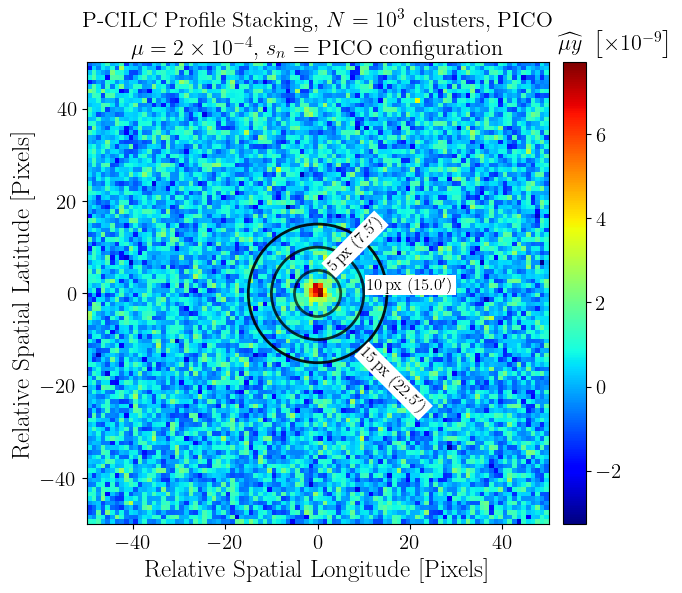

Combined thesis multi-aperture plot successfully built at: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_2e-04_PICO_0.2muK/Stacking/1e+03/Stack_CILC_muy_combined_radii.pdf


In [ ]:
### PLOT THE STACKED PATCHES WITH MULTIPLE CIRCLES FOR THE 10^3 BRIGHTEST CLUSTERS ###

plot_stacked_patches_combined_radii(
    stack_muy_cilc_10e3, 
    n_clusters=1000,
    mu=mu, 
    filename="Stack_CILC_muy", 
    method_name="P-CILC",
    radius_list=[5, 10, 15],
    reso_arcmin=1.5
)

python(55688) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(55691) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


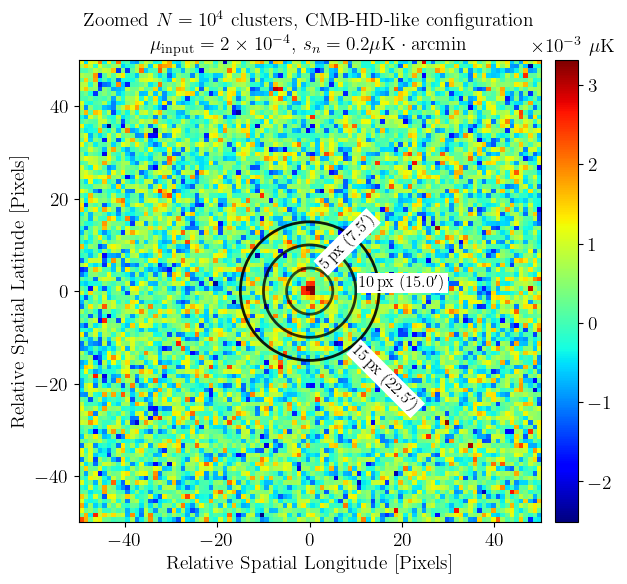

Combined thesis multi-aperture plot successfully built at: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_2e-04_Zegeye_0.2muK/Stacking/1e+04/Stack_CILC_muy_combined_radii.pdf


In [20]:
### PLOT THE STACKED PATCHES WITH MULTIPLE CIRCLES FOR THE 10^4 BRIGHTEST CLUSTERS ###

plot_stacked_patches_combined_radii(
    stack_muy_cilc_10e4, 
    n_clusters=10000,
    mu=mu, 
    filename="Stack_CILC_muy", 
    method_name="P-CILC",
    radius_list=[5, 10, 15],
    reso_arcmin=1.5
)

In [28]:
def plot_stacked_patches_individual_radii(stacked_map, n_clusters, mu, filename, method_name, 
                                          radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
                                          reso_arcmin=1.5):
    """
    Generates a separate plot for every radius in radius_list.
    Uses the projected grid resolution (reso_arcmin^2) for the area.
    """
    n_clusters_str = f"{n_clusters:.0e}".replace("+", "")
    mu_str = f"{mu:.0e}".replace("+", "")
    
    # Each pixel in the 2D projected stack has this area:
    grid_pixel_area_arcmin2 = reso_arcmin**2  # 1.5^2 = 2.25 arcmin^2
    
    # Base directory
    base_dir = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu_str}/Stacking/{n_clusters:.0e}_r/"

    for r_pix in radius_list:
        # --- PHYSICAL CALCULATIONS ---
        center = np.array(stacked_map.shape) // 2
        y_idx, x_idx = np.indices(stacked_map.shape)
        dist = np.sqrt((x_idx - center[1])**2 + (y_idx - center[0])**2)
        mask = dist <= r_pix
        num_pixels = np.sum(mask)
        
        # Area = Exact count of array pixels * area of a grid pixel
        exact_area_arcmin2 = num_pixels * grid_pixel_area_arcmin2
        radius_arcmin = r_pix * reso_arcmin
        
        # --- PLOTTING ---
        fig, ax = plt.subplots(figsize=(6, 5))
        half_x, half_y = stacked_map.shape[0] // 2, stacked_map.shape[1] // 2
        extent = [-half_x, half_x, -half_y, half_y]
        
        im = ax.imshow(stacked_map, origin='lower', cmap='jet', extent=extent)
        plt.colorbar(im, label='Average Signal (unitless)')
        
        cercle = patches.Circle((0, 0), r_pix, color='black', fill=False, linewidth=1.5)
        ax.add_patch(cercle)
        
        title_text = (f'{method_name} Stack: N={n_clusters_str}\n'
                      rf'$r \leq {r_pix}$ pix ({radius_arcmin:.1f}$^\prime$), '
                      rf'Area = {exact_area_arcmin2:.1f} arcmin$^2$')
        
        ax.set_title(title_text)
        ax.set_xlabel('Relative Pixels')
        ax.set_ylabel('Relative Pixels')
        
        if not os.path.exists(base_dir): os.makedirs(base_dir)
        save_path = os.path.join(base_dir, f"{filename}_r={r_pix}p.pdf")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close(fig)

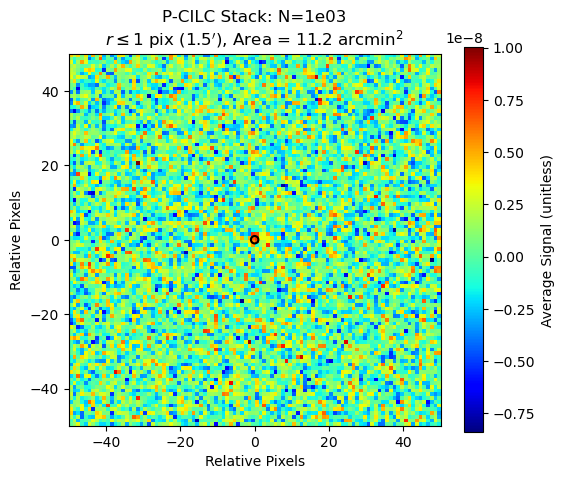

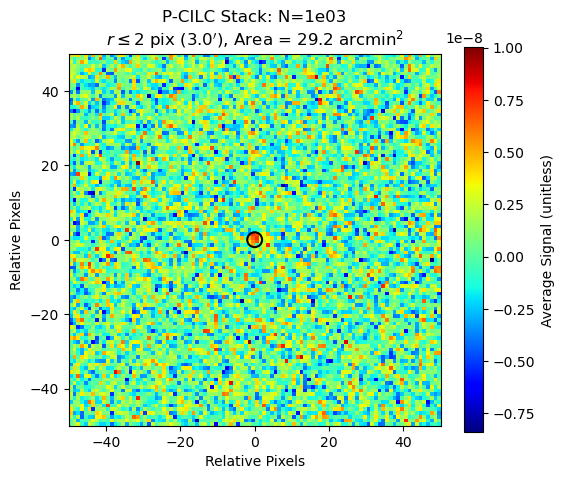

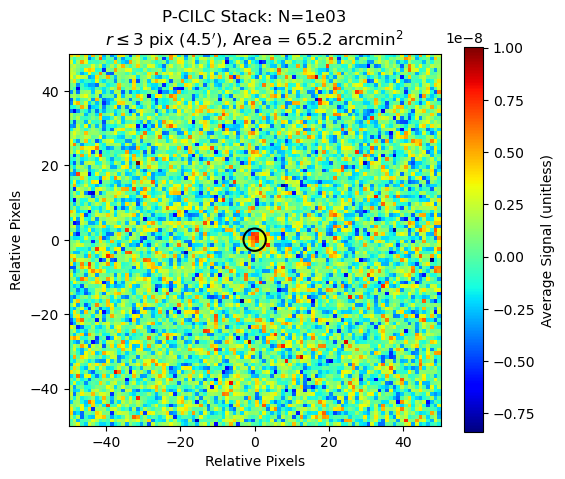

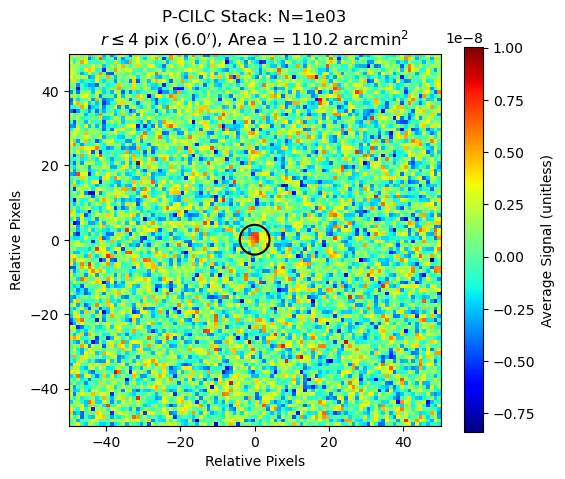

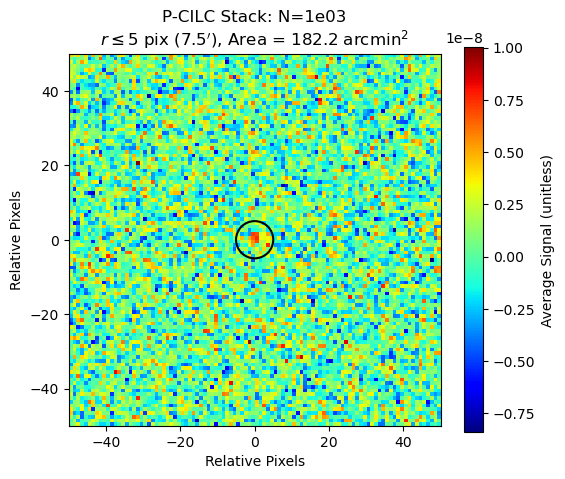

...

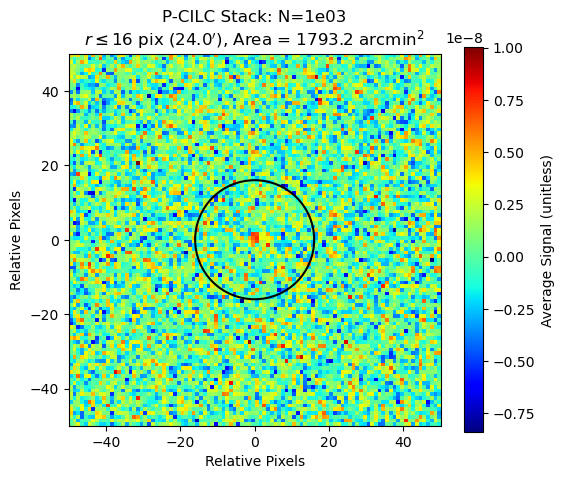

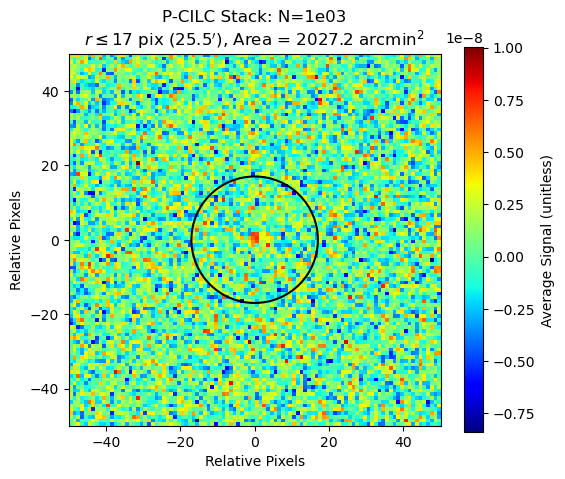

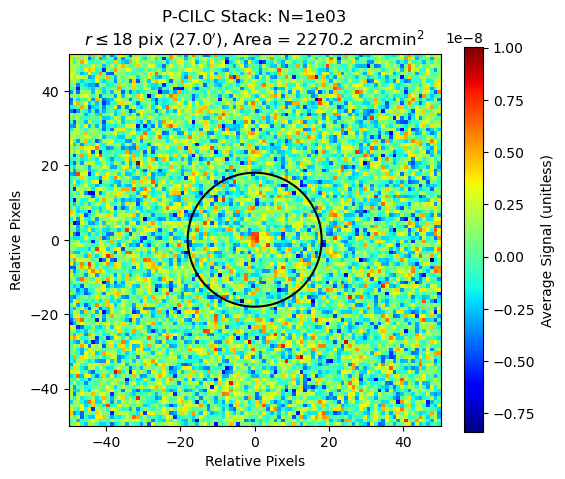

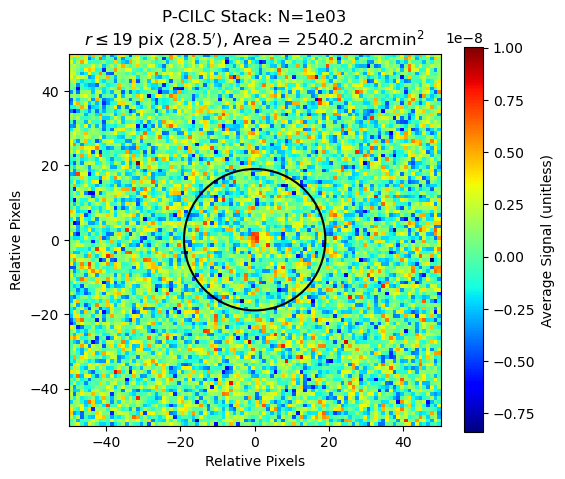

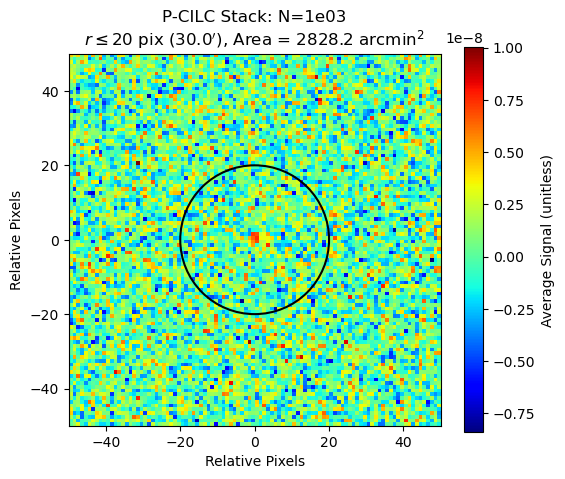

In [29]:
### PLOT THE STACKED PATCHES WITH MULTIPLE CIRCLES FOR THE 10^3 BRIGHTEST CLUSTERS ###

plot_stacked_patches_individual_radii(
    stack_muy_cilc_10e3, 
    n_clusters=1000, 
    mu=mu, 
    filename="Stack_CILC_muy", 
    method_name="P-CILC",
    radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
    reso_arcmin=1.5
)

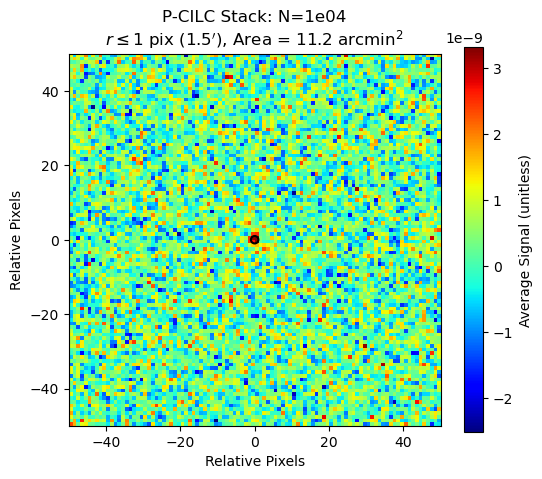

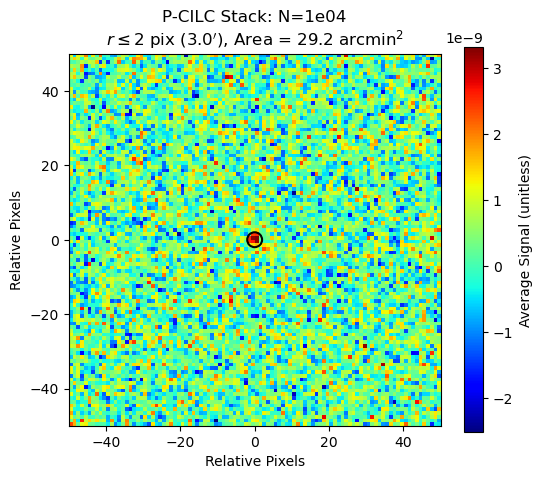

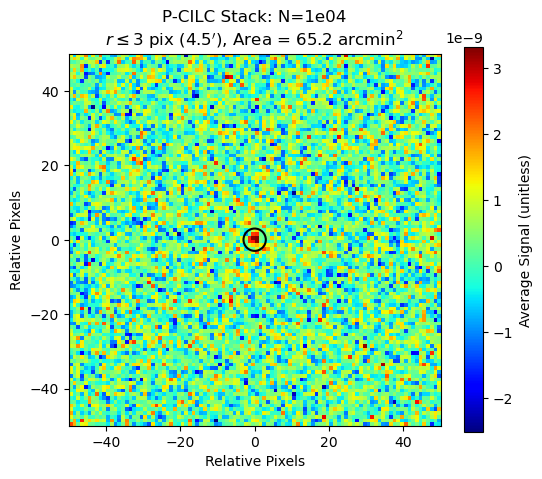

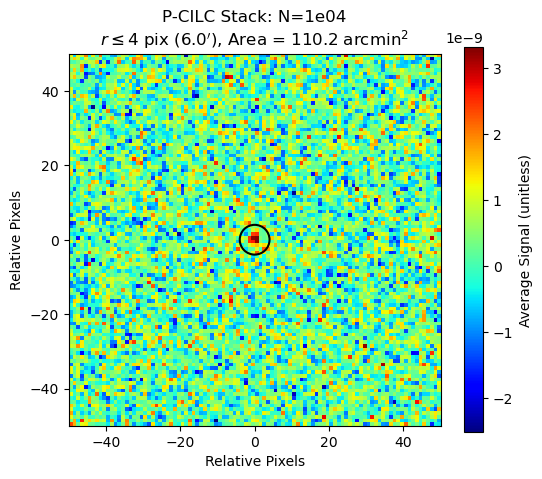

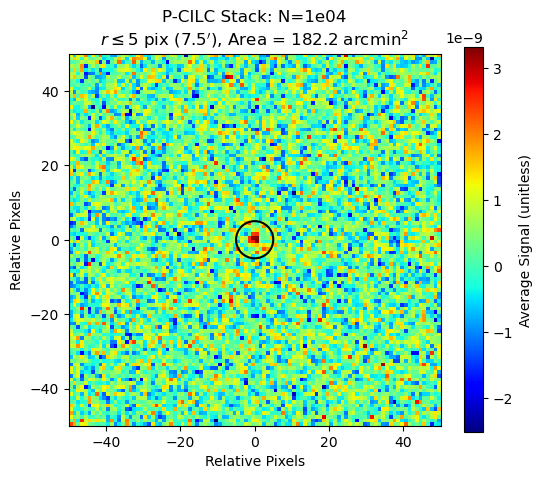

...

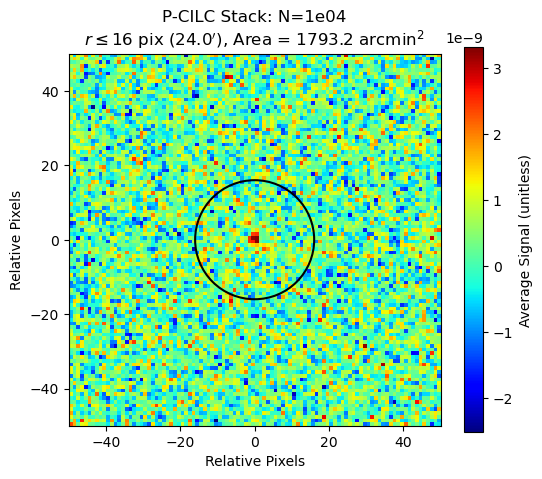

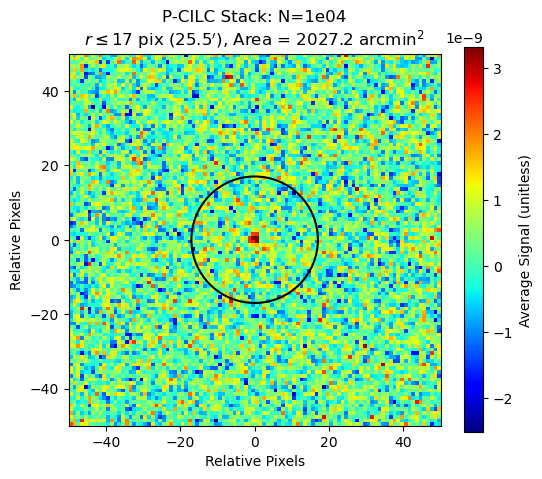

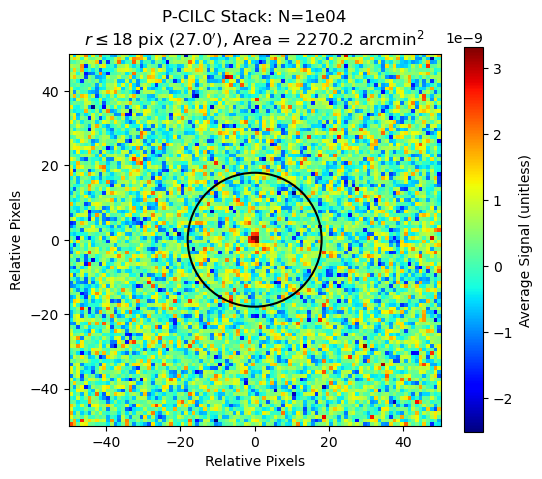

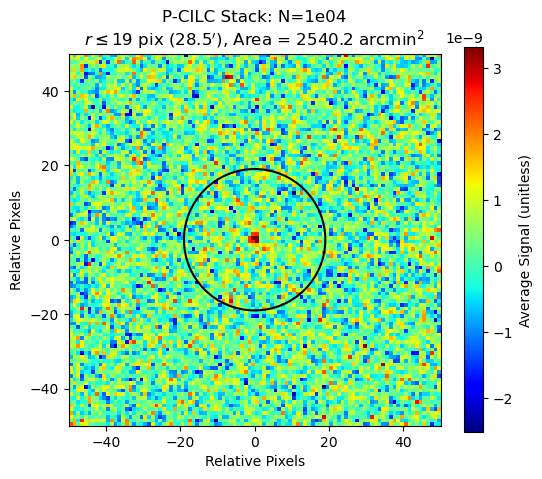

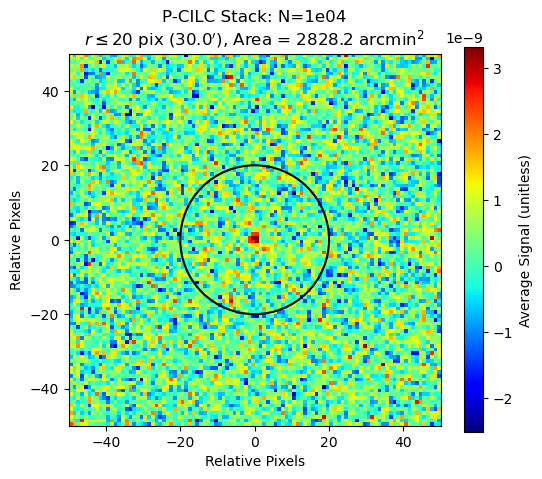

In [30]:
### PLOT THE STACKED PATCHES WITH MULTIPLE CIRCLES FOR THE 10^4 BRIGHTEST CLUSTERS ###

plot_stacked_patches_individual_radii(
    stack_muy_cilc_10e4, 
    n_clusters=10000, 
    mu=mu, 
    filename="Stack_CILC_muy", 
    method_name="P-CILC",
    radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
    reso_arcmin=1.5
)

### 5.3.2. COMPARISON OF 2 STACKED MAPS

In [27]:
def plot_two_stacked_patches(stack_y, stack_muy, n_clusters, mu, base_sensitivity_uk_arcmin, filename, method_name):
    """
    Plots the average (stacked) patches for the y and mu*y signals with circles.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    vmin_y, vmax_y = -10**-5, 10**-5
    vmin_muy, vmax_muy = -5*10**-9, 5*10**-9

    # Calculate extents to center the pixels around (0,0)
    # This assumes your stacks are square postage stamps
    extent_y = [-stack_y.shape[1]//2, stack_y.shape[1]//2, -stack_y.shape[0]//2, stack_y.shape[0]//2]
    extent_muy = [-stack_muy.shape[1]//2, stack_muy.shape[1]//2, -stack_muy.shape[0]//2, stack_muy.shape[0]//2]

    radi_cercle = 10

    # 1. Plot Stacked y-signal
    im1 = ax1.imshow(stack_y, origin='lower', cmap='jet', extent=extent_y)
    ax1.set_title(f"Stacked $y$ signal")
    fig.colorbar(im1, ax=ax1, label='Dimensionless y')
    ax1.set_xlabel("Pixels")
    ax1.set_ylabel("Pixels")
    
    # Create and add the FIRST circle
    cercle1 = patches.Circle((0, 0), radi_cercle, color='black', fill=False, linewidth=1.5, linestyle='-')
    ax1.add_patch(cercle1)

    # 2. Plot Stacked mu*y-signal
    im2 = ax2.imshow(stack_muy, origin='lower', cmap='jet', extent=extent_muy, vmin=vmin_muy, vmax=vmax_muy)
    ax2.set_title(rf"Stacked $\mu y$ Signal")
    cbar2 = fig.colorbar(im2, ax=ax2, label=rf'Dimensionless $\mu y$')
    cbar2.formatter.set_powerlimits((0, 0)) 
    ax2.set_xlabel("Pixels")
    ax2.set_ylabel("Pixels")
    
    # Create and add a SECOND circle for the second axis
    cercle2 = patches.Circle((0, 0), radi_cercle, color='black', fill=False, linewidth=1.5, linestyle='-')
    ax2.add_patch(cercle2)

    plt.suptitle(rf'{method_name} stacked patch of {n_clusters} brightest clusters, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r = {radi_cercle}$p ')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save the figure
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/Stacking/{n_clusters:.0e}/{filename}.pdf"
    #'/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_2e-04/Stacking/1e+4'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

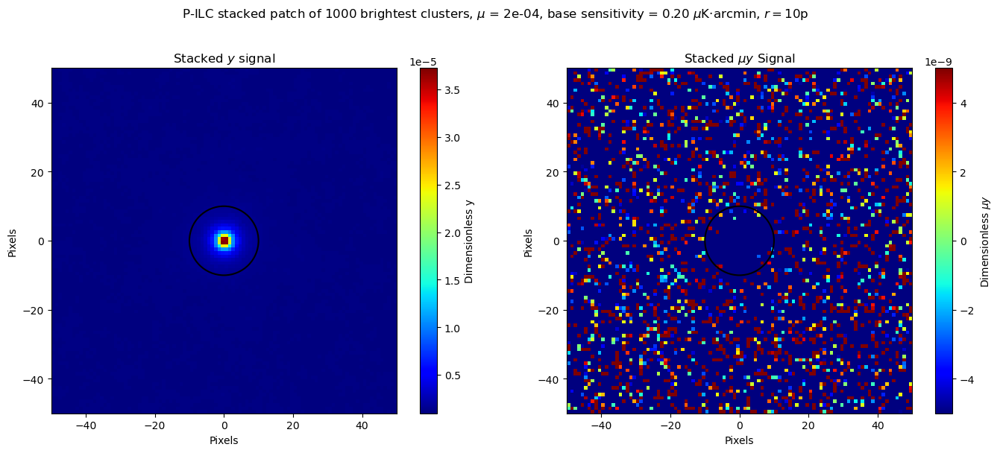

In [29]:
### PLOTING THE 10^3 STACKED PATCHES for P-ILC ###

plot_two_stacked_patches(stack_y_ilc_10e3, stack_muy_ilc_10e3, n_clusters=1000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_ILC", method_name="P-ILC")

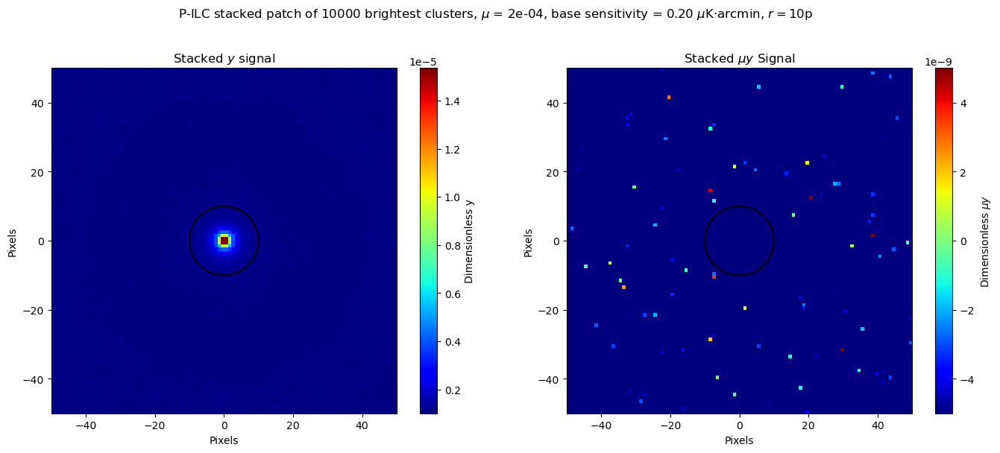

In [56]:
### PLOTING THE 10^4 STACKED PATCHES for P-ILC ###

plot_two_stacked_patches(stack_y_ilc_10e4, stack_muy_ilc_10e4, n_clusters=10000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_ILC", method_name="P-ILC")

In [ ]:
### PLOTING THE 10^5 STACKED PATCHES for P-ILC ###

plot_two_stacked_patches(stack_y_ilc_10e5, stack_muy_ilc_10e5, n_clusters=100000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_ILC", method_name="P-ILC")

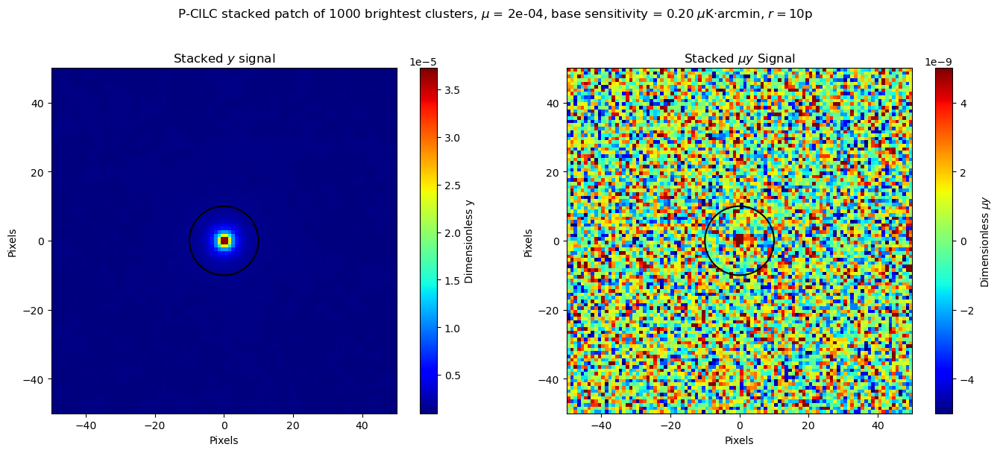

In [31]:
### PLOTING THE 10^3 STACKED PATCHES for P-CILC ###

plot_two_stacked_patches(stack_y_cilc_10e3, stack_muy_cilc_10e3, n_clusters=1000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_CILC", method_name="P-CILC")

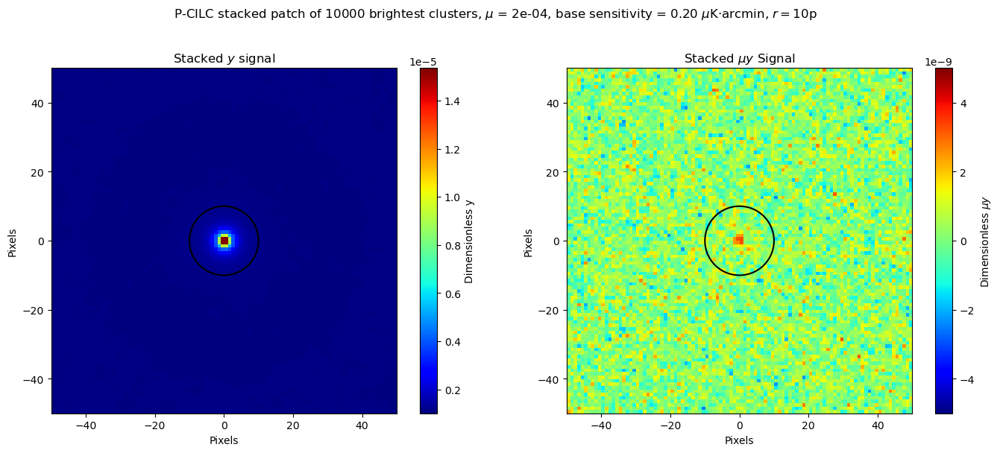

In [57]:
### PLOTING THE 10^4 STACKED PATCHES for P-CILC ###

plot_two_stacked_patches(stack_y_cilc_10e4, stack_muy_cilc_10e4, n_clusters=10000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_CILC", method_name="P-CILC")

In [ ]:
### PLOTING THE 10^5 STACKED PATCHES for P-CILC ###

plot_two_stacked_patches(stack_y_cilc_10e5, stack_muy_cilc_10e5, n_clusters=100000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_CILC", method_name="P-CILC")

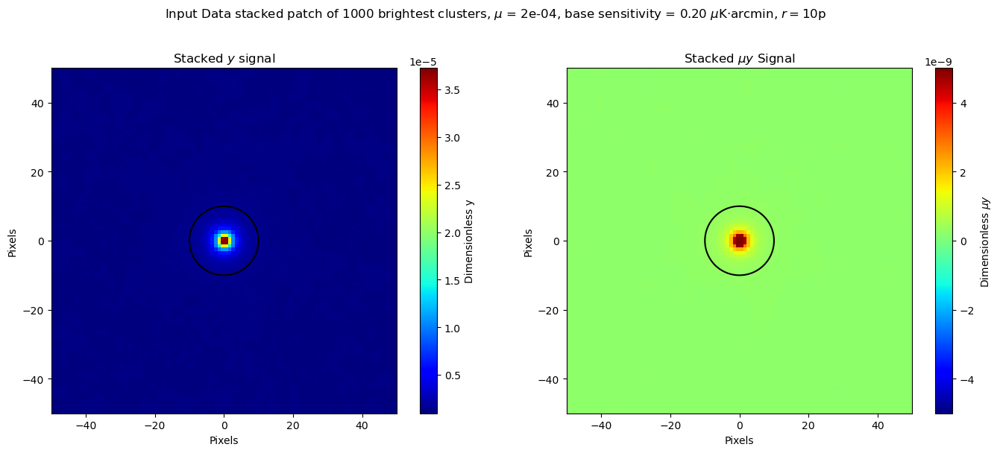

In [32]:
### PLOTING THE 10^3 STACKED PATCHES OF THE INPUT DATA ###

plot_two_stacked_patches(stack_y_real_10e3, stack_muy_real_10e3, n_clusters=1000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_Real_Data", method_name="Input Data")

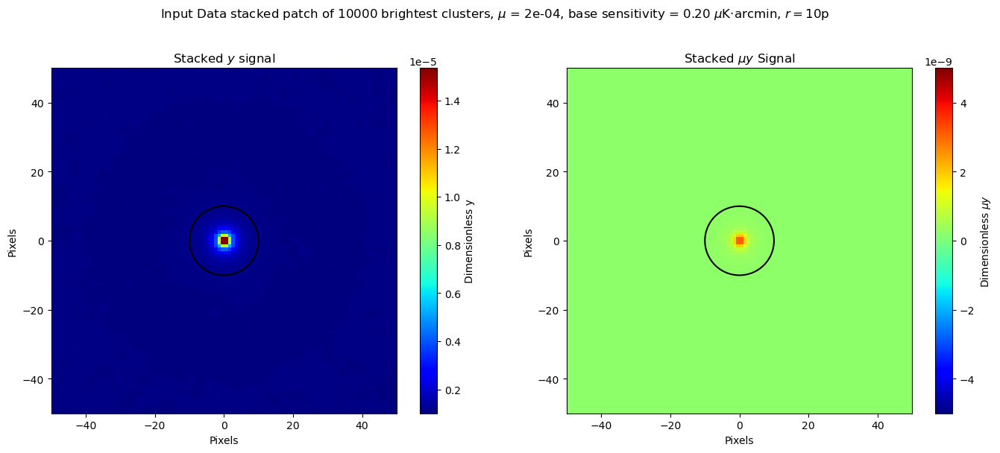

In [58]:
### PLOTING THE 10^4 STACKED PATCHES OF THE INPUT DATA ###

plot_two_stacked_patches(stack_y_real_10e4, stack_muy_real_10e4, n_clusters=10000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_Real_Data", method_name="Input Data")

In [ ]:
### PLOTING THE 10^5 STACKED PATCHES OF THE INPUT DATA ###

plot_two_stacked_patches(stack_y_real_10e5, stack_muy_real_10e5, n_clusters=100000, mu=mu, base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, filename="Stacked_Patches_Real_Data", method_name="Input Data")

### 5.3.3. COMPARISON OF 3 STACKED MAPS

In [34]:
def plot_comparison_stacked_patches_y(stack_y_ilc, stack_y_cilc, stack_y_real, n_clusters, mu, base_sensitivity, map, filename):
    """
    Plots three comparison stacked patches (Pixel ILC, Pixel CILC, and Input Data) 
    in a single row for side-by-side comparison.
    """
    maps = [stack_y_ilc, stack_y_cilc, stack_y_real]
    titles = [r"P-ILC stacked $y$ map", r"P-CILC stacked $y$ map", r"Input data stacked $y$ map"]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # Define colorbar limits based on your provided params
    # Using your intermediate mu-y scale as an example
    v_min, v_max = -5e-6, 5e-6

    for i, ax in enumerate(axes):
        # Calculate extents to center the pixels around (0,0)
        extent = [-maps[i].shape[1]//2, maps[i].shape[1]//2, -maps[i].shape[0]//2, maps[i].shape[0]//2]
        
        im = ax.imshow(maps[i], origin='lower', cmap='jet', extent=extent)
        
        # Add center marker
        #ax.plot(0, 0, marker='+', color='red', markersize=10, label='Center')
        
        ax.set_title(titles[i])
        ax.set_xlabel('Pixels')
        if i == 0:
            ax.set_ylabel('Pixels')

        # Paràmetres: (centre_x, centre_y), radi, color...
        radi_cercle = 10
        cercle = patches.Circle((0, 0), radi_cercle, color='black', fill=False, linewidth=1.5, linestyle='-')
        ax.add_patch(cercle)
        
        # Format colorbar with scientific notation
        cbar = fig.colorbar(im, ax=ax, label='Signal (unitless)')
        cbar.formatter.set_powerlimits((0, 0))
        cbar.update_ticks()

        # Rename n_clusters to save it in the directory
        n_clusters_str = f"{n_clusters:.0e}"

    plt.suptitle(rf"Comparison of {map} map stacked patches of {n_clusters_str} brightest clusters, $\mu$ value = {mu:.0e}, base sensitivity = {base_sensitivity:.2f} $\mu$K·arcmin, $r = {radi_cercle}$p", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save the comparison plot
    plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/Stacking/{n_clusters_str}/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()

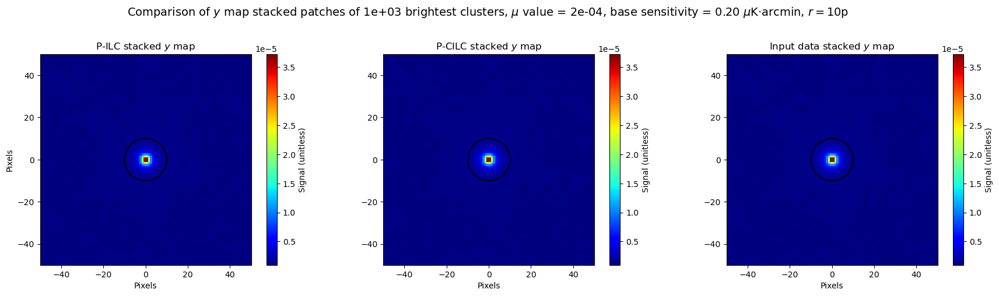

In [38]:
### PLOTTING THE 10^3 THREE y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_y(
    stack_y_ilc_10e3,
    stack_y_cilc_10e3, 
    stack_y_real_10e3,
    n_clusters=1000, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map="$y$",
    filename="Comparison_Stacked_Patches_y"
)

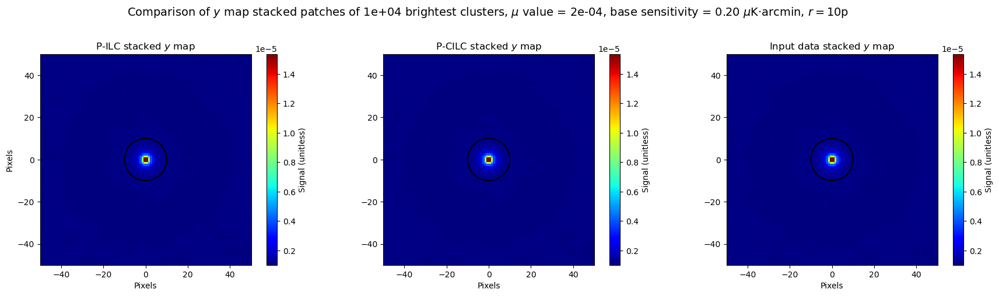

In [75]:
### PLOTTING THE 10^4 THREE y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_y(
    stack_y_ilc_10e4,
    stack_y_cilc_10e4, 
    stack_y_real_10e4,
    n_clusters=1e+04, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map="$y$",
    filename="Comparison_Stacked_Patches_y"
)

In [ ]:
### PLOTTING THE 10^5 THREE y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_y(
    stack_y_ilc_10e5,
    stack_y_cilc_10e5, 
    stack_y_real_10e5,
    n_clusters=100000, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map="$y$",
    filename="Comparison_Stacked_Patches_y"
)

In [33]:
def plot_comparison_stacked_patches_muy(stack_muy_ilc, stack_muy_cilc, stack_muy_real, n_clusters, mu, base_sensitivity, map, filename):
    """
    Plots three comparison stacked patches (Pixel ILC, Pixel CILC, and Input Data) 
    in a single row for side-by-side comparison.
    """
    maps = [stack_muy_ilc, stack_muy_cilc, stack_muy_real]
    titles = [r"P-ILC stacked $\mu y$ map", r"P-CILC stacked $\mu y$ map", r"Input data stacked $\mu y$ map"]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # Define colorbar limits based on your provided params
    # Using your intermediate mu-y scale as an example
    v_min, v_max = -5e-9, 5e-9 

    for i, ax in enumerate(axes):
        # Calculate extents to center the pixels around (0,0)
        extent = [-maps[i].shape[1]//2, maps[i].shape[1]//2, -maps[i].shape[0]//2, maps[i].shape[0]//2]
        
        im = ax.imshow(maps[i], origin='lower', cmap='jet', extent=extent, vmin=v_min, vmax=v_max)
        
        # Add center marker
        #ax.plot(0, 0, marker='+', color='red', markersize=10, label='Center')
        
        ax.set_title(titles[i])
        ax.set_xlabel('Pixels')
        if i == 0:
            ax.set_ylabel('Pixels')

        # Paràmetres: (centre_x, centre_y), radi, color...
        radi_cercle = 10  # Pots ajustar aquest valor segons l'escala dels teus píxels
        cercle = patches.Circle((0, 0), radi_cercle, color='black', fill=False, linewidth=1.5, linestyle='-')
        ax.add_patch(cercle)
        
        # Format colorbar with scientific notation
        cbar = fig.colorbar(im, ax=ax, label='Signal (unitless)')
        cbar.formatter.set_powerlimits((0, 0))
        cbar.update_ticks()

        # Rename n_clusters to save it in the directory
        n_clusters_str = f"{n_clusters:.0e}"

    plt.suptitle(rf"Comparison of {map} map stacked patches of {n_clusters_str} brightest clusters, $\mu$ value = {mu:.0e}, base sensitivity = {base_sensitivity:.2f} $\mu$K·arcmin, $r = {radi_cercle}$p", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save the comparison plot
    plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/Stacking/{n_clusters_str}/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()

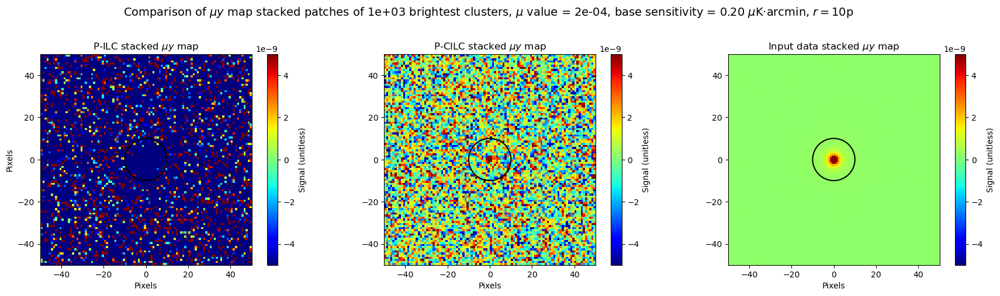

In [40]:
### PLOTTING THE 10^3 THREE mu_y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_muy(
    stack_muy_ilc_10e3, 
    stack_muy_cilc_10e3, 
    stack_muy_real_10e3, 
    n_clusters=1000, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map=rf"$\mu y$",
    filename="Comparison_Stacked_Patches_muy"
)

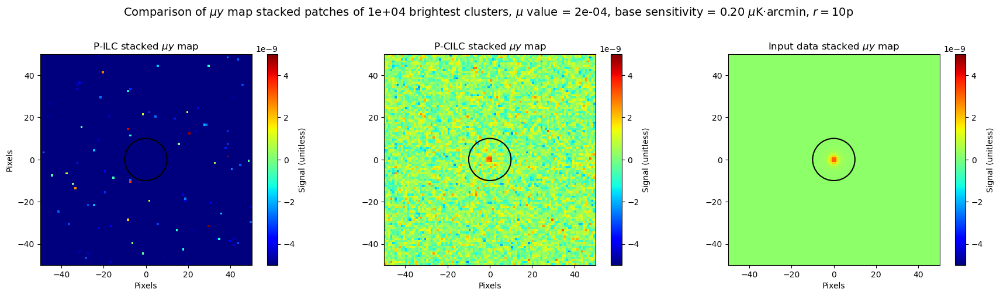

In [77]:
### PLOTTING THE 10^4 THREE mu_y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_muy(
    stack_muy_ilc_10e4, 
    stack_muy_cilc_10e4, 
    stack_muy_real_10e4, 
    n_clusters=10000, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map=rf"$\mu y$",
    filename="Comparison_Stacked_Patches_muy"
)

In [ ]:
### PLOTTING THE 10^5 THREE mu_y STACKED PATCHES TOGETHER FOR COMPARISON ###

plot_comparison_stacked_patches_muy(
    stack_muy_ilc_10e5, 
    stack_muy_cilc_10e5, 
    stack_muy_real_10e5, 
    n_clusters=100000, 
    mu=mu,
    base_sensitivity=base_sensitivity_uk_arcmin,
    map=rf"$\mu y$",
    filename="Comparison_Stacked_Patches_muy"
)

## 6. T-T plot: $\mu y$ Vs. $y$ for $\mu$ extraction

### 6.1. Temperature-Temperature plot:
6.1.1. $\mu y$ Vs. $y$ --- $\mu$ value extraction

6.1.2. $y$ Vs. $y$

6.1.3. $\mu y$ Vs. $\mu y$

Linear regression for each case

### 6.1.1. $\mu y$ Vs. $y$ --- $\mu$ value extraction

In [7]:
def plot_y_vs_muy_10p_radius(stack_y_ilc, stack_muy_ilc, mu, base_sensitivity_uk_arcmin, n_clusters,
                        filename="TT_Plot.pdf",
                        xlabel=rf'Stacked $y$ real signal (unitless)',
                        ylabel=rf'Stacked $\mu y$ processed signal (unitless)',
                        title=rf'T-T Plot: processed $\mu y$ Vs. real $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels'):
    
    # Rename n_clusters to save it in the directory
    n_clusters_str = f"{n_clusters:.0e}"

    # Flatten the 2D stacked patches into 1D arrays for scatter plotting and regression
    x_data = stack_y_ilc.flatten()
    y_data = stack_muy_ilc.flatten()

    # r = 10 pixel
    center = np.array(stack_y_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_y_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10  # Keep pixels within a 10 pixel radius
    x_data = x_data[mask.flatten()]
    y_data = y_data[mask.flatten()]

    # Linear Regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    bias = np.abs(slope - mu)/std_err if std_err != 0 else 0.0
    significance = np.abs(slope)/std_err if std_err != 0 else 0.0

    # --- FIXED: Reduced Chi-Squared with independent background noise ---
    n_pix_total = len(x_data)
    if n_pix_total > 2:
        y_pred = slope * x_data + intercept
        residuals = y_data - y_pred
        
        # PHYSICAL FIX: Measure background noise standard deviation 
        # from unmasked pixels (~mask) of the original 2D processed stack
        sigma_pixel_independent = np.std(stack_muy_ilc[~mask]) 
        
        if sigma_pixel_independent > 0:
            chi2_total = np.sum((residuals / sigma_pixel_independent) ** 2)
            dof = n_pix_total - 2
            chi2_red = chi2_total / dof
        else:
            chi2_red = 0.0
    else:
        chi2_red = 0.0

    # --- FIXED: Scientific Notation Block (No double else errors) ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        
        # If error is negligible (10,000x smaller), force error to show as 0.00
        if (std_err / abs(slope)) < 1e-4:
            err_text = "0.00"
        else:
            err_scaled = std_err / (10**common_exp)
            err_text = f"{err_scaled:.2f}"
            
        label_text = (rf'$\mu = ({val_scaled:.2f} \pm {err_text}) \times 10^{{{common_exp}}}$' + '\n' +
                      rf'Significance = {significance:.2f} $\sigma$' + '\n' +
                      rf'Bias = {bias:.2f} $\sigma$' + '\n' +
                      rf'$R^2$ = {r_value**2:.4f}' + '\n' +
                      rf'$\chi^2_{{\text{{red}}}}$ = {chi2_red:.2f}')
    else:
        label_text = (rf'$\mu = 0.00 \pm 0.00$' + '\n' +
                      rf'Significance = {significance:.2f} $\sigma$' + '\n' +
                      rf'Bias = {bias:.2f} $\sigma$' + '\n' +
                      rf'$R^2$ = {r_value**2:.4f}' + '\n' +
                      rf'$\chi^2_{{\text{{red}}}}$ = {chi2_red:.2f}')

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/TT_plots/10p/{n_clusters_str}/{filename}_10p.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err, bias, significance, chi2_red

In [21]:
def plot_y_vs_muy_multiple_radii(stack_y_ilc, stack_muy_ilc, mu, n_clusters,
                                 freq_str_name="PICO", radii=[5, 10, 15],
                                 filename="TT_Plot_Combined.pdf"):
    """
    Generates a clean, publication-ready combined T-T Plot for radii 5, 10, and 15 pixels.
    Includes separate color coding and an ultra-compact legend with extracted mu values.
    """
    
    # ============================================================================
    # --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS ---
    # ============================================================================
    plt.rcParams.update({
        "text.usetex": True,                 # Force active LaTeX font engine
        "font.family": "serif",              # Matches Computer Modern Roman
        "font.serif": ["Computer Modern Roman"],
        "font.size": 16,                     
        "axes.labelsize": 18,                
        "axes.titlesize": 16,                
        "legend.fontsize": 13,               # Ajustada per a encabir les 3 línies netes
        "xtick.labelsize": 15,               
        "ytick.labelsize": 15,                
        "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
    })

    # Definim la configuració dels 3 radis a avaluar (radi, color punts, color línia)
    radii_config = [
        {"r": 5,  "c_scatter": "royalblue", "c_line": "royalblue"},
        {"r": 10, "c_scatter": "darkgreen", "c_line": "darkgreen"},
        {"r": 15, "c_scatter": "crimson",    "c_line": "crimson"}
    ]

    # Inicialitzem la figura (Estil quadrat i robust, ideal per al foli del TFM)
    fig, ax = plt.subplots(figsize=(8.5, 6.5))
    
    # Coordenades i distàncies de la matriu 2D central
    center = np.array(stack_y_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_y_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)

    # --- BUCLE PRINCIPAL PER EXTREURE I PINTAR CADA RADI ---
    for cfg in radii_config:
        r_val = cfg["r"]
        
        # Filtre de màscara circular
        mask = distances <= r_val
        x_filtered = stack_y_ilc[mask]
        y_filtered = stack_muy_ilc[mask]

        # Regressió Lineal
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_filtered, y_filtered)

        # Formateig Científic Estricte per a la Llegenda Compacta
        if slope != 0:
            common_exp = math.floor(math.log10(abs(slope)))
            val_scaled = slope / (10**common_exp)
            
            if (std_err / abs(slope)) < 1e-4:
                err_text = "0.00"
            else:
                err_scaled = std_err / (10**common_exp)
                err_text = f"{err_scaled:.2f}"
                
            label_text = rf"$\hat{{\mu}}_{{r\leq {r_val}p}} = ({val_scaled:.2f} \pm {err_text}) \times 10^{{{common_exp}}}$"
        else:
            label_text = rf"$\hat{{\mu}}_{{r\leq {r_val}p}} = 0.00 \pm 0.00$"

        # 1. Pintem els punts dispersos (s=4 petit i alpha=0.2 per evitar superposicions opaques lletges)
        ax.scatter(x_filtered, y_filtered, alpha=0.22, s=4, color=cfg["c_scatter"], edgecolors='none')
        
        # 2. Pintem la recta analítica de fit formal que heretarà el 'label_text' net
        line_x = np.array([np.min(x_filtered), np.max(x_filtered)])
        ax.plot(line_x, slope * line_x + intercept, color=cfg["c_line"], lw=2.2, label=label_text)

    # ============================================================================
    # --- LABELS, TITLES I POLISHING (BLINDAT CONTRA ERORS) ---
    # ============================================================================
    #ax.set_xlabel(r'Stacked $y$ P-CILC signal')
    #ax.set_ylabel(r'Stacked $\mu y$ P-CILC signal')

    # --- RADII LIST FOR THE TITLE ---
    radii_list = [5, 10, 15]

    # --- N = 10^x LABEL FOR THE TITLE ---
    n_clusters_exponent = int(np.log10(n_clusters))
    
    # Titulació en dues línies nates (evita el col·lapse del tight_layout)
    title_text = (rf"\begin{{center}} T-T Plots: $\mu$ extraction for r = {radii_list}p\\"
                rf"$N = 10^{{{n_clusters_exponent}}}$ stacked clusters, $\mu_{{\text{{input}}}} = {mu/1e-4:.0f} \times 10^{{-4}}$, $s_n = 0.2\ \mu\mathrm{{K\cdot arcmin}}$ \end{{center}}")
    ax.set_title(title_text, pad=-15, loc='center')

    # Ocultem el text del multiplicador automàtic superior rebel que xocava amb el títol
    ax.xaxis.get_offset_text().set_visible(False)
    ax.yaxis.get_offset_text().set_visible(False)
    
    # Calculem dinàmicament l'exponent real de les teves dades de l'eix Y
    max_y_val = np.max(np.abs(y_filtered))
    if max_y_val > 0:
        y_exponent = int(math.floor(math.log10(max_y_val)))
    else:
        y_exponent = -1 # Valor de seguretat completament erroni per detectar-ho aviat

    # Feim el mateix per l'eix x
    max_x_val = np.max(np.abs(x_filtered))
    if max_x_val > 0:
        x_exponent = int(math.floor(math.log10(max_x_val)))
    else:        x_exponent = -1 # Valor de seguretat completament erroni per detectar-ho aviat
        
    # Injectem el multiplicador AUTOMÀTIC directament a dins de la unitat del label del ylabel!
    ax.set_xlabel(rf'Stacked $\hat{{y}} \times 10^{{{x_exponent}}}$')
    ax.set_ylabel(rf'Stacked $\widehat{{\mu y}} \times 10^{{{y_exponent}}}$')

    # Grid i Llegenda inferior dreta en caixa blanca estilitzada
    ax.grid(True, linestyle=':', alpha=0.4)
    ax.legend(loc='lower right', frameon=True, facecolor='white', edgecolor='gainsboro', shadow=False)
    
    plt.tight_layout()

    # ============================================================================
    # --- SAVING ENGINE (PATH COMPATIBLE AMB L'ENTORN DE 8GB DEL MAC) ---
    # ============================================================================
    n_clusters_str = f"{n_clusters:.0e}"
    save_dir = Path(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}_{base_sensitivity_uk_arcmin}muK/TT_plots/{n_clusters_str}/")
    save_dir.mkdir(parents=True, exist_ok=True)
    
    full_save_path = save_dir / filename
    plt.savefig(full_save_path, dpi=300, bbox_inches='tight')
    print(f"Combined T-T Plot generated successfully at: {full_save_path}")
    
    plt.show()
    plt.close('all') # Baló d'oxigen immediat per alliberar la memòria RAM

In [11]:
### CALL THE FUNCTION FOR 10^3 STACKED CLUSTERS AND EXTRACT THE MU VALUE FOR DIFFERENT RADII ###
plot_y_vs_muy_multiple_radii(
    stack_y_ilc=stack_y_pcilc_10e3,     # La teva matriu 2D de senyal real (input)
    stack_muy_ilc=stack_muy_pcilc_10e3, # La teva matriu 2D de senyal processat (reconstrucció)
    mu=mu,                              # El valor d'injecció simulat (ex: 2e-4)
    n_clusters=1000,                    # El nombre de cúmuls acumulats (es convertirà a 1e03 per al camí)
    freq_str_name="PICO",               # Nom de la configuració de l'experiment
    radii=[5, 10, 15],                  # Llista de radis a avaluar (en píxels)
    filename="TT_Plot_Combined_5_10_15p.pdf" # Nom del fitxer PDF final
)

NameError: name 'stack_y_pcilc_10e3' is not defined

python(55695) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(55697) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Combined T-T Plot generated successfully at: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_2e-04_Zegeye_0.2muK/TT_plots/1e+04/TT_Plot_Combined_5_10_15p.pdf


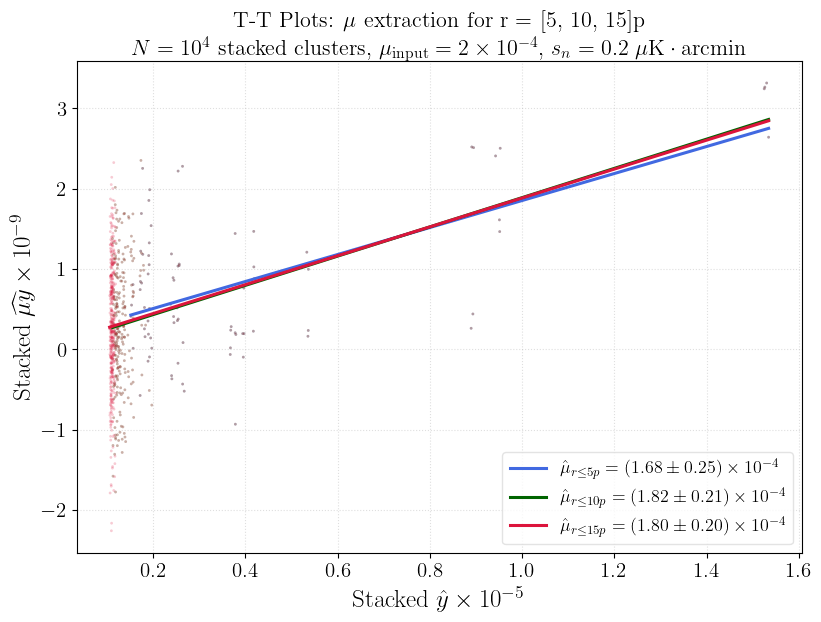

In [22]:
### CALL THE FUNCTION FOR 10^4 STACKED CLUSTERS AND EXTRACT THE MU VALUE FOR DIFFERENT RADII ###
plot_y_vs_muy_multiple_radii(
    stack_y_ilc=stack_y_cilc_10e4,      # La teva matriu 2D de senyal real (input)
    stack_muy_ilc=stack_muy_cilc_10e4,  # La teva matriu 2D de senyal processat (reconstrucció)
    mu=mu,                              # El valor d'injecció simulat (ex: 2e-4)
    n_clusters=10000,                   # El nombre de cúmuls acumulats (es convertirà a 1e03 per al camí)
    freq_str_name="Zegeye",               # Nom de la configuració de l'experiment
    radii=[5, 10, 15],                  # Llista de radis a avaluar (en píxels)
    filename="TT_Plot_Combined_5_10_15p.pdf" # Nom del fitxer PDF final
)

### Full stacked map

In [1]:
def plot_y_vs_muy(stack_y_ilc, stack_muy_ilc,
                    mu, base_sensitivity_uk_arcmin,
                    filename="TT_Plot.pdf",
                    xlabel=rf'Stacked $y$ real signal (unitless)',
                    ylabel=rf'Stacked $\mu y$ processed signal (unitless)',
                    title=rf'T-T Plot: processed $\mu y$ Vs. real $y$'):
    
    x_data = stack_y_ilc.flatten()
    y_data = stack_muy_ilc.flatten()

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    
    bias = np.abs(slope - mu)/std_err if std_err != 0 else 0.0

    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        # If error is negligible (10,000x smaller), show as 0
        if (std_err / abs(slope)) < 1e-4:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
        else:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
    else:
        label_text = rf'$\mu = 0.00 \pm 0.00$' + '\n' + rf'bias = {bias:.2f} $\sigma$'

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/TT_plots/Full_map/{filename}.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err

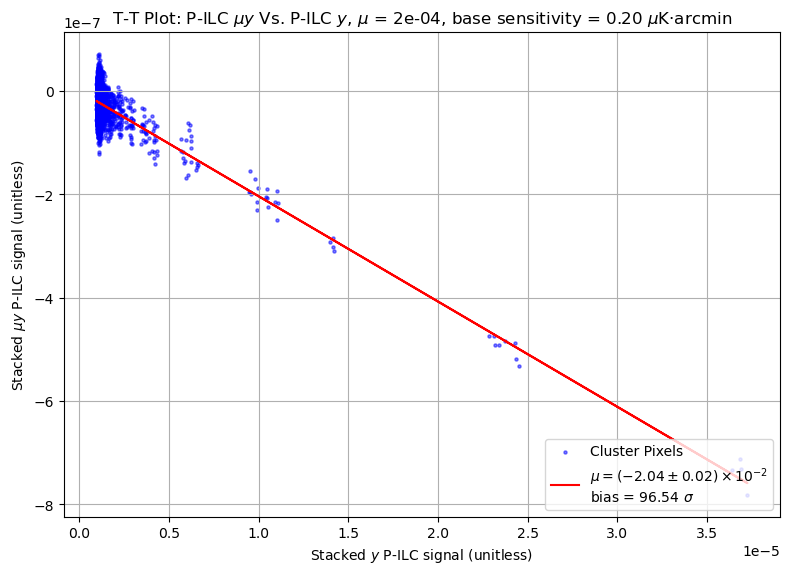

--- Statistics ---
y = -2.04e-02 * x + 1.08e-10
R-squared: 0.4776, p-value: 0.00e+00, std_err: 2.13e-04
----------------------
Measured mu = -2.04e-02
Input    mu = 2.00e-04


In [17]:
### PLOTTING THE P-ILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE --- y_hat_ilc Vs. y_hat_muy_ilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy(stack_y_ilc, stack_muy_ilc,
                                                                mu, base_sensitivity_uk_arcmin,
                                                                filename="TT_Plot_PILC",
                                                                xlabel=rf'Stacked $y$ P-ILC signal (unitless)',
                                                                ylabel=rf'Stacked $\mu y$ P-ILC signal (unitless)',
                                                                title=rf'T-T Plot: P-ILC $\mu y$ Vs. P-ILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

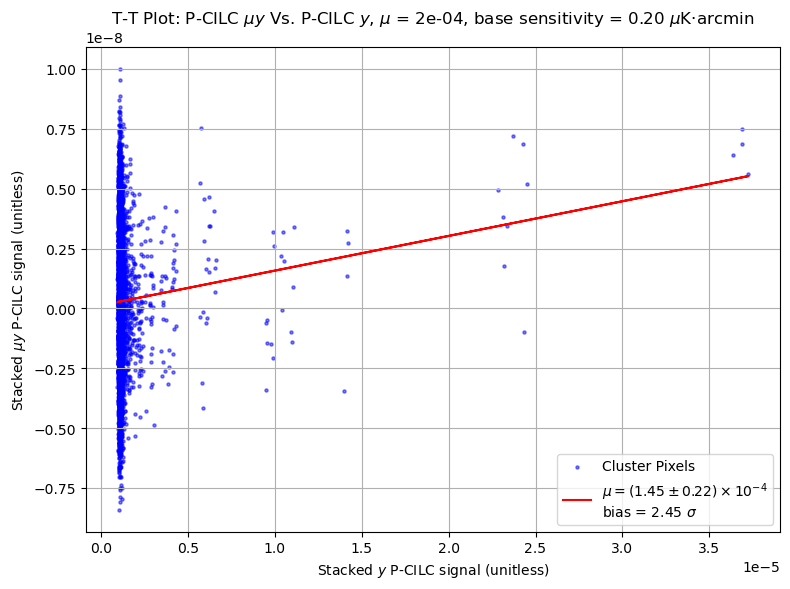

--- Statistics ---
y = 1.45e-04 * x + 1.25e-10
R-squared: 0.0042, p-value: 1.03e-10, std_err: 2.24e-05
----------------------
Measured mu = 1.45e-04
Input    mu = 2.00e-04


In [18]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy(stack_y_cilc, stack_muy_cilc,
                                                                    mu, base_sensitivity_uk_arcmin,
                                                                    filename="TT_Plot_PCILC",
                                                                    xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                    ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                    title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

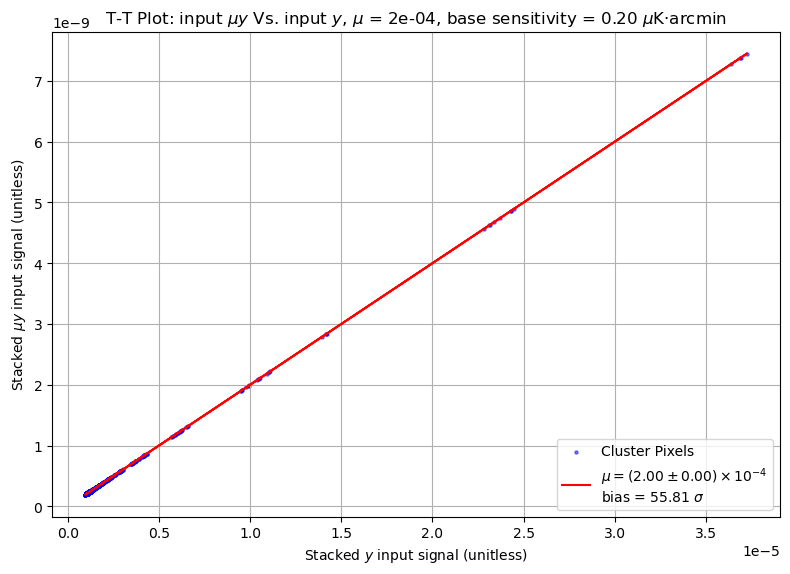

--- Statistics ---
y = 2.00e-04 * x + 2.04e-17
R-squared: 1.0000, p-value: 0.00e+00, std_err: 1.26e-13
----------------------
Measured mu = 2.00e-04
Input    mu = 2.00e-04


In [19]:
### PLOTTING THE INPUT T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE --- y_real Vs. muy_real --- TEST ON THE TT PLOT FUNCTION ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy(stack_y, stack_muy,
                                                                    mu, base_sensitivity_uk_arcmin,
                                                                    filename="TT_Plot_INPUT",
                                                                    xlabel=rf'Stacked $y$ input signal (unitless)',
                                                                    ylabel=rf'Stacked $\mu y$ input signal (unitless)',
                                                                    title=rf'T-T Plot: input $\mu y$ Vs. input $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

ODR

In [ ]:
def plot_y_vs_muy_odr(stack_y_ilc, stack_muy_ilc,
                    mu, base_sensitivity_uk_arcmin,
                    filename="TT_Plot.pdf",
                    xlabel=rf'Stacked $y$ real signal (unitless)',
                    ylabel=rf'Stacked $\mu y$ processed signal (unitless)',
                    title=rf'T-T Plot: processed $\mu y$ Vs. real $y$'):
    
    x_data = stack_y_ilc.flatten()
    y_data = stack_muy_ilc.flatten()

    # --- Use Orthogonal Distance Regression (ODR) ---
    # This accounts for errors in both x and y
    linear_model = odr.Model(lambda p, x: p[0] * x + p[1])
    data = odr.Data(x_data, y_data)
    # Use OLS results as starting guess
    ols_slope, ols_intercept, _, _, _ = stats.linregress(x_data, y_data)
    my_odr = odr.ODR(data, linear_model, beta0=[ols_slope, ols_intercept])
    output = my_odr.run()
    
    slope, intercept = output.beta
    # standard error of the slope from the covariance matrix
    std_err = output.sd_beta[0] 

    # Give the r and p values from the OLS for reference, but note that ODR doesn't directly provide these
    r_value = np.corrcoef(x_data, y_data)[0, 1]
    p_value = 2 * (1 - stats.norm.cdf(np.abs(r_value)))
    
    # Calculate bias using the more robust std_err
    bias = np.abs(slope - mu)/std_err if std_err != 0 else 0.0

    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        if (std_err / abs(slope)) < 1e-4:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
        else:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
    else:
        label_text = rf'$\mu = 0.00 \pm 0.00$' + '\n' + rf'bias = {bias:.2f} $\sigma$'

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.3, s=5, label='Cluster Pixels', color='blue', edgecolors='none')
    
    # Plot the regression line
    x_fit = np.array([np.min(x_data), np.max(x_data)])
    plt.plot(x_fit, slope * x_fit + intercept, color='red', lw=2, label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    
    # Updated path logic to handle mu scientific notation in folder name
    folder_mu = f"{mu:.0e}".replace("+", "")
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{folder_mu}/TT_plots/Full_map/{filename}_ODR.pdf"
    
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err, bias

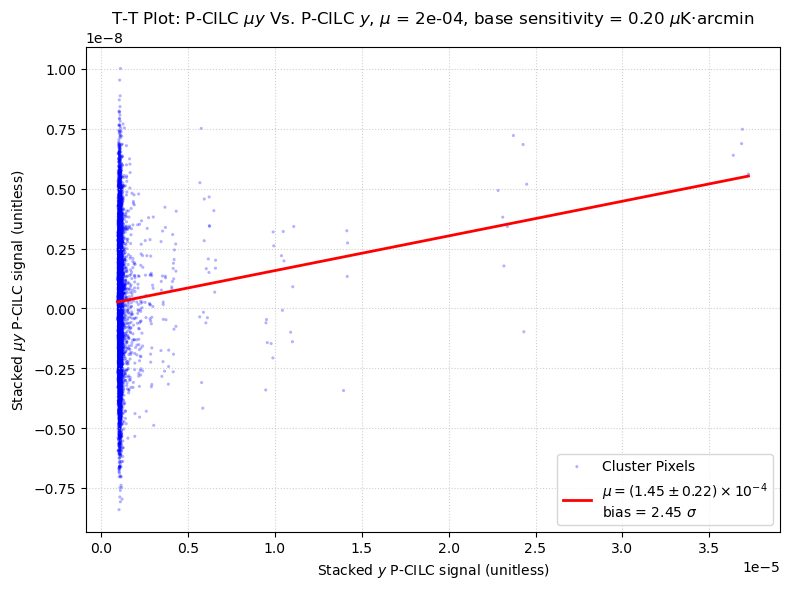

--- Statistics ---
y = 1.45e-04 * x + 1.25e-10
R-squared: 0.0042, p-value: 9.49e-01, std_err: 2.24e-05
----------------------
Measured mu = 1.45e-04
Input    mu = 2.00e-04


In [ ]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err, bias = plot_y_vs_muy_odr(stack_y_cilc, stack_muy_cilc,
                                                                    mu, base_sensitivity_uk_arcmin,
                                                                    filename="TT_Plot_PCILC",
                                                                    xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                    ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                    title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

BOOTSTRAP

In [ ]:
def plot_y_vs_muy_fast_bootstrap(hp_map_y, hp_map_muy, cluster_coords, mu_true, 
                                 n_bootstrap=200, xsize=100, reso=1.5, filename="TT_Bootstrap_Fast.pdf"):
    """
    Optimized Bootstrap: Projects each cluster once, then resamples in memory.
    """
    import math
    n_clusters = len(cluster_coords)
    
    # 1. PRE-CALCULATE LIBRARY
    print(f"Pre-calculating library for {n_clusters} clusters...")
    library_y = []
    library_muy = []
    
    for lon, lat in cluster_coords:
        p_y = hp.gnomview(hp_map_y, rot=[lon, lat], reso=reso, xsize=xsize, 
                          return_projected_map=True, no_plot=True)
        p_muy = hp.gnomview(hp_map_muy, rot=[lon, lat], reso=reso, xsize=xsize, 
                            return_projected_map=True, no_plot=True)
        library_y.append(p_y)
        library_muy.append(p_muy)
        plt.close() # Crucial to prevent memory leaks from hidden figures
    
    library_y = np.array(library_y)
    library_muy = np.array(library_muy)

    # 2. BOOTSTRAP LOOP
    print(f"Running {n_bootstrap} bootstrap iterations...")
    bootstrap_slopes = []
    
    for _ in range(n_bootstrap):
        idx = np.random.randint(0, n_clusters, size=n_clusters)
        # Average the sampled patches, then flatten for regression
        boot_stack_y = np.mean(library_y[idx], axis=0).flatten()
        boot_stack_muy = np.mean(library_muy[idx], axis=0).flatten()
        
        res = stats.linregress(boot_stack_y, boot_stack_muy)
        bootstrap_slopes.append(res.slope)

    # 3. STATISTICS
    final_slope = np.mean(bootstrap_slopes)
    robust_std_err = np.std(bootstrap_slopes, ddof=1)
    
    # Avoid division by zero in bias if error is 0
    bias = np.abs(final_slope - mu_true) / robust_std_err if robust_std_err > 0 else 0.0

    # 4. PREPARE PLOT DATA
    # x_data and y_data are the pixels of the FULL average stack
    x_data = np.mean(library_y, axis=0).flatten()
    y_data = np.mean(library_muy, axis=0).flatten()
    
    # Get intercept from the full stack for the plot line
    res_full = stats.linregress(x_data, y_data)
    final_intercept = res_full.intercept

    # 5. FORMATTING LEGEND
    if final_slope != 0:
        common_exp = math.floor(math.log10(abs(final_slope)))
        val_scaled = final_slope / (10**common_exp)
        err_scaled = robust_std_err / (10**common_exp)
        label_text = (rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + 
                      rf'Bias = {bias:.2f} $\sigma$ (Bootstrap)')
    else:
        label_text = rf"$\mu = 0.00 \pm 0.00$"

    # 6. PLOTTING
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.3, s=5, color='blue', label='Full Stack Pixels')
    
    line_x = np.array([np.min(x_data), np.max(x_data)])
    plt.plot(line_x, final_slope * line_x + final_intercept, color='red', lw=2, label=label_text)

    plt.xlabel(rf'Stacked $y$ signal')
    plt.ylabel(rf'Stacked $\mu y$ signal')
    plt.title(rf'T-T Plot: Bootstrap ($\sigma$ from {n_bootstrap} iterations)')
    plt.legend(loc='lower right')
    plt.grid(True, linestyle=':', alpha=0.6)
    
    # Save logic
    folder_mu = rf"{mu_true:.0e}".replace("+", "")
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{folder_mu}/TT_plots/Full_map/{filename}_Fast_Bootstrap.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return final_slope, robust_std_err, bias

Pre-calculating library for 1000 clusters...
Running 200 bootstrap iterations...


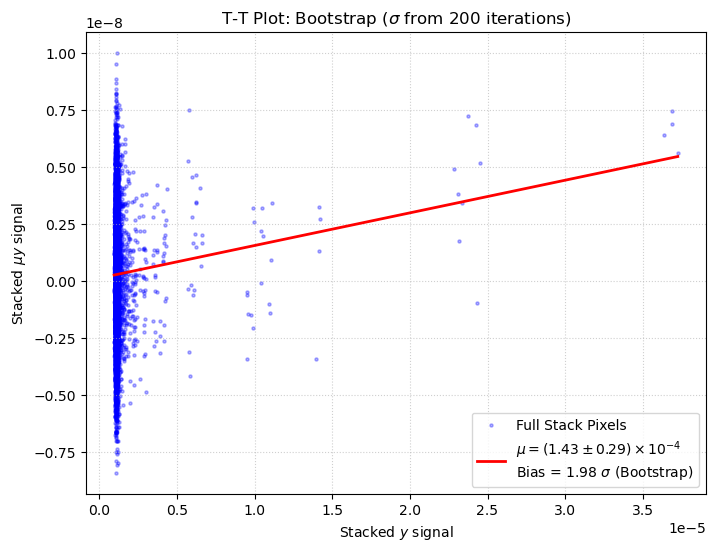

In [ ]:
### PLOTTING THE P-CILC T-T CORRELATION WITH fast BOOTSTRAP ERROR ESTIMATION --- y_hat_cilc Vs. y_hat_muy_cilc --- Full Map ###

final_slope, robust_std_err, bias = plot_y_vs_muy_fast_bootstrap(
    hp_map_y=y_hat_pixel_cilc,
    hp_map_muy=muy_hat_pixel_cilc,
    cluster_coords=cluster_coords,
    mu_true=mu,
    n_bootstrap=200,
    xsize=100,
    reso=1.5,
    filename="TT_Plot_PCILC"
)

### 10p radius cut --- 10e3 stacked patches

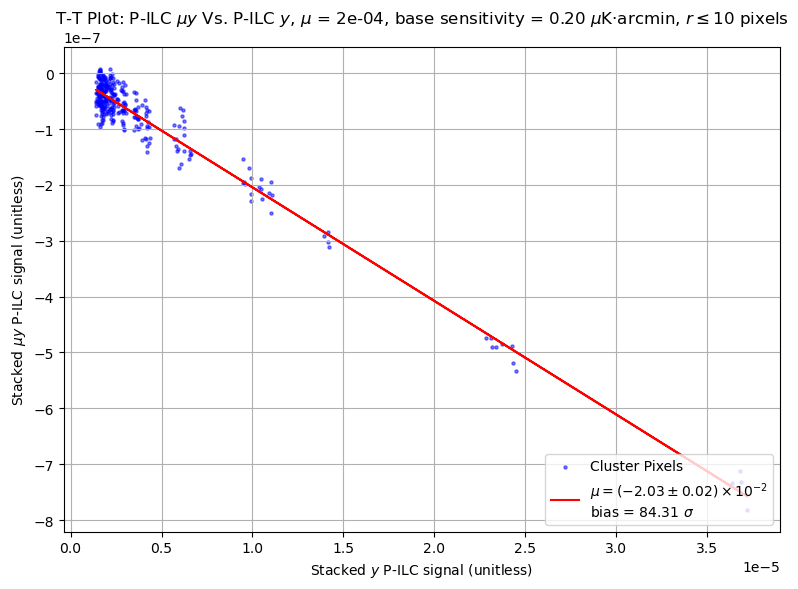

--- Statistics ---
y = -2.03e-02 * x + -1.14e-09
R-squared: 0.9568, p-value: 6.41e-217, std_err: 2.43e-04
----------------------
Measured mu = -2.03e-02
Input    mu = 2.00e-04


In [ ]:
### PLOTTING THE P-ILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FROM THE 10^3 STACKED PATCHES --- 10p radius --- y_hat_ilc Vs. y_hat_muy_ilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy_10p_radius(stack_y_ilc_10e3, stack_muy_ilc_10e3, mu, base_sensitivity_uk_arcmin, n_clusters=1000,
                                                                        filename="TT_Plot_PILC",
                                                                        xlabel=rf'Stacked $y$ P-ILC signal (unitless)',
                                                                        ylabel=rf'Stacked $\mu y$ P-ILC signal (unitless)',
                                                                        title=rf'T-T Plot: P-ILC $\mu y$ Vs. P-ILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

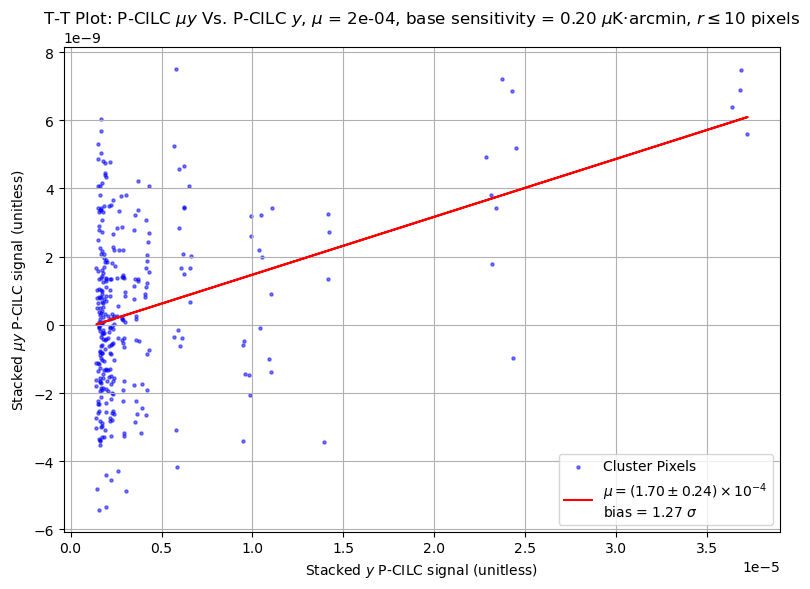

--- Statistics ---
y = 1.70e-04 * x + -2.27e-10
R-squared: 0.1387, p-value: 7.21e-12, std_err: 2.38e-05
----------------------
Measured mu = 1.70e-04
Input    mu = 2.00e-04


In [ ]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FROM THE 10^3 STACKED PATCHES --- 10p radius --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy_10p_radius(stack_y_cilc_10e3, stack_muy_cilc_10e3, mu, base_sensitivity_uk_arcmin, n_clusters=1000,
                                                                        filename="TT_Plot_PCILC",
                                                                        xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                        ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                        title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

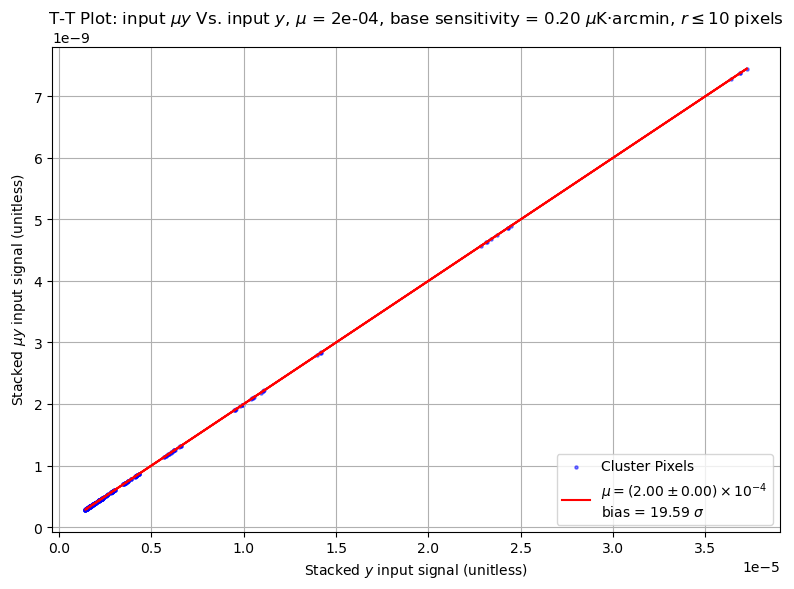

--- Statistics ---
y = 2.00e-04 * x + -9.02e-17
R-squared: 1.0000, p-value: 0.00e+00, std_err: 3.75e-13
----------------------
Measured mu = 2.00e-04
Input    mu = 2.00e-04


In [ ]:
### PLOTTING THE INPUT T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FROM THE 10^3 STACKED PATCHES --- 10p radius --- y_real Vs. muy_real --- TEST ON THE TT PLOT FUNCTION ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy_10p_radius(stack_y, stack_muy, mu, base_sensitivity_uk_arcmin, n_clusters=1000,
                                                                        filename="TT_Plot_INPUT",
                                                                        xlabel=rf'Stacked $y$ input signal (unitless)',
                                                                        ylabel=rf'Stacked $\mu y$ input signal (unitless)',
                                                                        title=rf'T-T Plot: input $\mu y$ Vs. input $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

ODR

In [16]:
def plot_y_vs_muy_10p_radius_odr(stack_y_ilc, stack_muy_ilc,
                                mu, base_sensitivity_uk_arcmin,
                                filename="TT_Plot.pdf",
                                xlabel=rf'Stacked $y$ real signal (unitless)',
                                ylabel=rf'Stacked $\mu y$ processed signal (unitless)',
                                title=rf'T-T Plot: processed $\mu y$ Vs. real $y$'):
    
    x_data = stack_y_ilc.flatten()
    y_data = stack_muy_ilc.flatten()

    # r = 10 pixel
    center = np.array(stack_y_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_y_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10  # Keep pixels within a 10 pixel radius
    x_data = x_data[mask.flatten()]
    y_data = y_data[mask.flatten()]

    # --- Use Orthogonal Distance Regression (ODR) ---
    # This accounts for errors in both x and y
    linear_model = odr.Model(lambda p, x: p[0] * x + p[1])
    data = odr.Data(x_data, y_data)
    # Use OLS results as starting guess
    ols_slope, ols_intercept, _, _, _ = stats.linregress(x_data, y_data)
    my_odr = odr.ODR(data, linear_model, beta0=[ols_slope, ols_intercept])
    output = my_odr.run()
    
    slope, intercept = output.beta
    # standard error of the slope from the covariance matrix
    std_err = output.sd_beta[0] 

    # Give the r and p values from the OLS for reference, but note that ODR doesn't directly provide these
    r_value = np.corrcoef(x_data, y_data)[0, 1]
    p_value = 2 * (1 - stats.norm.cdf(np.abs(r_value)))
    
    # Calculate bias using the more robust std_err
    bias = np.abs(slope - mu)/std_err if std_err != 0 else 0.0

    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        if (std_err / abs(slope)) < 1e-4:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
        else:
            label_text = rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + rf'bias = {bias:.2f} $\sigma$'
    else:
        label_text = rf'$\mu = 0.00 \pm 0.00$' + '\n' + rf'bias = {bias:.2f} $\sigma$'

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.3, s=5, label='Cluster Pixels', color='blue', edgecolors='none')
    
    # Plot the regression line
    x_fit = np.array([np.min(x_data), np.max(x_data)])
    plt.plot(x_fit, slope * x_fit + intercept, color='red', lw=2, label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    
    # Updated path logic to handle mu scientific notation in folder name
    folder_mu = f"{mu:.0e}".replace("+", "")
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{folder_mu}/TT_plots/10p/{filename}_10p_ODR.pdf"
    
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err, bias

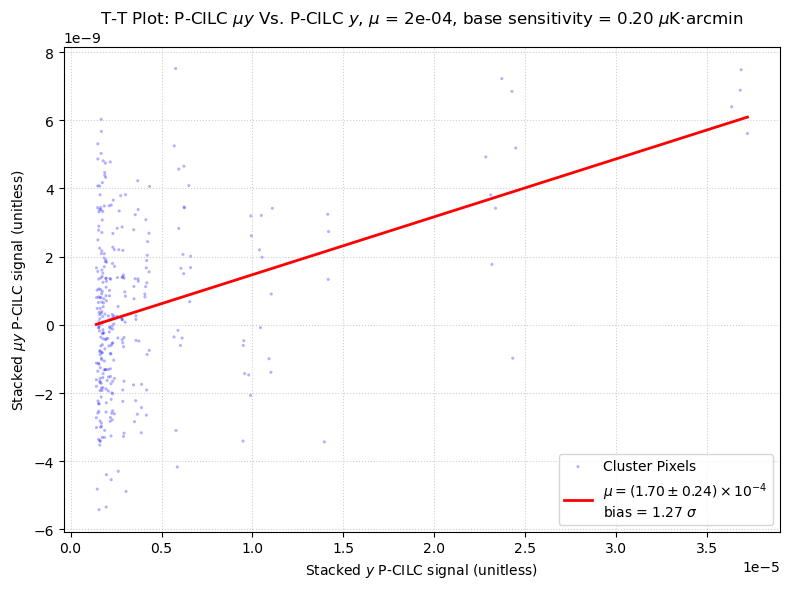

--- Statistics ---
y = 1.70e-04 * x + -2.27e-10
R-squared: 0.1387, p-value: 7.10e-01, std_err: 2.38e-05
----------------------
Measured mu = 1.70e-04
Input    mu = 2.00e-04


In [17]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err, bias = plot_y_vs_muy_10p_radius_odr(stack_y_cilc, stack_muy_cilc,
                                                                                        mu, base_sensitivity_uk_arcmin,
                                                                                        filename="TT_Plot_PCILC",
                                                                                        xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                                        ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                                        title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

BOOTSTRAP

In [22]:
def plot_y_vs_muy_fast_bootstrap_10p_radius(hp_map_y, hp_map_muy, cluster_coords, mu_true, 
                                            n_bootstrap=200, xsize=100, reso=1.5, filename="TT_Bootstrap_Fast.pdf"):
    """
    Optimized Bootstrap: Projects each cluster once, then resamples in memory.
    """
    import math
    n_clusters = len(cluster_coords)
    
    # 1. PRE-CALCULATE LIBRARY
    print(f"Pre-calculating library for {n_clusters} clusters...")
    library_y = []
    library_muy = []
    
    for lon, lat in cluster_coords:
        p_y = hp.gnomview(hp_map_y, rot=[lon, lat], reso=reso, xsize=xsize, 
                          return_projected_map=True, no_plot=True)
        p_muy = hp.gnomview(hp_map_muy, rot=[lon, lat], reso=reso, xsize=xsize, 
                            return_projected_map=True, no_plot=True)
        library_y.append(p_y)
        library_muy.append(p_muy)
        plt.close() # Crucial to prevent memory leaks from hidden figures
    
    library_y = np.array(library_y)
    library_muy = np.array(library_muy)

    # 2. BOOTSTRAP LOOP
    print(f"Running {n_bootstrap} bootstrap iterations...")
    bootstrap_slopes = []
    
    for _ in range(n_bootstrap):
        idx = np.random.randint(0, n_clusters, size=n_clusters)
        # Average the sampled patches, then flatten for regression
        boot_stack_y = np.mean(library_y[idx], axis=0).flatten()
        boot_stack_muy = np.mean(library_muy[idx], axis=0).flatten()
        
        res = stats.linregress(boot_stack_y, boot_stack_muy)
        bootstrap_slopes.append(res.slope)

    # 3. STATISTICS
    final_slope = np.mean(bootstrap_slopes)
    robust_std_err = np.std(bootstrap_slopes, ddof=1)
    
    # Avoid division by zero in bias if error is 0
    bias = np.abs(final_slope - mu_true) / robust_std_err if robust_std_err > 0 else 0.0

    # 4. PREPARE PLOT DATA
    # x_data and y_data are the pixels of the FULL average stack
    x_data = np.mean(library_y, axis=0).flatten()
    y_data = np.mean(library_muy, axis=0).flatten()

    # r = 10 pixel
    center = np.array(stack_y_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_y_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10  # Keep pixels within a 10 pixel radius
    x_data = x_data[mask.flatten()]
    y_data = y_data[mask.flatten()]
    
    # Get intercept from the full stack for the plot line
    res_full = stats.linregress(x_data, y_data)
    final_intercept = res_full.intercept

    # 5. FORMATTING LEGEND
    if final_slope != 0:
        common_exp = math.floor(math.log10(abs(final_slope)))
        val_scaled = final_slope / (10**common_exp)
        err_scaled = robust_std_err / (10**common_exp)
        label_text = (rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + 
                      rf'Bias = {bias:.2f} $\sigma$ (Bootstrap)')
    else:
        label_text = rf"$\mu = 0.00 \pm 0.00$"

    # 6. PLOTTING
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.3, s=5, color='blue', label='Full Stack Pixels')
    
    line_x = np.array([np.min(x_data), np.max(x_data)])
    plt.plot(line_x, final_slope * line_x + final_intercept, color='red', lw=2, label=label_text)

    plt.xlabel(rf'Stacked $y$ signal')
    plt.ylabel(rf'Stacked $\mu y$ signal')
    plt.title(rf'T-T Plot: Bootstrap ($\sigma$ from {n_bootstrap} iterations)')
    plt.legend(loc='lower right')
    plt.grid(True, linestyle=':', alpha=0.6)
    
    # Save logic
    folder_mu = rf"{mu_true:.0e}".replace("+", "")
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{folder_mu}/TT_plots/Full_map/{filename}_10p_Fast_Bootstrap.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return final_slope, robust_std_err, bias

Pre-calculating library for 1000 clusters...
Running 200 bootstrap iterations...


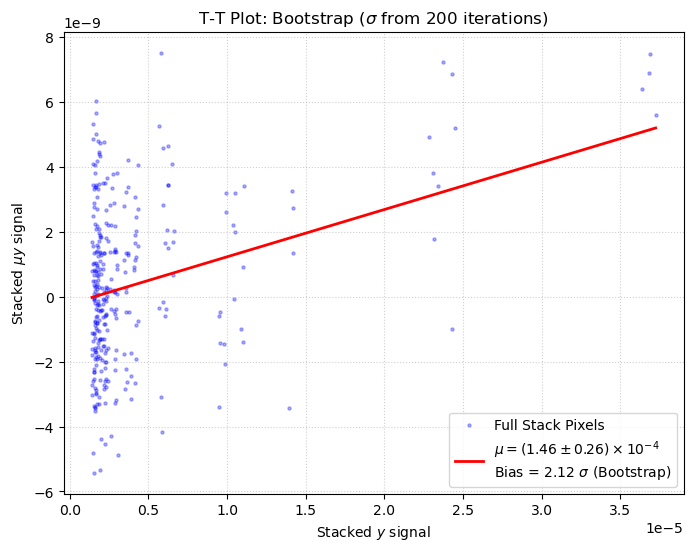

In [23]:
### PLOTTING THE P-CILC T-T CORRELATION WITH fast BOOTSTRAP ERROR ESTIMATION --- y_hat_cilc Vs. y_hat_muy_cilc --- 10p radius ###

final_slope, robust_std_err, bias = plot_y_vs_muy_fast_bootstrap_10p_radius(
    hp_map_y=y_hat_pixel_cilc,
    hp_map_muy=muy_hat_pixel_cilc,
    cluster_coords=cluster_coords,
    mu_true=mu,
    n_bootstrap=200,
    xsize=100,
    reso=1.5,
    filename="TT_Plot_PCILC"
)

### 10p? Let's see what it means and some other values

In [31]:
def plot_y_vs_muy_multi_radius(stack_y_ilc, stack_muy_ilc, mu, base_sensitivity_uk_arcmin, n_clusters,
                               radius_list=[5, 10, 15, 20], reso_arcmin=1.5,
                               xlabel=rf'Stacked $y$ real signal (unitless)',
                               ylabel=rf'Stacked $\mu y$ processed signal (unitless)'):
    
    n_clusters_str = f"{n_clusters:.0e}".replace("+", "")
    mu_str = f"{mu:.0e}".replace("+", "")
    
    # Store results to return them at the end
    results = {}

    for r_pix in radius_list:
        # Calculate Physical Scale
        radius_arcmin = r_pix * reso_arcmin
        surface_arcmin2 = np.pi * (radius_arcmin**2)
        
        # 1. Apply Circular Mask
        center = np.array(stack_y_ilc.shape) // 2
        y_indices, x_indices = np.indices(stack_y_ilc.shape)
        distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
        mask = distances <= r_pix
        
        x_masked = stack_y_ilc[mask].flatten()
        y_masked = stack_muy_ilc[mask].flatten()

        # 2. Linear Regression
        slope, intercept, r_val, p_val, std_err = stats.linregress(x_masked, y_masked)
        bias = np.abs(slope - mu)/std_err if std_err != 0 else 0.0
        significance = np.abs(slope)/std_err if std_err != 0 else 0.0

        # 3. Label Formatting (Fixed 2-decimal scientific)
        common_exp = math.floor(math.log10(abs(slope))) if slope != 0 else 0
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)

        # 4. Chi-squared
        n_pix_total = len(x_masked)
        if n_pix_total > 2:
            y_pred = slope * x_masked + intercept
            residuals = y_masked - y_pred
            
            # PHYSICAL FIX: Measure the noise standard deviation from the UNMASKED 
            # background pixels of the stack (outer corners where there is no cluster signal)
            # This provides an independent tracker for pixel uncertainty.
            sigma_pixel_independent = np.std(stack_muy_ilc[~mask]) 
            
            if sigma_pixel_independent > 0:
                chi2_total = np.sum((residuals / sigma_pixel_independent) ** 2)
                dof = n_pix_total - 2
                chi2_red = chi2_total / dof
            else:
                chi2_red = 0.0
        else:
            chi2_red = 0.0
        
        label_text = (rf'$\mu = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' + 
                      rf'Significance = {significance:.2f} $\sigma$' + '\n' +
                      rf'Bias = {bias:.2f} $\sigma$' + '\n' +
                      rf'$r^2 = {r_val**2:.4f}$' + '\n' +
                      rf'$\chi^2_{{\text{{red}}}}$ = {chi2_red:.2f}')

        # 4. Plotting
        plt.figure(figsize=(8, 6))
        plt.scatter(x_masked, y_masked, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
        plt.plot(x_masked, slope * x_masked + intercept, color='red', label=label_text)

        title = (rf'T-T Plot: $r \leq {r_pix}$ pix ({radius_arcmin:.1f}$^\prime$). Area $\approx$ {surface_arcmin2:.1f} arcmin$^2$, $N = {n_clusters_str}$')
        
        plt.title(title)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend(loc='lower right')
        plt.grid(True, linestyle=':', alpha=0.6)
        plt.tight_layout()
        
        # 5. Save Logic (Auto-creating directories)
        save_dir = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/TT_plots/{n_clusters:.0e}/"
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
            
        filename = f"TT_Plot_CILC_{mu_str}_{n_clusters_str}_{r_pix}p.pdf"
        plt.savefig(os.path.join(save_dir, filename), dpi=300, bbox_inches='tight')
        plt.show()
        
        results[r_pix] = {'slope': slope, 'std_err': std_err, 'bias': bias, 'significance': significance, 'r^2': r_val**2, 'chi2_red': chi2_red}

    return results

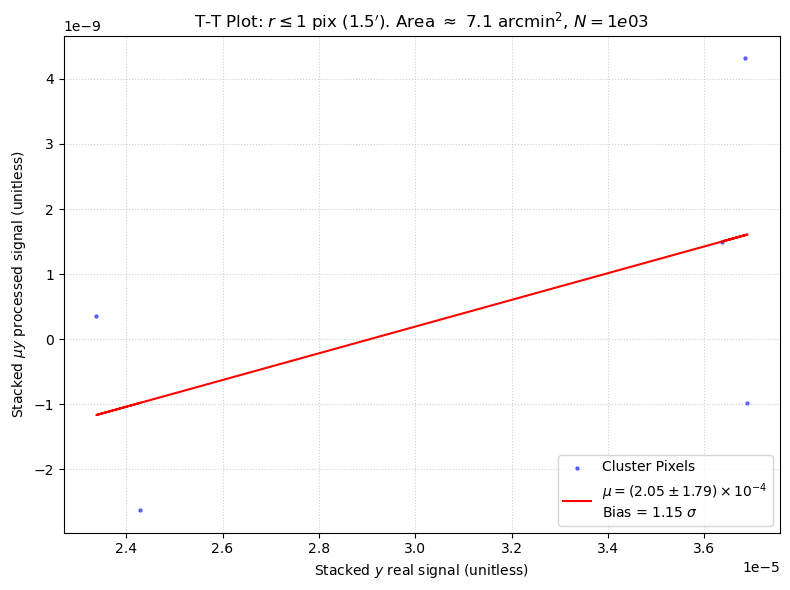

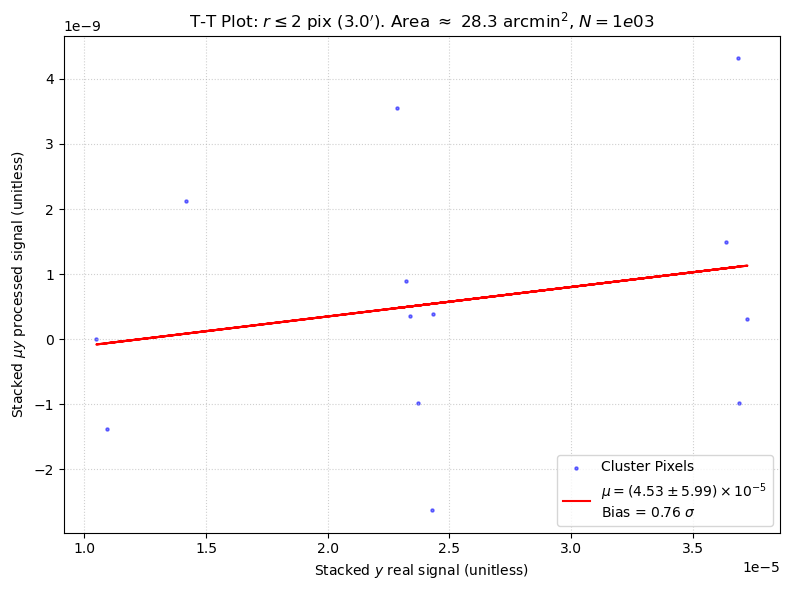

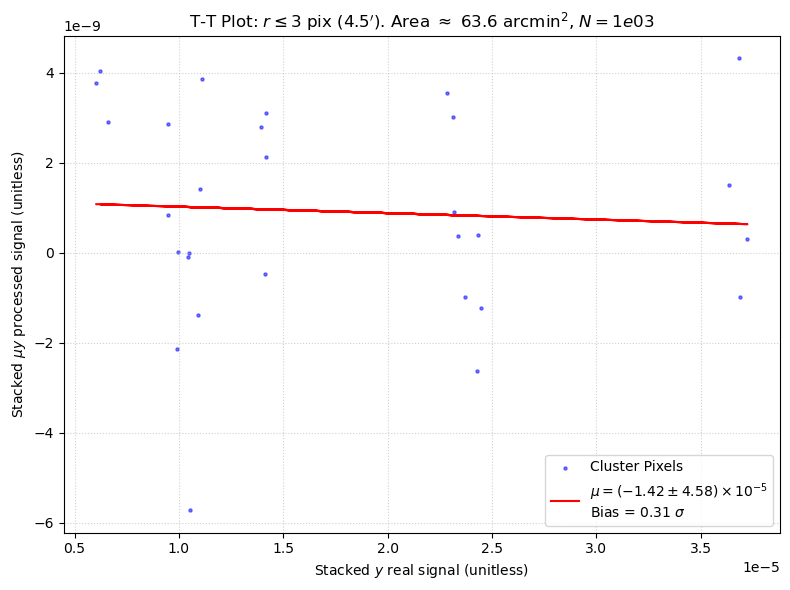

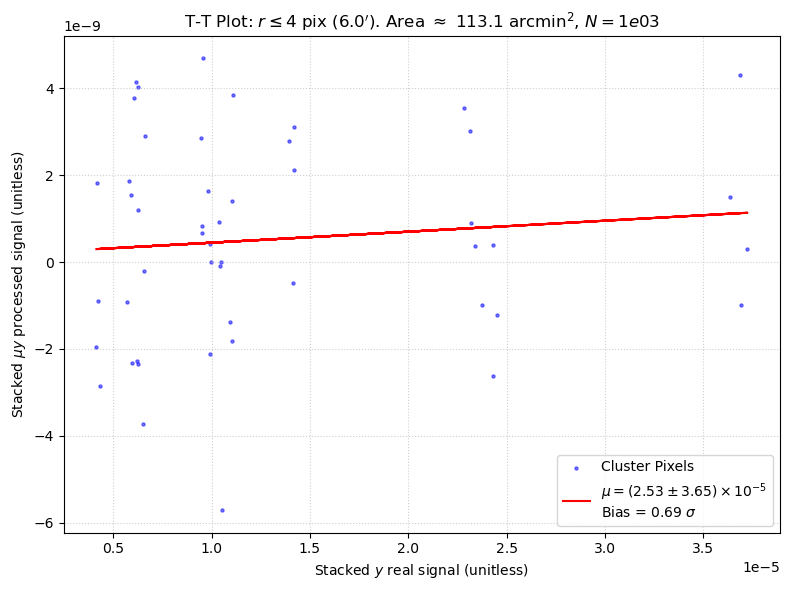

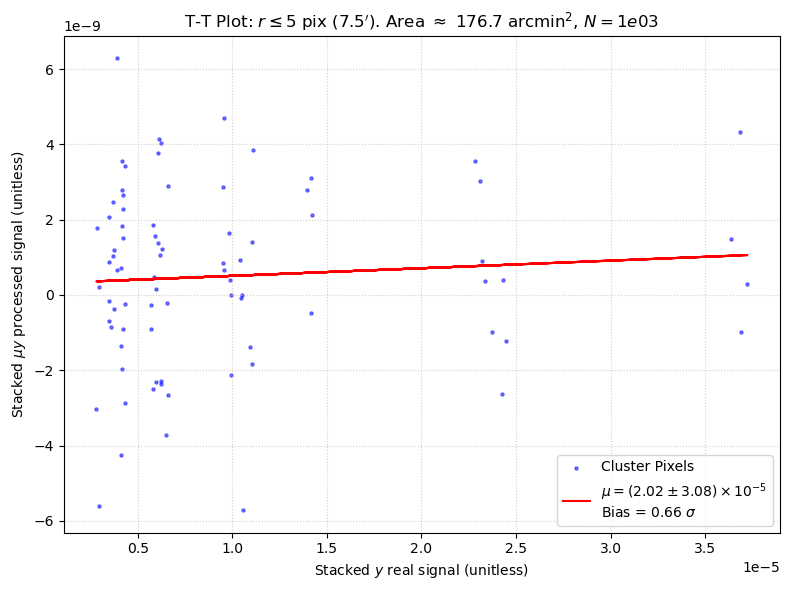

...

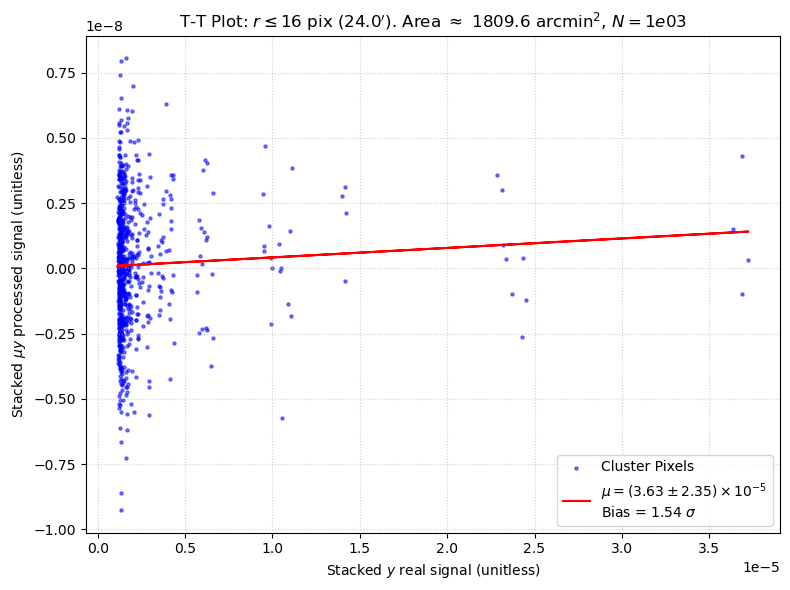

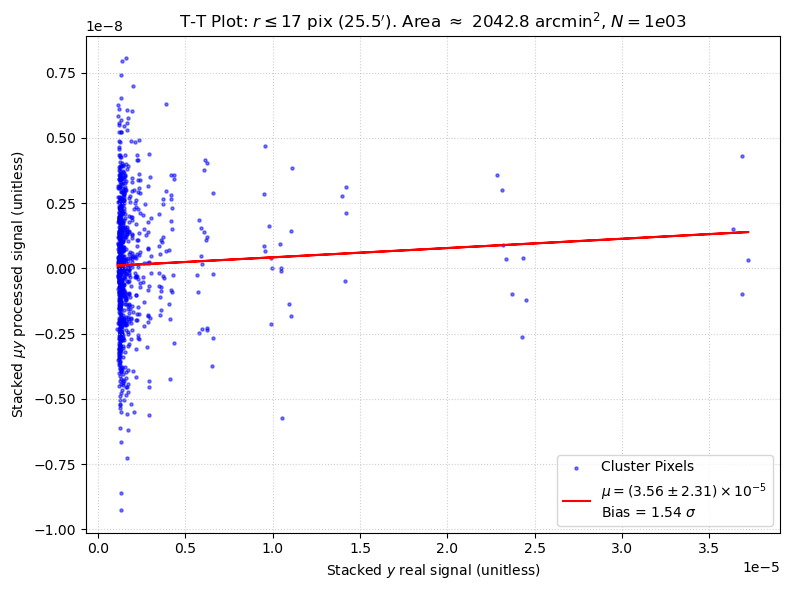

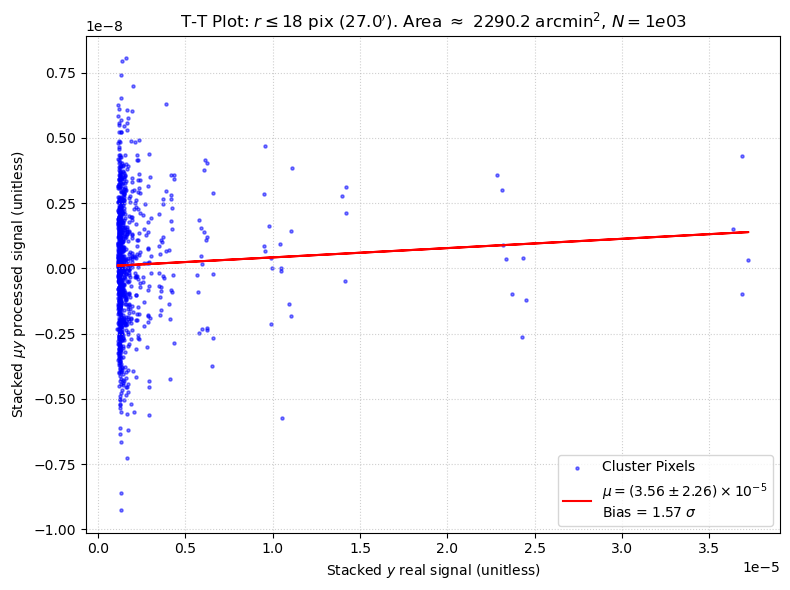

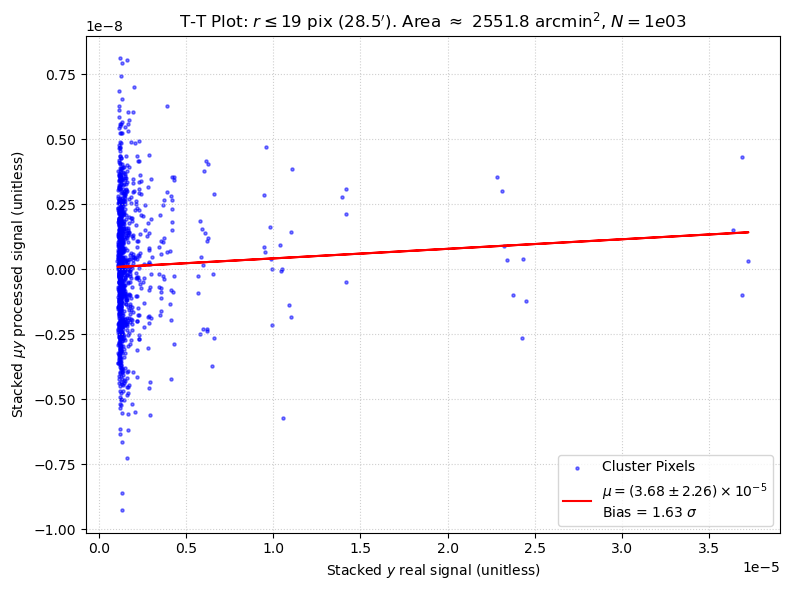

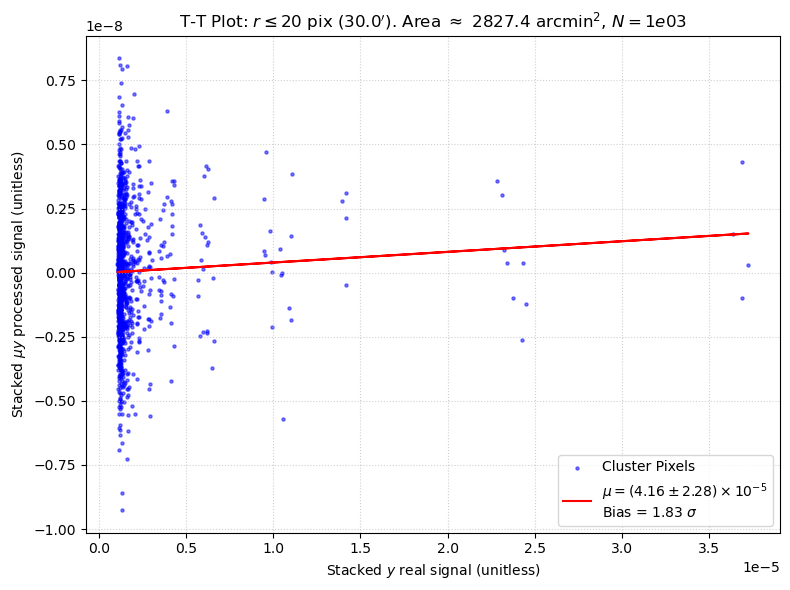

In [ ]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FOR MULTIPLE RADII at 10^3 STACKED CLUSTERS --- radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10] --- y_hat_cilc Vs. y_hat_muy_cilc ###

results_2e05 = plot_y_vs_muy_multi_radius(
    stack_y_cilc_10e3, 
    stack_muy_cilc_10e3, 
    mu=mu, 
    base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, 
    n_clusters=1000,
    radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
)

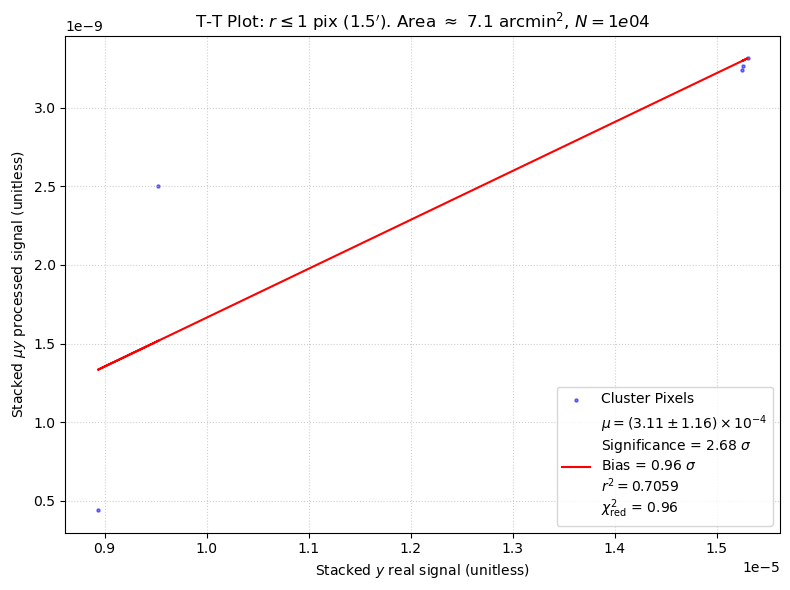

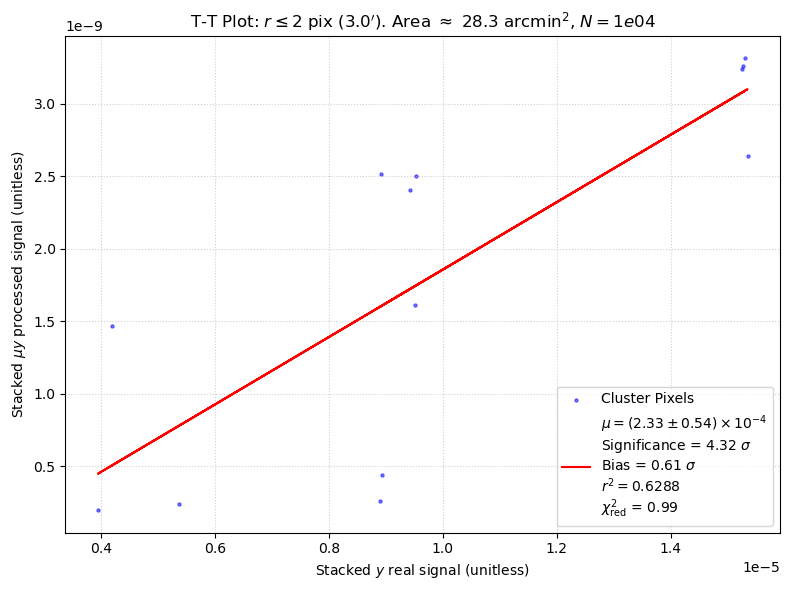

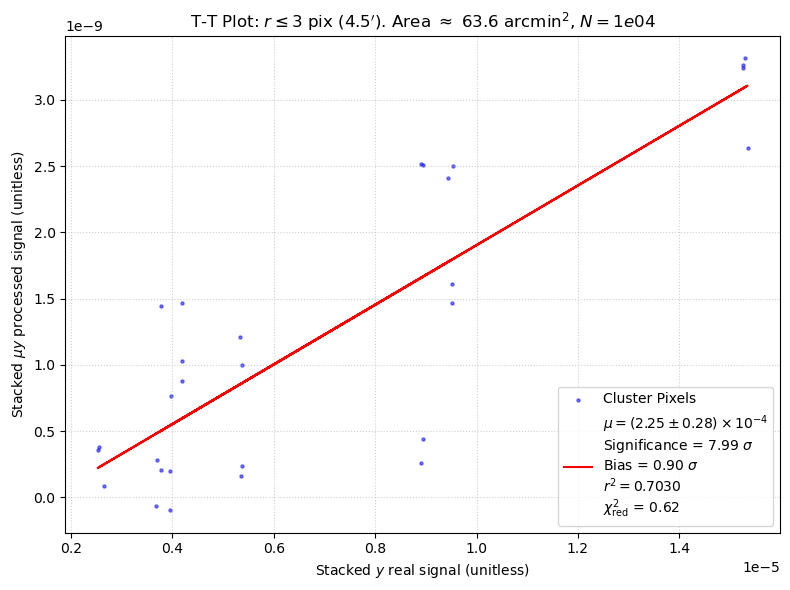

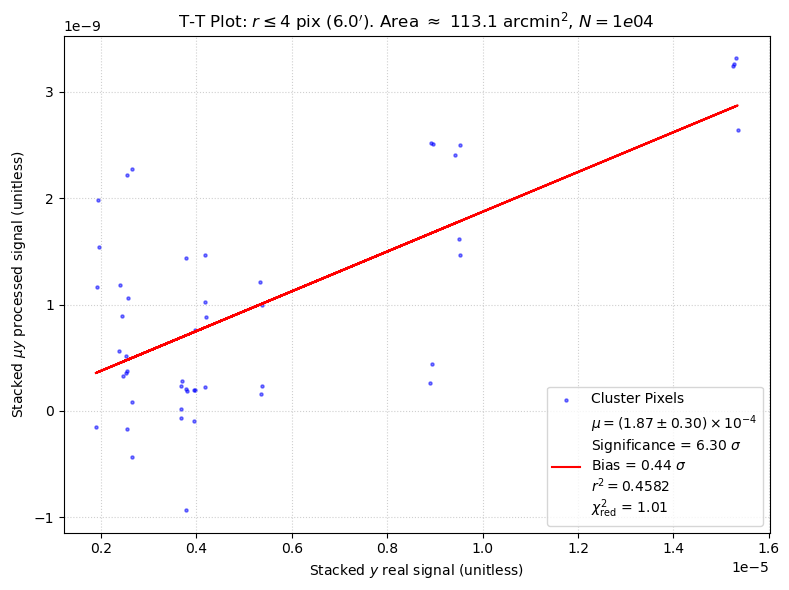

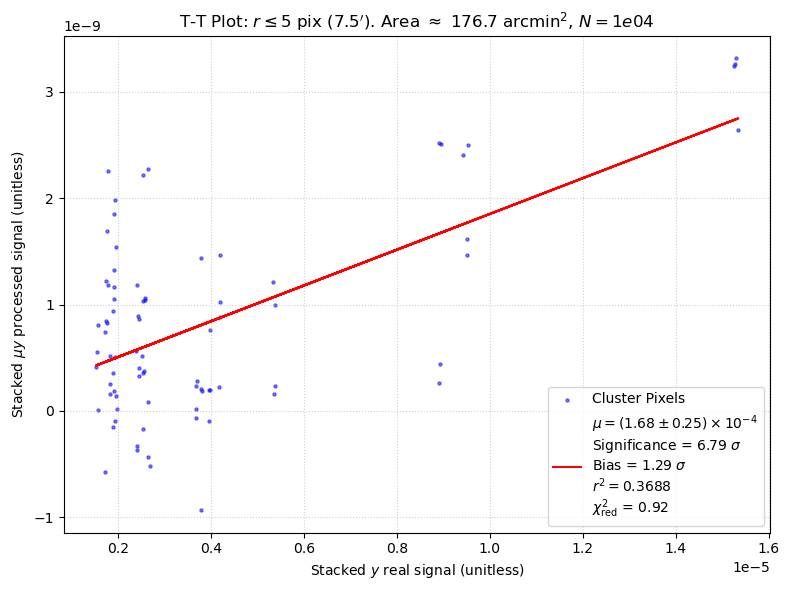

...

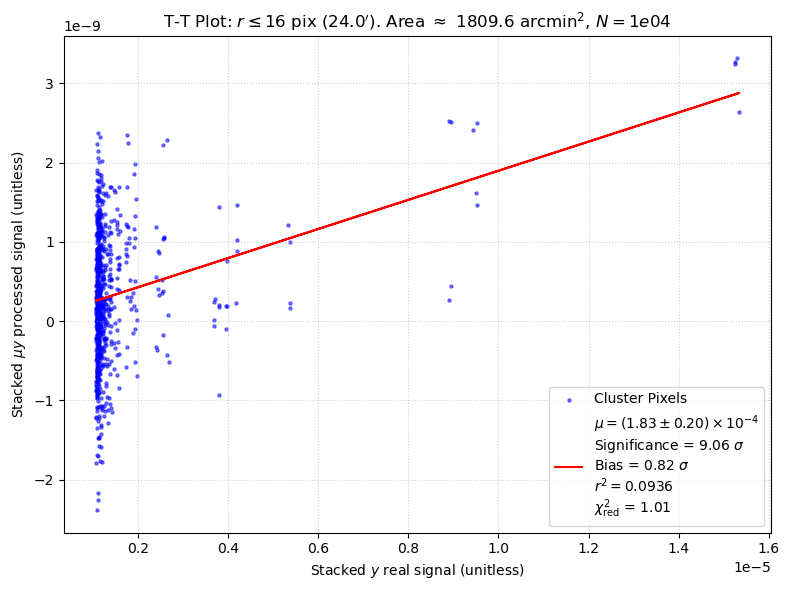

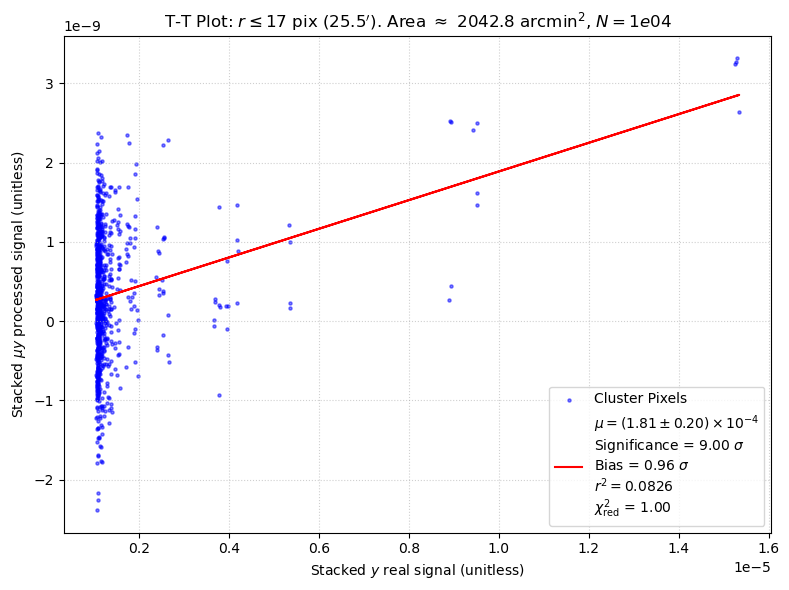

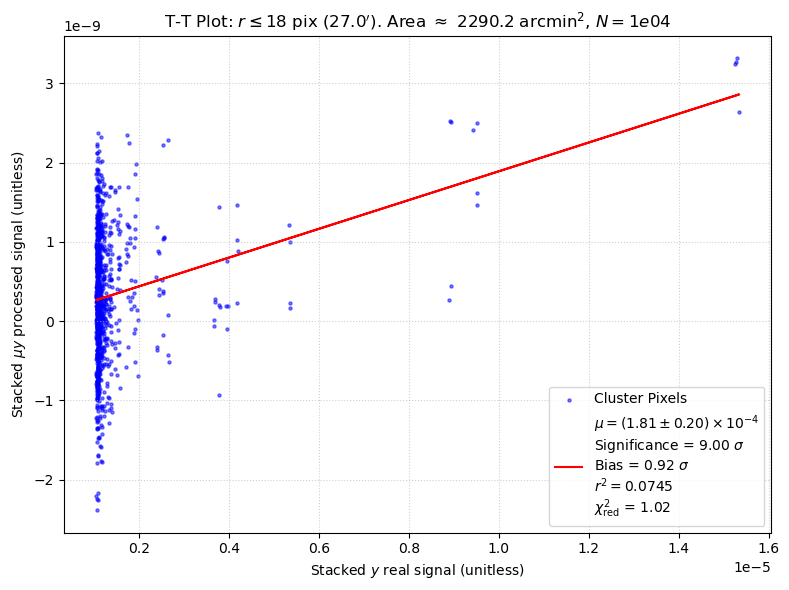

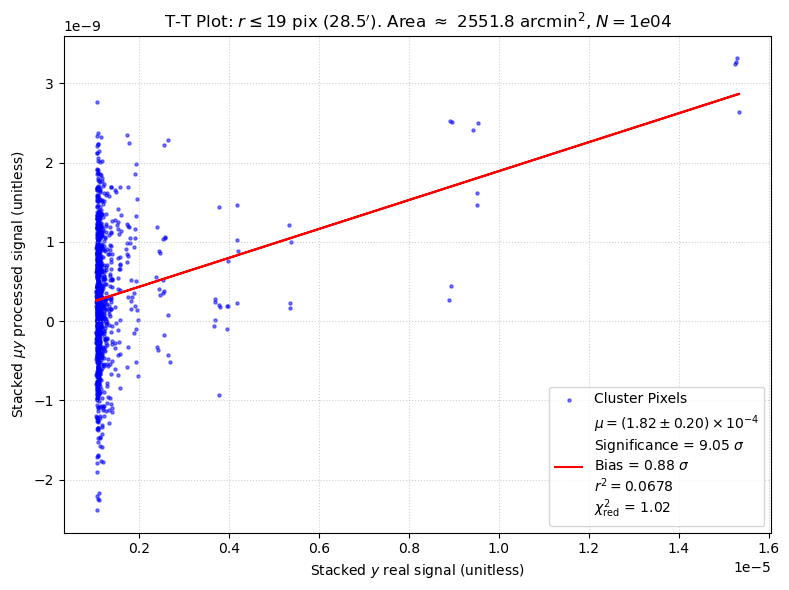

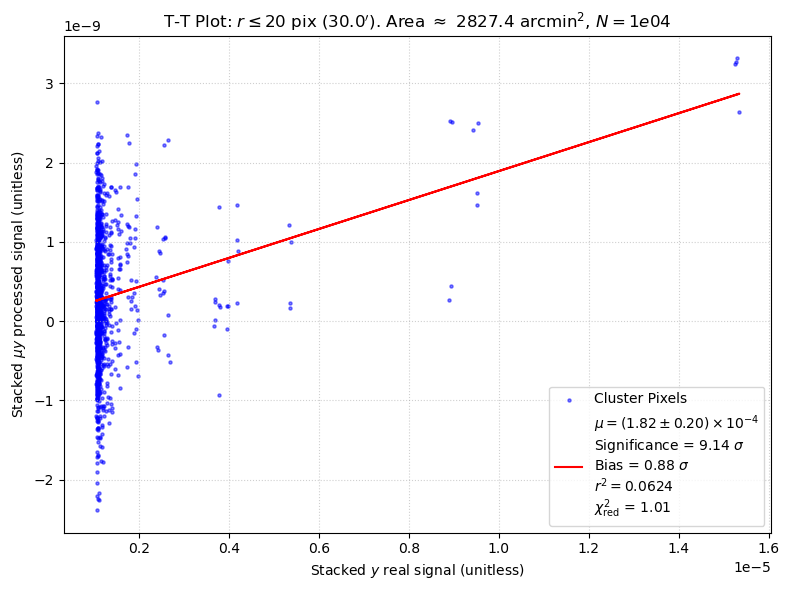

In [32]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FOR MULTIPLE RADII at 10^4 STACKED CLUSTERS --- radius_list=[1, ..., 20] --- y_hat_cilc Vs. y_hat_muy_cilc ###

results_2e05 = plot_y_vs_muy_multi_radius(
    stack_y_cilc_10e4, 
    stack_muy_cilc_10e4, 
    mu=mu, 
    base_sensitivity_uk_arcmin=base_sensitivity_uk_arcmin, 
    n_clusters=10000,
    radius_list=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
)

### 10p radius cut --- 10e4 stacked patches

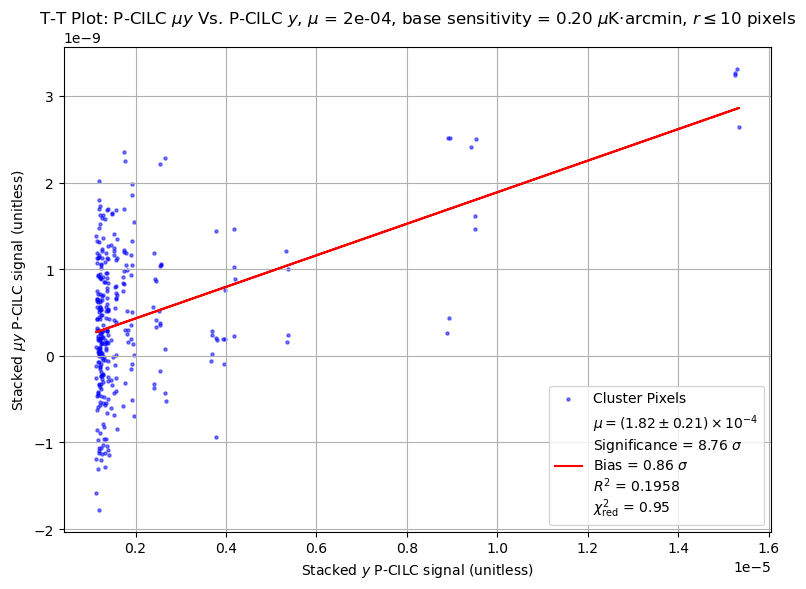

--- Statistics ---
y = 1.82e-04 * x + 6.74e-11
Significance: 8.76 σ
Bias: 0.86 σ
R^2: 0.1958
Red Chi^2: 0.95
p-value: 1.25e-16
std_err: 2.08e-05
----------------------
Measured mu = 1.82e-04
Input    mu = 2.00e-04


In [12]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FROM THE 10^4 STACKED PATCHES --- 10p radius --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err, bias, significance, chi2_red = plot_y_vs_muy_10p_radius(
    stack_y_cilc_10e4, stack_muy_cilc_10e4,
    mu, base_sensitivity_uk_arcmin,
    n_clusters=1e+04,
    filename="TT_Plot_PCILC",
    xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
    ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
    title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels'
    )
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"Significance: {significance:.2f} σ")
print(f"Bias: {bias:.2f} σ")
print(f"R^2: {r_value**2:.4f}")
print(f"Red Chi^2: {chi2_red:.2f}")
print(f"p-value: {p_value:.2e}")
print(f"std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

BOOTSTRAP

In [16]:
def compute_and_save_bootstrap_data(hp_map_y, hp_map_muy, cluster_coords, mu_true, 
                                    save_data_path, n_bootstrap=200, xsize=100, reso=1.5):
    """
    Executes heavy map stacking and bootstrap operations, then saves the 
    raw numerical results to disk as an uncompressed .npz dictionary.
    """
    n_clusters = len(cluster_coords)
    
    # Pre-calculate the 10-pixel mask layout based on patch size
    center = np.array([xsize, xsize]) // 2
    y_indices, x_indices = np.indices((xsize, xsize))
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10
    
    # 1. PRE-CALCULATE MASKED LIBRARY
    print(f"Pre-calculating masked library for {n_clusters} clusters...")
    library_y = []
    library_muy = []
    
    for lon, lat in cluster_coords:
        p_y = hp.gnomview(hp_map_y, rot=[lon, lat], reso=reso, xsize=xsize, 
                          return_projected_map=True, no_plot=True)
        p_muy = hp.gnomview(hp_map_muy, rot=[lon, lat], reso=reso, xsize=xsize, 
                            return_projected_map=True, no_plot=True)
        
        library_y.append(p_y[mask])
        library_muy.append(p_muy[mask])
        
        import matplotlib.pyplot as plt
        plt.close('all') 
    
    library_y = np.array(library_y)
    library_muy = np.array(library_muy)
    gc.collect()

    # 2. BOOTSTRAP LOOP
    print(f"Running {n_bootstrap} bootstrap iterations...")
    bootstrap_slopes = []
    for _ in range(n_bootstrap):
        idx = np.random.randint(0, n_clusters, size=n_clusters)
        boot_stack_y = np.mean(library_y[idx], axis=0)
        boot_stack_muy = np.mean(library_muy[idx], axis=0)
        
        res = stats.linregress(boot_stack_y, boot_stack_muy)
        bootstrap_slopes.append(res.slope)

    # 3. STATISTICS
    final_slope = np.mean(bootstrap_slopes)
    robust_std_err = np.std(bootstrap_slopes, ddof=1)
    bias = np.abs(final_slope - mu_true) / robust_std_err if robust_std_err > 0 else 0.0
    significance_sigma = final_slope / robust_std_err if robust_std_err > 0 else 0.0

    # 4. PREPARE PLOT DATA
    x_data = np.mean(library_y, axis=0)
    y_data = np.mean(library_muy, axis=0)
    
    res_full = stats.linregress(x_data, y_data)
    final_intercept = res_full.intercept

    # 5. INDEPENDENT REDUCED CHI-SQUARED
    n_pix_total = len(x_data)
    if n_pix_total > 2:
        y_pred = final_slope * x_data + final_intercept
        residuals = y_data - y_pred
        sigma_pixel = np.std(library_muy) / np.sqrt(n_clusters)
        
        if sigma_pixel > 0:
            chi2_total = np.sum((residuals / sigma_pixel) ** 2)
            dof = n_pix_total - 2
            chi2_red = chi2_total / dof
        else:
            chi2_red = 0.0
    else:
        chi2_red = 0.0

    # 6. SAVE THE DATA IN THE LOCAL DISK
    # a. Define the directory path
    bootstrap_dir = f'/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu_true:.0e}_{freq_str_name}_maps/Bootstrap_data'
    
    # b. Ensure the directory actually exists on your Mac
    if not os.path.exists(bootstrap_dir):
        os.makedirs(bootstrap_dir)
        
    # c. Combine the directory with a hardcoded clear filename
    bootstrap_data_path = os.path.join(bootstrap_dir, "bootstrap_results_10e4.npz")

    # Save data arrays and metadata scalars directly to disk
    np.savez(bootstrap_data_path, 
             x_data=x_data, 
             y_data=y_data, 
             final_slope=final_slope, 
             final_intercept=final_intercept, 
             robust_std_err=robust_std_err, 
             bias=bias, 
             significance_sigma=significance_sigma, 
             rvalue_sq=res_full.rvalue**2, 
             chi2_red=chi2_red,
             n_bootstrap=n_bootstrap,
             n_clusters=n_clusters)
    
    print(f"Numerical results successfully saved to: {bootstrap_data_path}")
    return final_slope, robust_std_err, bias, significance_sigma, chi2_red

In [17]:
### RUN BOOTSTRAP AND SAVE THE DATA ###

# Setup data directory configuration path
data_dump_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}/Bootstrap_data/bootstrap_results_10e4.npz"

# Run calculation once
compute_and_save_bootstrap_data(
    hp_map_y=y_hat_pixel_cilc,
    hp_map_muy=muy_hat_pixel_cilc,
    cluster_coords=cluster_coords_10e4,
    mu_true=mu,
    save_data_path=data_dump_path,
    n_bootstrap=200
)

Pre-calculating masked library for 10000 clusters...
Running 200 bootstrap iterations...
Numerical results successfully saved to: /Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_2e-04_Zegeye_maps/Bootstrap_data/bootstrap_results_10e4.npz


(np.float64(0.0001825947250182816),
 np.float64(2.535867737234133e-05),
 np.float64(0.6863636744991403),
 np.float64(7.200482988021977),
 np.float64(0.9547096559423034))

In [12]:
def load_and_plot_latex_bootstrap(saved_data_path, save_pdf_path, freq_name="PICO"):
    """
    Loads saved bootstrap data structures and builds a clean, publication-ready
    LaTeX math-rendered scatter configuration for your thesis documentation.
    """
    # Load data from disk
    data = np.load(saved_data_path)
    x_data = data['x_data']
    y_data = data['y_data']
    final_slope = float(data['final_slope'])
    final_intercept = float(data['final_intercept'])
    robust_std_err = float(data['robust_std_err'])
    bias = float(data['bias'])
    significance_sigma = float(data['significance_sigma'])
    rvalue_sq = float(data['rvalue_sq'])
    chi2_red = float(data['chi2_red'])
    n_bootstrap = int(data['n_bootstrap'])
    n_clusters = int(data['n_clusters'])

    # --- LATEX COMPATIBLE ENGINE ARCHITECTURE ---
    plt.rcParams.update({
        "text.usetex": True,                 # Force true LaTeX font compilation
        "font.family": "serif",              # Use default LaTeX Computer Modern Serif
        "font.serif": ["Computer Modern Roman"],
        "font.size": 16,                     # Mida base alta ideal per a matrius 2x2
        "axes.labelsize": 18,                # Etiquetes dels eixos grans i clars
        "axes.titlesize": 16,                # Títol del gràfic proporcional
        "legend.fontsize": 13,               # Llegenda perfectament llegible reduïda
        "xtick.labelsize": 15,
        "ytick.labelsize": 15,
        "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}" 
    })

    # 1. Format Numerical Text values in 2-decimal scientific formatting
    if final_slope != 0:
        common_exp = math.floor(math.log10(abs(final_slope)))
        val_scaled = final_slope / (10**common_exp)
        err_scaled = robust_std_err / (10**common_exp)
        
        # FIX 2: Using \mathrm{red} instead of \text{red} acts as a foolproof native alternative
        label_text = (rf'$\hat{{\mu}} = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$' + '\n' +
                      rf'$\mathcal{{B}} = {bias:.2f} \sigma$')
    else:
        label_text = (rf'$\hat{{\mu}} = 0.00 \pm 0.00$' + '\n' +
                      rf'$\mathcal{{B}} = {bias:.2f} \sigma$')

    # 2. Plot Generation
    fig, ax = plt.subplots(figsize=(6.5, 5)) # Standard textbook aspect layout width
    
    # Soft blue dots with minimal visual alpha weight
    ax.scatter(x_data, y_data, alpha=0.3, s=6, color='royalblue', label='Masked Stack Pixels')
    
    # Clean analytical linear regression line
    line_x = np.array([np.min(x_data), np.max(x_data)])
    ax.plot(line_x, final_slope * line_x + final_intercept, color='crimson', lw=1.5, label=label_text)

    # Ocultem el text del multiplicador automàtic superior rebel que xocava amb el títol
    ax.xaxis.get_offset_text().set_visible(False)
    ax.yaxis.get_offset_text().set_visible(False)
    
    # Calculem dinàmicament l'exponent real de les teves dades de l'eix Y
    max_y_val = np.max(np.abs(y_data))
    if max_y_val > 0:
        y_exponent = int(math.floor(math.log10(max_y_val)))
    else:
        y_exponent = -1 # Valor de seguretat completament erroni per detectar-ho aviat

    # Feim el mateix per l'eix x
    max_x_val = np.max(np.abs(x_data))
    if max_x_val > 0:
        x_exponent = int(math.floor(math.log10(max_x_val)))
    else:        x_exponent = -1 # Valor de seguretat completament erroni per detectar-ho aviat
        
    # Injectem el multiplicador AUTOMÀTIC directament a dins de la unitat del label del ylabel!
    ax.set_xlabel(rf'Stacked $\hat{{y}} \times 10^{{{x_exponent}}}$')
    ax.set_ylabel(rf'Stacked $\widehat{{\mu y}} \times 10^{{{y_exponent}}}$')
    
    # A standard descriptive subtitle style for top journals
    #title_text = rf'T-T Plot ($N = 10^4$, {n_bootstrap} iterations, $\mu$ = {mu:.0e}, {base_sensitivity_uk_arcmin}$\mu$K·arcmin, {freq_name}, $r \leq 10$ p)'
    title_text = (rf"\begin{{center}} T-T Plot: $\hat{{\mu}}$ extraction, $N = 10^4$, {n_bootstrap} iterations, $r \leq 10$ p,\\"
                rf"$\mu_{{\text{{input}}}} = {mu/1e-4:.0f} \times 10^{{-4}}$, $s_n = {base_sensitivity_uk_arcmin} \mu$K·arcmin, CMB-HD-like configuration \end{{center}}")
    ax.set_title(title_text, pad=-15, loc='center')

    ax.legend(loc='lower right', frameon=True, edgecolor='gainsboro', facecolor='white')
    ax.grid(True, linestyle=':', alpha=0.5)
    plt.tight_layout()
    
    # 4. Save Block
    pdf_dir = os.path.dirname(save_pdf_path)
    if pdf_dir and not os.path.exists(pdf_dir):
        os.makedirs(pdf_dir)
        
    plt.savefig(save_pdf_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f"LaTeX figure updated successfully at: {save_pdf_path}")

    print(f"-------------------------")
    print(f"--- Loaded Statistics ---")
    print(f"-------------------------")
    # Let's print it with pandas
    stats_dict = {
        "Final Slope": [final_slope],
        "Final Intercept": [final_intercept],
        "Robust Std Err": [robust_std_err],
        "Bias (σ)": [bias],
        "Significance (σ)": [significance_sigma],
        "R-squared": [rvalue_sq],
        "Reduced Chi-squared": [chi2_red],
        "N Bootstrap": [n_bootstrap],
        "N Clusters": [n_clusters]
    }
    stats_df = pd.DataFrame(stats_dict)
    print(stats_df.to_string(index=False))

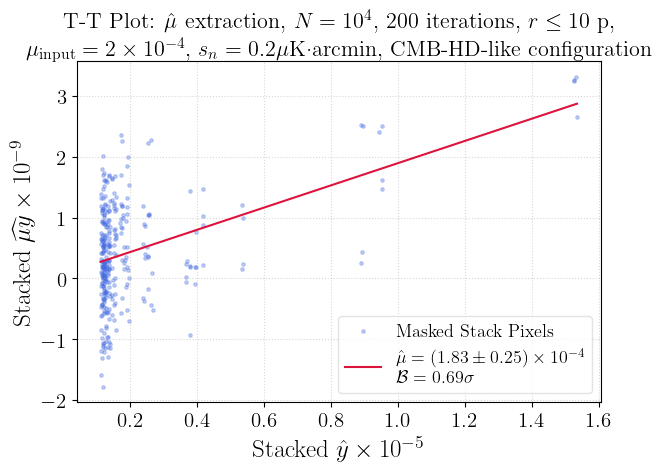

LaTeX figure updated successfully at: /Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_2e-04_Zegeye/TT_plots/10p/1e+04/TT_Plot_PCILC_10p_Fast_Bootstrap.pdf
-------------------------
--- Loaded Statistics ---
-------------------------
 Final Slope  Final Intercept  Robust Std Err  Bias (σ)  Significance (σ)  R-squared  Reduced Chi-squared  N Bootstrap  N Clusters
    0.000183     6.753076e-11        0.000025  0.686364          7.200483   0.195757              0.95471          200       10000


In [13]:
### LOAD THE BOOTSTRAP DATA AND PLOT THE FINAL T-T PLOT WITH LATEX RENDERING FOR PUBLICATION --- y_hat_cilc Vs. y_hat_muy_cilc --- 10^4 s.m. & 10p radius ###

# Define paths
data_dump_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Bootstrap_data/bootstrap_results_10e4.npz"
pdf_output_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/TT_plots/10p/1e+04/TT_Plot_PCILC_10p_Fast_Bootstrap.pdf"

# Run visualization cell instantly
load_and_plot_latex_bootstrap(
    saved_data_path=data_dump_path, 
    save_pdf_path=pdf_output_path, 
    freq_name=freq_str_name
)

### 10p radius cut --- 10e5 stacked patches

In [44]:
### PLOTTING THE P-CILC T-T CORRELATION AND EXTRACTING THE MEASURED MU VALUE FROM THE 10^5 STACKED PATCHES --- 10p radius --- y_hat_cilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_vs_muy_10p_radius(
    stack_y_cilc_10e5, stack_muy_cilc_10e5,
    mu, base_sensitivity_uk_arcmin,
    filename="TT_Plot_PCILC",
    xlabel=rf'Stacked $y$ P-CILC signal (unitless)',
    ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
    title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels'
    )
print(f"--- Statistics ---")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("----------------------")
print(f"Measured mu = {measured_mu:.2e}")
print(f"Input    mu = {mu:.2e}")

NameError: name 'plot_y_vs_muy_10p_radius' is not defined

### 6.1.2. $y$ Vs. $y$ --- Check whether there is a 1:1 correlation slope for $y$ between P-ILC and P-CILC

### Full stacked map

In [77]:
def plot_y_ilc_vs_cilc(stack_y_ilc, stack_y_cilc,
                        mu, base_sensitivity_uk_arcmin,
                        filename="TT_Plot_Comparison.pdf",
                        xlabel=rf'Stacked $y$ P-ILC (unitless)',
                        ylabel=rf'Stacked $y$ P-CILC (unitless)',
                        title=rf'T-T Plot: P-CILC $y$ Vs. P-ILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin'):
    
    x_data = stack_y_ilc.flatten()
    y_data = stack_y_cilc.flatten()

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    
    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        if (std_err / abs(slope)) < 1e-4:
            label_text = rf'$slope = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$'
        else:
            label_text = rf'$slope = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$'
    else:
        label_text = rf'$slope = 0.00 \pm 0.00$'

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/TT_plots/Full_map/{filename}.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err

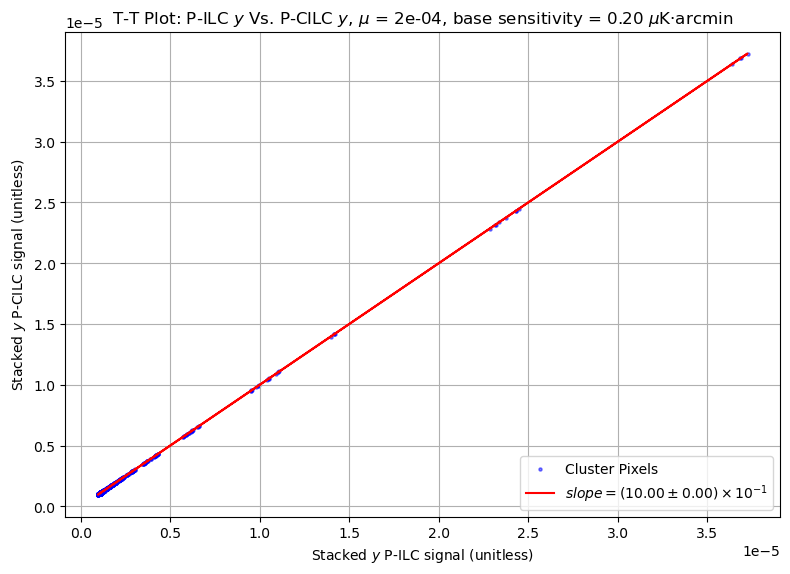

-----------------------
----- Statistics -----
-----------------------
y = 1.00e+00 * x + -4.26e-11
R-squared: 1.0000, p-value: 0.00e+00, std_err: 8.63e-06
-----------------------
Slope = 1.00e+00
-----------------------
Input mu = 2.00e-04
-----------------------
Full stacked map
-----------------------


In [78]:
### PLOTTING THE y P-ILC and P-CILC T-T CORRELATION --- y_hat_ilc Vs. y_hat_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_ilc_vs_cilc(stack_y_ilc, stack_y_cilc,
                                                                        mu, base_sensitivity_uk_arcmin,
                                                                        filename="TT_Plot_y_ILC_VS_CILC",
                                                                        xlabel=rf'Stacked $y$ P-ILC signal (unitless)',
                                                                        ylabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                        title=rf'T-T Plot: P-ILC $y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print("-----------------------")
print(f"----- Statistics -----")
print("-----------------------")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("-----------------------")
print(f"Slope = {measured_mu:.2e}")
print("-----------------------")
print(f"Input mu = {mu:.2e}")
print("-----------------------")
print("Full stacked map")
print("-----------------------")

### 10p radius cut

In [79]:
def plot_y_ilc_vs_cilc_10p_radius(stack_y_ilc, stack_y_cilc,
                        mu, base_sensitivity_uk_arcmin,
                        filename="TT_Plot_Comparison.pdf",
                        xlabel=rf'Stacked $y$ P-ILC (unitless)',
                        ylabel=rf'Stacked $y$ P-CILC (unitless)',
                        title=rf'T-T Plot: P-CILC $y$ Vs. P-ILC $y$'):
    
    # Flatten the 2D stacked patches into 1D arrays for scatter plotting and regression
    x_data = stack_y_ilc.flatten()
    y_data = stack_y_cilc.flatten()

    # r = 10 pixel
    center = np.array(stack_y_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_y_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10  # Keep pixels within a 10 pixel radius
    x_data = x_data[mask.flatten()]
    y_data = y_data[mask.flatten()]

    # Linear Regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    
    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        if (std_err / abs(slope)) < 1e-4:
            label_text = rf'$slope = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$'
        else:
            label_text = rf'$slope = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$'
    else:
        label_text = rf'$slope = 0.00 \pm 0.00$'

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/TT_plots/10p/{filename}_10p.pdf"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err

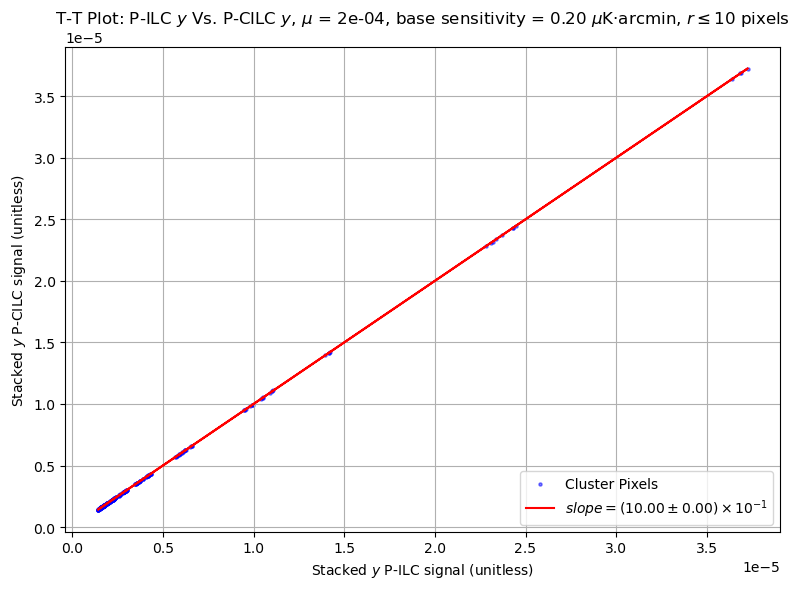

-----------------------
----- Statistics -----
-----------------------
y = 1.00e+00 * x + 7.69e-11
R-squared: 1.0000, p-value: 0.00e+00, std_err: 9.49e-06
-----------------------
Slope = 1.00e+00
-----------------------
Input mu = 2.00e-04
-----------------------
10p radius cut
-----------------------


In [80]:
### PLOTTING THE y P-ILC and P-CILC T-T CORRELATION --- 10p radius --- y_hat_ilc Vs. y_hat_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_y_ilc_vs_cilc_10p_radius(stack_y_ilc, stack_y_cilc,
                                                                                mu, base_sensitivity_uk_arcmin,
                                                                                filename="TT_Plot_y_ILC_VS_CILC",
                                                                                xlabel=rf'Stacked $y$ P-ILC signal (unitless)',
                                                                                ylabel=rf'Stacked $y$ P-CILC signal (unitless)',
                                                                                title=rf'T-T Plot: P-ILC $y$ Vs. P-CILC $y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels')
print("-----------------------")
print(f"----- Statistics -----")
print("-----------------------")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("-----------------------")
print(f"Slope = {measured_mu:.2e}")
print("-----------------------")
print(f"Input mu = {mu:.2e}")
print("-----------------------")
print("10p radius cut")
print("-----------------------")

### 6.1.3. $\mu y$ Vs. $\mu y$ --- Check whether there is a 1:1 correlation slope for $\mu y$ between P-ILC and P-CILC

### Full stacked map

In [81]:
def plot_muy_ilc_vs_cilc(stack_muy_ilc, stack_muy_cilc,
                        mu, base_sensitivity_uk_arcmin,
                        filename="TT_Plot_Comparison_muy.pdf",
                        xlabel=rf'Stacked $\mu y$ P-ILC (unitless)',
                        ylabel=rf'Stacked $\mu y$ P-CILC (unitless)',
                        title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-ILC $\mu y$'):
    
    # Flatten the 2D patches into 1D arrays for regression
    x_data = stack_muy_ilc.flatten()
    y_data = stack_muy_cilc.flatten()

    # Linear Regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    
    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        # If error is negligible (10,000x smaller), show as 0.00
        if abs(slope) > 0 and (std_err / abs(slope)) < 1e-4:
            label_text = rf'$slope = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$'
        else:
            label_text = rf'$slope = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$'
    else:
        label_text = rf'$slope = 0.00 \pm 0.00$'

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    # Plot the regression line
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    # Save the plot with your specific local path
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/TT_plots/Full_map/{filename}"
    # Ensure filename includes .pdf if not provided in the function call
    if not save_path.endswith('.pdf'):
        save_path += '.pdf'
        
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err

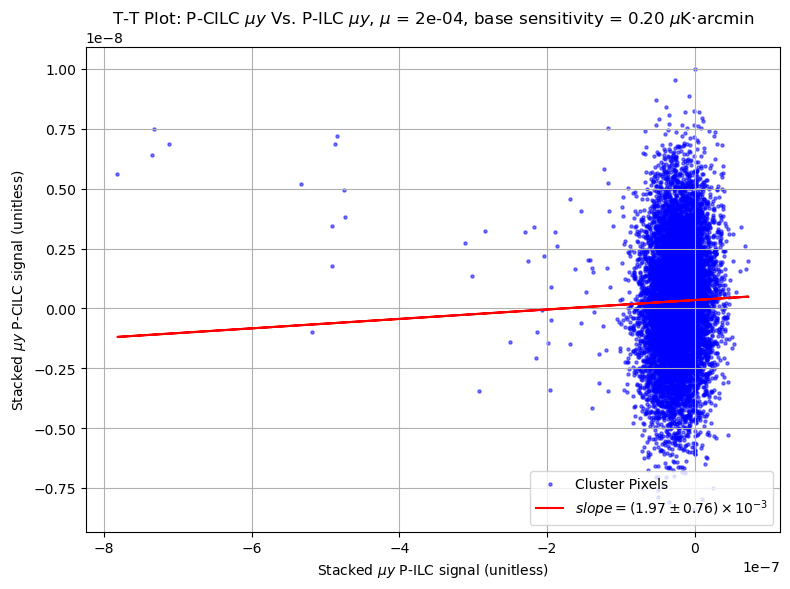

-----------------------
----- Statistics -----
-----------------------
y = 1.97e-03 * x + 3.48e-10
R-squared: 0.0007, p-value: 9.61e-03, std_err: 7.61e-04
-----------------------
Slope = 1.97e-03
-----------------------
Input mu = 2.00e-04
-----------------------
Full stacked map
-----------------------


In [82]:
### PLOTTING THE mu_y P-ILC and P-CILC T-T CORRELATION --- y_hat_muy_ilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_muy_ilc_vs_cilc(stack_muy_ilc, stack_muy_cilc,
                                                                        mu, base_sensitivity_uk_arcmin,
                                                                        filename="TT_Plot_muy_ILC_VS_CILC",
                                                                        xlabel=rf'Stacked $\mu y$ P-ILC signal (unitless)',
                                                                        ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                        title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-ILC $\mu y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
print("-----------------------")
print(f"----- Statistics -----")
print("-----------------------")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("-----------------------")
print(f"Slope = {measured_mu:.2e}")
print("-----------------------")
print(f"Input mu = {mu:.2e}")
print("-----------------------")
print("Full stacked map")
print("-----------------------")

### 10p radius cut

In [83]:
def plot_muy_ilc_vs_cilc_10p_radius(stack_muy_ilc, stack_muy_cilc,
                        mu, base_sensitivity_uk_arcmin,
                        filename="TT_Plot_Comparison_muy.pdf",
                        xlabel=rf'Stacked $\mu y$ P-ILC (unitless)',
                        ylabel=rf'Stacked $\mu y$ P-CILC (unitless)',
                        title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-ILC $\mu y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels'):
    
    # Flatten the 2D patches into 1D arrays for regression
    x_data = stack_muy_ilc.flatten()
    y_data = stack_muy_cilc.flatten()

    # r = 10 pixel
    center = np.array(stack_muy_ilc.shape) // 2
    y_indices, x_indices = np.indices(stack_muy_ilc.shape)
    distances = np.sqrt((x_indices - center[1])**2 + (y_indices - center[0])**2)
    mask = distances <= 10  # Keep pixels within a 10 pixel radius
    x_data = x_data[mask.flatten()]
    y_data = y_data[mask.flatten()]

    # Linear Regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    
    # --- FIXED 2-DECIMAL SCIENTIFIC ROUNDING ---
    if slope != 0:
        common_exp = math.floor(math.log10(abs(slope)))
        val_scaled = slope / (10**common_exp)
        err_scaled = std_err / (10**common_exp)
        
        # If error is negligible (10,000x smaller), show as 0.00
        if abs(slope) > 0 and (std_err / abs(slope)) < 1e-4:
            label_text = rf'$slope = ({val_scaled:.2f} \pm 0.00) \times 10^{{{common_exp}}}$'
        else:
            label_text = rf'$slope = ({val_scaled:.2f} \pm {err_scaled:.2f}) \times 10^{{{common_exp}}}$'
    else:
        label_text = rf'$slope = 0.00 \pm 0.00$'

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, alpha=0.5, s=5, label='Cluster Pixels', color='blue')
    
    # Plot the regression line
    line = slope * x_data + intercept
    plt.plot(x_data, line, color='red', label=label_text)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    
    # Save the plot with your specific local path
    save_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}/TT_plots/10p/{filename}_10p.pdf"
    # Ensure filename includes .pdf if not provided in the function call
    if not save_path.endswith('.pdf'):
        save_path += '.pdf'
        
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return slope, intercept, r_value, p_value, std_err

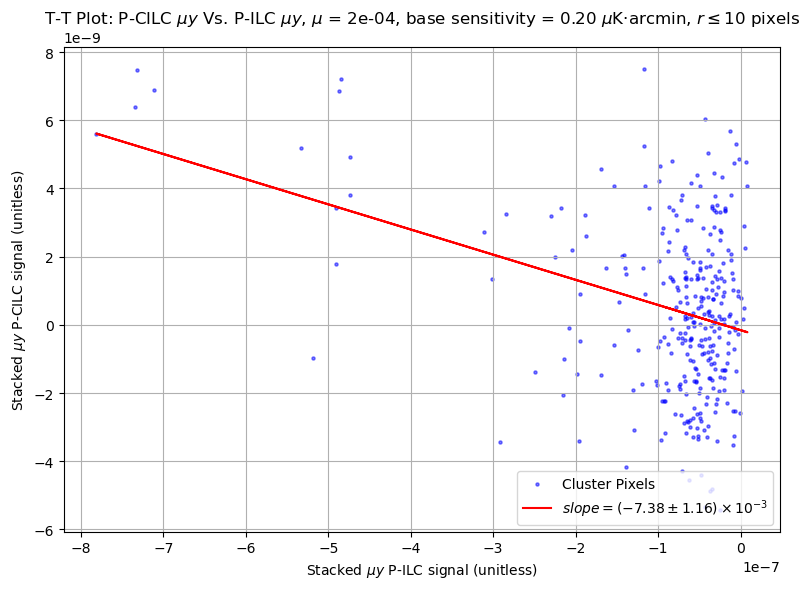

-----------------------
----- Statistics -----
-----------------------
y = -7.38e-03 * x + -1.56e-10
R-squared: 0.1131, p-value: 8.02e-10, std_err: 1.16e-03
-----------------------
Slope = -7.38e-03
-----------------------
Input mu = 2.00e-04
-----------------------
10p radius cut
-----------------------


In [84]:
### PLOTTING THE mu_y P-ILC and P-CILC T-T CORRELATION --- 10p radius --- y_hat_muy_ilc Vs. y_hat_muy_cilc ###

measured_mu, intercept, r_value, p_value, std_err = plot_muy_ilc_vs_cilc_10p_radius(stack_muy_ilc, stack_muy_cilc,
                                                                                    mu, base_sensitivity_uk_arcmin,
                                                                                    filename="TT_Plot_muy_ILC_VS_CILC",
                                                                                    xlabel=rf'Stacked $\mu y$ P-ILC signal (unitless)',
                                                                                    ylabel=rf'Stacked $\mu y$ P-CILC signal (unitless)',
                                                                                    title=rf'T-T Plot: P-CILC $\mu y$ Vs. P-ILC $\mu y$, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, $r \leq 10$ pixels')
print("-----------------------")
print(f"----- Statistics -----")
print("-----------------------")
print(rf"y = {measured_mu:.2e} * x + {intercept:.2e}")
print(f"R-squared: {r_value**2:.4f}, p-value: {p_value:.2e}, std_err: {std_err:.2e}")
print("-----------------------")
print(f"Slope = {measured_mu:.2e}")
print("-----------------------")
print(f"Input mu = {mu:.2e}")
print("-----------------------")
print("10p radius cut")
print("-----------------------")

## 7. Power spectrum comparison for $\mu$ extraction

In [15]:
def compute_mu_from_spectra(muy_map, y_map, lmax=3000, label="Reconstructed"):
    """
    Computes and plots the ratio of cross-power spectrum to auto-power spectrum.
    """
    # 1. Compute Power Spectra

    # C_l^(muy * y)
    cl_cross = hp.anafast(muy_map, map2=y_map, lmax=lmax)
    
    # C_l^(y * y)
    cl_auto_y = hp.anafast(y_map, lmax=lmax)
    
    # 2. Compute the Ratio 
    # Avoid division by zero for l=0 and l=1
    ell = np.arange(len(cl_cross))
    ratio = np.zeros_like(cl_cross)
    mask = cl_auto_y > 0
    ratio[mask] = cl_cross[mask] / cl_auto_y[mask]
    
    return ell, ratio

In [16]:
def compute_mu_from_spectra_binned(map_muy, map_y, lmax=3000, n_bins=40):
    """
    Computes the binned ratio of cross-power spectrum to auto-power spectrum.
    """
    # 1. Compute Raw Spectra
    cl_cross = hp.anafast(map_muy, map2=map_y, lmax=lmax)
    cl_auto_y = hp.anafast(map_y, lmax=lmax)
    ell = np.arange(len(cl_cross))
    
    # 2. Define Bins (starting from l=2 to avoid monopole/dipole)
    bins = np.linspace(2, lmax, n_bins + 1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    
    # 3. Calculate Binned Spectra using np.histogram as a weighting tool
    # (Sum of weights in bin / count of elements in bin)
    cl_cross_binned = np.histogram(ell, bins=bins, weights=cl_cross)[0] / np.histogram(ell, bins=bins)[0]
    cl_auto_y_binned = np.histogram(ell, bins=bins, weights=cl_auto_y)[0] / np.histogram(ell, bins=bins)[0]
    
    ratio_binned = cl_cross_binned / cl_auto_y_binned
    
    return bin_centers, ratio_binned

### 7.1. Cross-power spectrum Vs. Auto-power spectrum

In [ ]:
### COMPUTE AND SAVE THE BINNED RATIOS --- FULL MAPS ---

binned_data_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum"

# Input
l_bins_input, ratio_input = compute_mu_from_spectra_binned(muy_map, y_map)
np.savetxt(f"{binned_data_path}/l_bins_ratio_input.txt", np.column_stack((l_bins_input, ratio_input)), header="l_bins_input ratio_input")

# CILC
l_bins_cilc, ratio_cilc = compute_mu_from_spectra_binned(muy_hat_pixel_cilc, y_hat_pixel_cilc)
np.savetxt(f"{binned_data_path}/l_bins_ratio_cilc.txt", np.column_stack((l_bins_cilc, ratio_cilc)), header="l_bins_cilc ratio_cilc")

In [9]:
### READ THE BINNED RATIOS --- FULL MAPS ---

binned_data_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum"

l_bins_input, ratio_input = np.loadtxt(f"{binned_data_path}/l_bins_ratio_input.txt", unpack=True)
l_bins_cilc, ratio_cilc = np.loadtxt(f"{binned_data_path}/l_bins_ratio_cilc.txt", unpack=True)

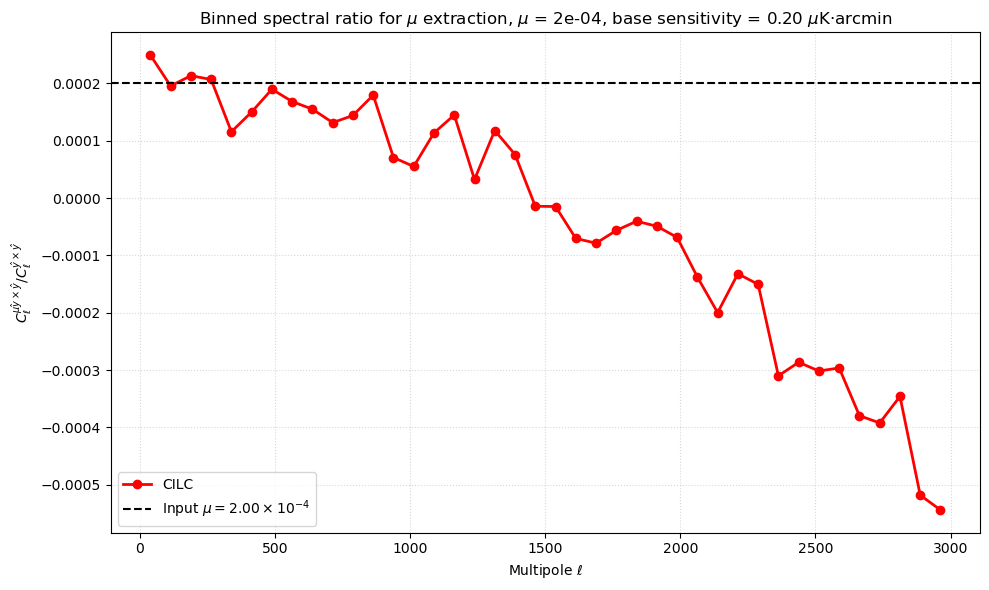

In [10]:
### PLOT THE BINNED SPECTRAL RATIO FOR --- FULL MAPS ---

plt.figure(figsize=(10, 6))

# Plot binned results
#plt.step(l_bins_input, ratio_input, where='mid', label="Input", alpha=0.5)
plt.plot(l_bins_cilc, ratio_cilc, 'ro-', label="CILC", lw=2)

# Legend labels with your requested 2-decimal notation
mu_input = mu
plt.axhline(mu_input, color='black', linestyle='--', label=rf'Input $\mu = {mu_input/1e-4:.2f} \times 10^{{-4}}$')

plt.xlabel(rf'Multipole $\ell$')
plt.ylabel(r'$C_{\ell}^{\hat{\mu y} \times \hat{y}} / C_{\ell}^{\hat{y} \times \hat{y}}$')
plt.title(rf'Binned spectral ratio for $\mu$ extraction, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
#plt.ylim(0, mu_input * 2) 
plt.grid(True, which='both', linestyle=':', alpha=0.5)
plt.legend(loc='lower left')
plt.tight_layout()
plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/Power_Spectra/Full_Map_Binned.pdf", dpi=300, bbox_inches='tight')
plt.show()

### Cut at $\ell < 1000$ 

mu = np.mean & error = np.std

In [11]:
def extract_mu_from_binned_ratio_mean_std(l_bins, ratio_binned, mu_input=2e-4, l_max_cut=1000):
    """
    Extracts the mean mu value and bias from the already binned spectral ratio.
    """
    # 1. Slice the arrays based on your observation (l < 1000)
    # We ignore the first few bins if they are unstable (e.g., l < 10)
    mask = (l_bins > 10) & (l_bins < l_max_cut)
    
    selected_ratios = ratio_binned[mask]
    
    if len(selected_ratios) == 0:
        return 0, 0, 0

    # 2. Compute Statistics
    mu_extracted = np.mean(selected_ratios)
    # Standard Error of the Mean
    #mu_std_err = np.std(selected_ratios) / np.sqrt(len(selected_ratios)) # DOUBLE CHECK
    mu_std_err = np.std(selected_ratios) # DOUBLE CHECK
    
    # 3. Compute Bias in units of sigma
    bias_sigma = (mu_extracted - mu_input) / mu_std_err

    # 4. Compute the Significance of the Detection
    significance_sigma = mu_extracted / mu_std_err if mu_std_err > 0 else 0.0
    
    return mu_extracted, mu_std_err, bias_sigma, significance_sigma

In [12]:
### EXTRACT mu FROM THE FIRST l=1000 AND CALCULATE BIAS ###

mu_val, mu_err, bias, significance = extract_mu_from_binned_ratio_mean_std(l_bins_cilc, ratio_cilc, mu_input=mu)

print("--------------------------------------------")
print(f"--- Power Spectrum Extraction (l < 1000) ---")
print("--------------------------------------------")
print(f"Extracted mu: ({mu_val/1e-4:.4f} ± {mu_err/1e-4:.4f}) x 10^-4")
print(f"Significance: {significance:.2f} sigma")
print(f"Bias: {bias:.2f} sigma")

--------------------------------------------
--- Power Spectrum Extraction (l < 1000) ---
--------------------------------------------
Extracted mu: (1.6692 ± 0.4485) x 10^-4
Significance: 3.72 sigma
Bias: -0.74 sigma


mu & error from variance ratio weighted

In [13]:
def compute_mu_from_spectra_binned(map_muy, map_y, lmax=3000, n_bins=40):
    """
    Computes and returns the individual component spectra needed 
    for the exact Knox variance ratio error propagation.
    """
    # 1. Compute Raw Spectra for all 3 standard combinations
    cl_AA = hp.anafast(map_muy, lmax=lmax)              # mu_y x mu_y (Auto A)
    cl_BB = hp.anafast(map_y, lmax=lmax)                # y x y       (Auto B)
    cl_AB = hp.anafast(map_muy, map2=map_y, lmax=lmax)  # mu_y x y    (Cross AB)
    ell = np.arange(len(cl_AB))
    
    # 2. Define Bins (starting from l=2 to avoid monopole/dipole)
    bins = np.linspace(2, lmax, n_bins + 1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    
    # 3. Calculate Binned Spectra using your histogram method
    counts = np.histogram(ell, bins=bins)[0]
    
    cl_AA_binned = np.histogram(ell, bins=bins, weights=cl_AA)[0] / counts
    cl_BB_binned = np.histogram(ell, bins=bins, weights=cl_BB)[0] / counts
    cl_AB_binned = np.histogram(ell, bins=bins, weights=cl_AB)[0] / counts
    
    return bin_centers, cl_AA_binned, cl_BB_binned, cl_AB_binned

In [5]:
def integrate_mu_power_spectrum_exact(l_bins, delta_l, cl_AA, cl_BB, cl_AB, f_sky=1.0, l_max_cut=1000):
    """
    Computes the integrated mu value and its analytical variance across multipole bins
    using the exact Knox ratio formula from the supervisor's approved derivation.
    
    Parameters:
    -----------
    l_bins : array-like
        Central multipole values of the bins.
    delta_l : float or array-like
        The width of the bins (Delta_l).
    cl_AA : array-like
        Binned power spectrum of component A (mu_y x mu_y), including noise.
    cl_BB : array-like
        Binned power spectrum of component B (y x y), including noise.
    cl_AB : array-like
        Binned cross-power spectrum (mu_y x y), including noise.
    f_sky : float
        Fraction of the sky analyzed (e.g., 1.0 for full sky, 0.7 if masked).
    l_max_cut : int
        Maximum multipole to integrate over (e.g., 1000).
    """
    # 1. Apply integration window cuts (e.g., 10 < l < 1000)
    mask = (l_bins > 10) & (l_bins < l_max_cut)
    
    l_vals = np.array(l_bins)[mask]
    dl_vals = np.array(delta_l)[mask] if isinstance(delta_l, (list, np.ndarray)) else np.full_like(l_vals, delta_l)
    
    cl_AA_sel = np.array(cl_AA)[mask]
    cl_BB_sel = np.array(cl_BB)[mask]
    cl_AB_sel = np.array(cl_AB)[mask]
    
    # 2. Compute ratio per bin: mu_i = C_l^AB / C_l^BB
    mu_binned = np.where(cl_BB_sel != 0, cl_AB_sel / cl_BB_sel, 0.0)
    
    # 3. Mode counting pre-factor: 1 / ((2l + 1) * Delta_l * f_sky)
    mode_factor = 1.0 / ((2 * l_vals + 1) * dl_vals * f_sky)
    
    # 4. Compute per-bin variance using the EXACT screenshot formula (with minus sign)
    var_mu_binned = np.zeros_like(mu_binned)
    for i in range(len(mu_binned)):
        if cl_BB_sel[i] != 0:
            # Formula: mode_factor * [ (C_l^AA / C_l^BB) - mu_i^2 ]
            term_bracket = (cl_AA_sel[i] / cl_BB_sel[i]) - (mu_binned[i]**2)
            
            # Max with 0 to handle minor floating-point errors in clean null-simulations
            var_mu_binned[i] = mode_factor[i] * max(0.0, term_bracket)
        else:
            var_mu_binned[i] = 0.0
            
    # 5. Integrated Inverse-Variance Weighting over all bins
    # Bins with var = 0 (like uncalculated regions) get zero weight
    weights = np.where(var_mu_binned > 0, 1.0 / var_mu_binned, 0.0)
    sum_weights = np.sum(weights)
    
    if sum_weights > 0:
        integrated_mu = np.sum(mu_binned * weights) / sum_weights
        integrated_variance = 1.0 / sum_weights
        integrated_std_err = np.sqrt(integrated_variance)
    else:
        # Fallback for idealized null tests with zero absolute variance
        integrated_mu = np.mean(mu_binned)
        integrated_std_err = 0.0
        
    return integrated_mu, integrated_std_err, l_vals, mu_binned, np.sqrt(var_mu_binned)

In [19]:
### COMPUTE AND SAVE THE BINNED SPECTRA COMPONENTS FOR EXACT ERROR PROPAGATION ###

# Setup your directory string cleanly as established in your setup cell
base_ps_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum/"

if not os.path.exists(base_ps_path):
    os.makedirs(base_ps_path)

# --- Compute and Save Input Data ---
l_bins_in, cl_AA_in, cl_BB_in, cl_AB_in = compute_mu_from_spectra_binned(muy_map, y_map)
data_input = np.column_stack((l_bins_in, cl_AA_in, cl_BB_in, cl_AB_in))
np.savetxt(os.path.join(base_ps_path, "spectra_components_input.txt"), data_input, 
           header="l_bins cl_AA_muy_muy cl_BB_y_y cl_AB_muy_y")

# --- Compute and Save CILC Data ---
l_bins_c, cl_AA_c, cl_BB_c, cl_AB_c = compute_mu_from_spectra_binned(muy_hat_pixel_cilc, y_hat_pixel_cilc)
data_cilc = np.column_stack((l_bins_c, cl_AA_c, cl_BB_c, cl_AB_c))
np.savetxt(os.path.join(base_ps_path, "spectra_components_cilc.txt"), data_cilc, 
           header="l_bins cl_AA_muy_muy cl_BB_y_y cl_AB_muy_y")

In [5]:
### LOAD THE BINNED SPECTRA COMPONENTS AND RUN THE EXACT INTEGRATION TO EXTRACT mu AND BIAS ###

base_ps_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum/"

# Load CILC data arrays
l_bins_cilc, cl_AA_cilc, cl_BB_cilc, cl_AB_cilc = np.loadtxt(
    os.path.join(base_ps_path, "spectra_components_cilc.txt"), unpack=True
)

# Calculate your notebook's delta_l value based on your bin spacing configuration
delta_l_val = l_bins_cilc[1] - l_bins_cilc[0]

# --- RUN EXACT INTEGRATION ---
# Call the exact integration function matching your supervisor's screenshots
mu_spec, mu_spec_err, l_eval, mu_ev, err_ev = integrate_mu_power_spectrum_exact(
    l_bins=l_bins_cilc,
    delta_l=delta_l_val,
    cl_AA=cl_AA_cilc,
    cl_BB=cl_BB_cilc,
    cl_AB=cl_AB_cilc,
    f_sky=1.0,  # Modify this if your PICO run incorporates a partial sky mask
    l_max_cut=1000
)

# Calculate bias in units of sigma
bias_sigma = np.abs(mu_spec - mu) / mu_spec_err if mu_spec_err > 0 else 0.0

# Calculate the sigma detection significance of the extracted mu value
detection_sigma = np.abs(mu_spec) / mu_spec_err if mu_spec_err > 0 else 0.0

# Calculate the ratio of the cross-spectrum to the auto-spectrum at the binned level for CILC (for reporting or sanity checks)
ratio_cilc = cl_AB_cilc / cl_BB_cilc

print("------------------------------------------------")
print(f"--- EXACT POWER SPECTRUM EVALUATION ({freq_str_name}) ---")
print("------------------------------------------------")
print(f"Input Mu: {mu:.2e}")
print(f"Integrated Mu: ({mu_spec/1e-4:.4f} +/- {mu_spec_err/1e-4:.4f}) x 10^-4")
print(f"Significance: {detection_sigma:.2f} sigma")
print(f"Statistical Bias: {bias_sigma:.2f} sigma")
print("------------------------------------------------")
print("Knox variance ratio error propagation of binned spectra from CILC.")

------------------------------------------------
--- EXACT POWER SPECTRUM EVALUATION (Zegeye) ---
------------------------------------------------
Input Mu: 2.00e-04
Integrated Mu: (1.6656 +/- 0.1405) x 10^-4
Significance: 11.86 sigma
Statistical Bias: 2.38 sigma
------------------------------------------------
Knox variance ratio error propagation of binned spectra from CILC.


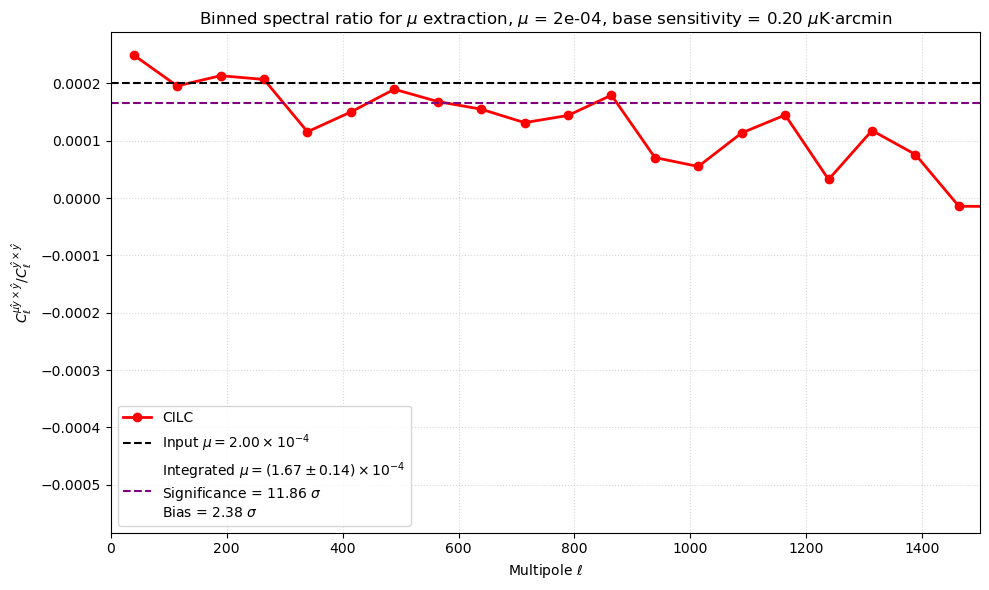

In [16]:
### PLOT THE BINNED SPECTRAL RATIO AND EXTRACT THE MU VALUE --- FULL MAPS, l < 1500 ---

plt.figure(figsize=(10, 6))

# Plot binned results
#plt.step(l_bins_input, ratio_input, where='mid', label="Input", alpha=0.5)
plt.plot(l_bins_cilc, ratio_cilc, 'ro-', label="CILC", lw=2)

# Legend labels with your requested 2-decimal notation
mu_input = mu
plt.axhline(mu_input, color='black', linestyle='--', label=rf'Input $\mu = {mu_input/1e-4:.2f} \times 10^{{-4}}$')
#plt.axhline(mu_val, color='cyan', linestyle='--', label=rf'Extracted $\mu = ({mu_val/1e-4:.2f} \pm {mu_err/1e-4:.2f}) \times 10^{{-4}}$' + '\n' + rf'Bias = {bias:.2f} $\sigma$')
plt.axhline(mu_spec, color='purple', linestyle='--', label=rf'Integrated $\mu = ({mu_spec/1e-4:.2f} \pm {mu_spec_err/1e-4:.2f}) \times 10^{{-4}}$' + '\n' +
            rf'Significance = {detection_sigma:.2f} $\sigma$' + '\n' +
            rf'Bias = {bias_sigma:.2f} $\sigma$')


plt.xlabel(rf'Multipole $\ell$')
plt.ylabel(r'$C_{\ell}^{\hat{\mu y} \times \hat{y}} / C_{\ell}^{\hat{y} \times \hat{y}}$')
plt.title(rf'Binned spectral ratio for $\mu$ extraction, $\mu$ = {mu:.0e}, base sensitivity = {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin')
plt.xlim(0, 1500)
#plt.ylim(0, mu_input * 2)
plt.grid(True, which='both', linestyle=':', alpha=0.5)
plt.legend(loc='lower left')
plt.tight_layout()
plt.savefig(f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/Power_Spectra/Full_Map_Binned_l1500.pdf", dpi=300, bbox_inches='tight')
plt.show()

4 PLOTS IN ONE

------------------------------------------------
--- EXACT POWER SPECTRUM EVALUATION (Zegeye) ---
------------------------------------------------
Input Mu: 2.00e-04
Integrated Mu: (1.6656 +/- 0.1405) x 10^-4
Detection Significance: 11.86 sigma
Statistical Bias: 2.38 sigma
------------------------------------------------


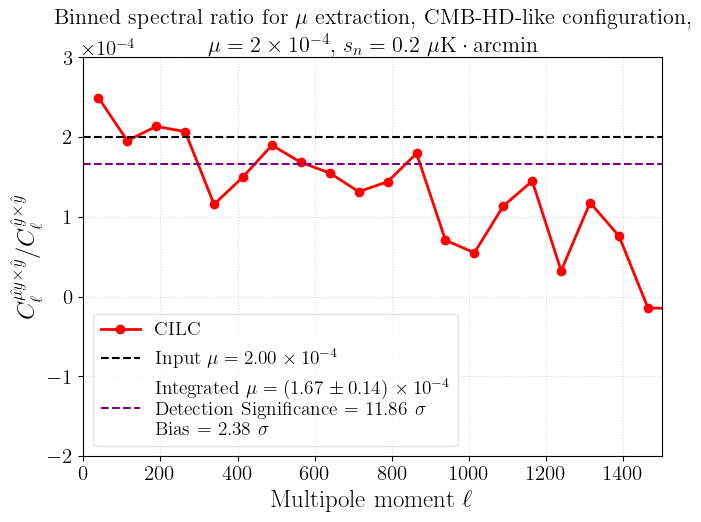

In [6]:
### LOAD THE BINNED SPECTRA COMPONENTS AND RUN THE EXACT INTEGRATION ###

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import os

base_ps_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum/"

# Load CILC data arrays
l_bins_cilc, cl_AA_cilc, cl_BB_cilc, cl_AB_cilc = np.loadtxt(
    os.path.join(base_ps_path, "spectra_components_cilc.txt"), unpack=True
)

# Calculate your notebook's delta_l value based on your bin spacing configuration
delta_l_val = l_bins_cilc[1] - l_bins_cilc[0]

# --- RUN EXACT INTEGRATION ---
mu_spec, mu_spec_err, l_eval, mu_ev, err_ev = integrate_mu_power_spectrum_exact(
    l_bins=l_bins_cilc,
    delta_l=delta_l_val,
    cl_AA=cl_AA_cilc,
    cl_BB=cl_BB_cilc,
    cl_AB=cl_AB_cilc,
    f_sky=1.0,  
    l_max_cut=1000
)

# Calculate bias and significance
bias_sigma = np.abs(mu_spec - mu) / mu_spec_err if mu_spec_err > 0 else 0.0
detection_sigma = np.abs(mu_spec) / mu_spec_err if mu_spec_err > 0 else 0.0
ratio_cilc = cl_AB_cilc / cl_BB_cilc

# Print logic (mantingut intacte)
print("------------------------------------------------")
print(f"--- EXACT POWER SPECTRUM EVALUATION ({freq_str_name}) ---")
print("------------------------------------------------")
print(f"Input Mu: {mu:.2e}")
print(f"Integrated Mu: ({mu_spec/1e-4:.4f} +/- {mu_spec_err/1e-4:.4f}) x 10^-4")
print(f"Detection Significance: {detection_sigma:.2f} sigma")
print(f"Statistical Bias: {bias_sigma:.2f} sigma")
print("------------------------------------------------")


# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS PER A SUBPLOTS ---
# ============================================================================
# Pugem les mides de forma generalitzada perquè en reduir el gràfic al 48% es llegeixi perfectament
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 14,               # Llegenda ben clara
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15                # Números de l'eix y
})

# Creem la figura individual (que després anirà al mosaic de 4 a LaTeX)
fig, ax = plt.subplots(figsize=(7, 5.5))  # Relació d'aspecte més quadrada, ideal per a matrius 2x2

plt.plot(l_bins_cilc, ratio_cilc, 'ro-', label="CILC", lw=2)

# Legend labels with your requested 2-decimal notation
mu_input = mu
plt.axhline(mu_input, color='black', linestyle='--', label=rf'Input $\mu = {mu_input/1e-4:.2f} \times 10^{{-4}}$')
#plt.axhline(mu_val, color='cyan', linestyle='--', label=rf'Extracted $\mu = ({mu_val/1e-4:.2f} \pm {mu_err/1e-4:.2f}) \times 10^{{-4}}$' + '\n' + rf'Bias = {bias:.2f} $\sigma$')
plt.axhline(mu_spec, color='purple', linestyle='--', label=rf'Integrated $\mu = ({mu_spec/1e-4:.2f} \pm {mu_spec_err/1e-4:.2f}) \times 10^{{-4}}$' + '\n' +
            rf'Detection Significance = {detection_sigma:.2f} $\sigma$' + '\n' +
            rf'Bias = {bias_sigma:.2f} $\sigma$')


# ============================================================================
# --- TRUC DE NOTACIÓ CIENTÍFICA NETE EN L'EIX Y (x10^-5) ---
# ============================================================================
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-3, 3))       # Força la notació científica si els valors són petits
ax.yaxis.set_major_formatter(formatter)

# Augmentem també la mida de la font del multiplicador superior (el "x10^-5")
ax.yaxis.get_offset_text().set_fontsize(15) 

# ============================================================================
# --- LABELS, LEGEND I POLISHING ---
# ============================================================================          
plt.title(rf"\begin{{center}} Binned spectral ratio for $\mu$ extraction, CMB-HD-like configuration,\\"
    rf"$\mu = {mu_input/1e-4:.0f} \times 10^{{-4}}$, $s_n = {base_sensitivity_uk_arcmin}\ \mathrm{{\mu K\cdot arcmin}}$ \end{{center}}", pad=-12.5, loc='center')
ax.set_xlabel(r'Multipole moment $\ell$')
ax.set_ylabel(r'$C_{\ell}^{\hat{\mu y} \times \hat{y}} / C_{\ell}^{\hat{y} \times \hat{y}}$')

ax.set_xlim(0, 1500)
ax.set_ylim(-2e-4, 3e-4)
ax.grid(True, linestyle=':', alpha=0.5)
#ax.legend(loc='best', frameon=True, facecolor='white', edgecolor='gainsboro')
ax.legend(loc='lower left', frameon=True, facecolor='white', edgecolor='gainsboro')
plt.tight_layout()

# Save Logic (ajusta el camí si vols guardar-los separats com a plot_1.pdf, plot_2.pdf, etc.)
save_ps_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/Power_Spectra/Full_Map_Binned_l1500_4plots.pdf"
plt.savefig(save_ps_path, bbox_inches='tight', dpi=300)
plt.show()

------------------------------------------------
--- EXACT POWER SPECTRUM EVALUATION (Zegeye) ---
------------------------------------------------
Input Mu: 2.00e-04
Integrated Mu: (1.6656 +/- 0.1405) x 10^-4
Detection Significance: 11.86 sigma
Statistical Bias: 2.38 sigma
------------------------------------------------


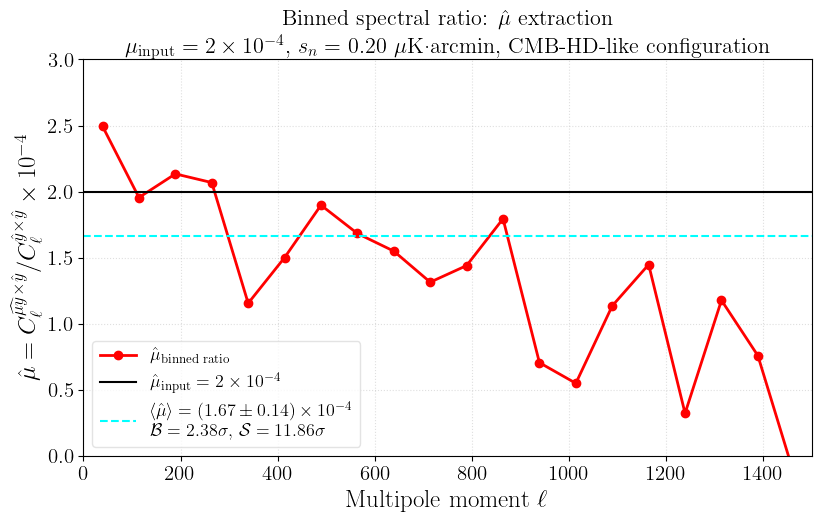

In [6]:
### LOAD THE BINNED SPECTRA COMPONENTS AND RUN THE EXACT INTEGRATION ###

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import os
from pathlib import Path

base_ps_path = f"/Users/joanribot/HEAVY_STUFF/TFM_data/Processed_Maps/CILC_{mu:.0e}_{freq_str_name}_maps/Power_Spectrum/"

# Load CILC data arrays
l_bins_cilc, cl_AA_cilc, cl_BB_cilc, cl_AB_cilc = np.loadtxt(
    os.path.join(base_ps_path, "spectra_components_cilc.txt"), unpack=True
)

# Calculate your notebook's delta_l value based on your bin spacing configuration
delta_l_val = l_bins_cilc[1] - l_bins_cilc[0]

# --- RUN EXACT INTEGRATION ---
mu_spec, mu_spec_err, l_eval, mu_ev, err_ev = integrate_mu_power_spectrum_exact(
    l_bins=l_bins_cilc,
    delta_l=delta_l_val,
    cl_AA=cl_AA_cilc,
    cl_BB=cl_BB_cilc,
    cl_AB=cl_AB_cilc,
    f_sky=1.0,  
    l_max_cut=1000
)

# Calculate bias and significance
bias_sigma = np.abs(mu_spec - mu) / mu_spec_err if mu_spec_err > 0 else 0.0
detection_sigma = np.abs(mu_spec) / mu_spec_err if mu_spec_err > 0 else 0.0
ratio_cilc = cl_AB_cilc / cl_BB_cilc

# Print logic (mantingut intacte)
print("------------------------------------------------")
print(f"--- EXACT POWER SPECTRUM EVALUATION ({freq_str_name}) ---")
print("------------------------------------------------")
print(f"Input Mu: {mu:.2e}")
print(f"Integrated Mu: ({mu_spec/1e-4:.4f} +/- {mu_spec_err/1e-4:.4f}) x 10^-4")
print(f"Detection Significance: {detection_sigma:.2f} sigma")
print(f"Statistical Bias: {bias_sigma:.2f} sigma")
print("------------------------------------------------")


# ============================================================================
# --- CONFIGURACIÓ DE L'ENGINE DE LATEX AMB FONTS GEGANTS PER A SUBPLOTS ---
# ============================================================================
plt.rcParams.update({
    "text.usetex": True,                 # Force active LaTeX font engine
    "font.family": "serif",              # Matches Computer Modern Roman
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,                     # Mida base molt més alta (abans 11)
    "axes.labelsize": 18,                # Etiquetes dels eixos grans
    "axes.titlesize": 16,                # Títol del gràfic gran
    "legend.fontsize": 13,               # Llegenda ben clara i ajustada per a densitat
    "xtick.labelsize": 15,               # Números de l'eix x
    "ytick.labelsize": 15,                # Números de l'eix y
    "text.latex.preamble": r"\usepackage{amsmath}\usepackage{bm}"
})

# Creem la figura individual (que després anirà al mosaic de 4 a LaTeX)
fig, ax = plt.subplots(figsize=(8.5, 5.5))  

# CORRECCIÓ 1: Unificació de lletra neta matemàtica en negreta sense \text
plt.plot(l_bins_cilc, ratio_cilc, 'ro-', label=rf"$\hat{{\mu}}_{{\text{{binned ratio}}}}$", lw=2)

# Legend labels (Duplicant correctament les claus de LaTeX per a les f-strings)
mu_input = mu
plt.axhline(mu_input, color='black', linestyle='-', label=rf'$\hat{{\mu}}_{{\text{{input}}}} = {mu_input/1e-4:.0f} \times 10^{{-4}}$')

plt.axhline(mu_spec, color='cyan', linestyle='--', label=rf'$\langle \hat{{\mu}} \rangle = ({mu_spec/1e-4:.2f} \pm {mu_spec_err/1e-4:.2f}) \times 10^{{-4}}$' + '\n' +
            rf'$\mathrm{{\mathcal{{B}}}} = {bias_sigma:.2f} \sigma$, $\mathrm{{\mathcal{{S}}}} = {detection_sigma:.2f} \sigma$')

# ============================================================================
# --- TRUC DE NOTACIÓ CIENTÍFICA NETE EN L'EIX Y (x10^-5) ---
# ============================================================================

# Ocultem el text del multiplicador automàtic superior rebel que xocava amb el títol
ax.xaxis.get_offset_text().set_visible(False)
ax.yaxis.get_offset_text().set_visible(False)

# Calculem dinàmicament l'exponent real de les teves dades de l'eix Y
max_y_val = np.max(np.abs(ratio_cilc))
if max_y_val > 0:
    y_exponent = int(math.floor(math.log10(max_y_val)))
else:
    y_exponent = -1 # Valor de seguretat completament erroni per detectar-ho aviat

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-3, 3))       
ax.yaxis.set_major_formatter(formatter)

# ============================================================================
# --- LABELS, LEGEND I POLISHING ---
# ============================================================================
ax.set_title(rf"\begin{{center}} Binned spectral ratio: $\hat{{\mu}}$ extraction\\"
         rf"$\mu_{{\text{{input}}}} = {mu_input/1e-4:.0f} \times 10^{{-4}}$, $s_n = $ {base_sensitivity_uk_arcmin:.2f} $\mu$K·arcmin, CMB-HD-like configuration \end{{center}}", pad=-12.5, loc='center')

# Els eixos queden completament sans i tancats en mode matemàtic pur
ax.set_xlabel(r'Multipole moment $\ell$')
ax.set_ylabel(rf'$\hat{{\mu}} = C_{{\ell}}^{{\widehat{{\mu y}} \times \hat{{y}}}} / C_{{\ell}}^{{\hat{{y}} \times \hat{{y}}}} \times 10^{{{y_exponent}}}$')

ax.set_xlim(0, 1500)
ax.set_ylim(0e-4, 3e-4)
ax.grid(True, linestyle=':', alpha=0.4)

ax.legend(loc='lower left', frameon=True, facecolor='white', edgecolor='gainsboro')

# Ara tight_layout ja pot mesurar la caixa de text perfectament sense que LaTeX es col·lapsi!
plt.tight_layout()

# ============================================================================
# --- SAVING ENGINE CONVERTIT A SENSITIVE PATH (PROTECCIÓ D'ESPAIS EN MAC) ---
# ============================================================================
save_ps_path = f"/Users/joanribot/Desktop/Física/Màster UC - UIMP/2n semestre/TFM/Codes/Figures/CILC_{mu:.0e}_{freq_str_name}/Power_Spectra/Full_Map_Binned_l1500_4plots.pdf"
plt.savefig(save_ps_path, bbox_inches='tight', dpi=300)
plt.show()

### 7.2. Compute $\mu$ from the stacked patches via a Fast Fourier Transform (FFT)

In [25]:
def compute_mu_from_patch_fft(patch_muy, patch_y, label="Reconstructed"):
    """
    Computes the ratio of the 2D cross-power spectrum to the auto-spectrum 
    for flat 2D patches.
    """
    # 1. 2D FFT of the patches
    fft_muy = np.fft.fft2(patch_muy)
    fft_y = np.fft.fft2(patch_y)
    
    # 2. Cross-spectrum (Real part of muy * conj(y))
    # This is the 2D equivalent of C_l^(muy x y)
    pk_cross = np.real(fft_muy * np.conj(fft_y))
    
    # 3. Auto-spectrum of y
    # This is the 2D equivalent of C_l^(y x y)
    pk_auto_y = np.real(fft_y * np.conj(fft_y))
    
    # 4. Global Ratio (Average over all spatial frequencies k)
    # This gives a single mu estimate from the entire patch
    mu_est = np.sum(pk_cross) / np.sum(pk_auto_y)

    # 5. Calculate the uncertainty --- Calculate sums (A and B)
    sum_cross = np.sum(pk_cross)
    sum_auto = np.sum(pk_auto_y)
    n_pixels = pk_cross.size # Total number of modes in the FFT

    # Variance of the SUM is N * Variance of pixels
    var_sum_cross = n_pixels * np.var(pk_cross)
    var_sum_auto = n_pixels * np.var(pk_auto_y)

    if sum_auto > 0:
        # Propagation: Delta_mu = mu * sqrt( (Delta_A/A)^2 + (Delta_B/B)^2 )
        std_err_fft = abs(mu_est) * np.sqrt((var_sum_cross / sum_cross**2) + (var_sum_auto / sum_auto**2))
    else:
        std_err_fft = 0.0
    
    return mu_est, std_err_fft

In [26]:
# --- Print the FFT result for the stacked maps ---

#mu_from_stack_input_10e4 = compute_mu_from_patch_fft(stack_muy_real_10e4, stack_y_real_10e4, label="Input Stacked Patch")
mu_from_stack_cilc_10e4 = compute_mu_from_patch_fft(stack_muy_cilc_10e4, stack_y_cilc_10e4, label="CILC Stacked Patch")
print("-----------------------")
print(rf"Input mu = {mu:.2e}")
print("-----------------------")
#print(rf"Mu extracted from input stacked patches (FFT method): {mu_from_stack_input_10e4[0]:.2e} ± {mu_from_stack_input_10e4[1]:.2e}")
print(rf"Mu extracted from CILC stacked patches (FFT method): {mu_from_stack_cilc_10e4[0]:.2e} ± {mu_from_stack_cilc_10e4[1]:.2e}")

-----------------------
Input mu = 2.00e-04
-----------------------
Mu extracted from CILC stacked patches (FFT method): 2.12e-04 ± 2.66e-04


Apodized function applied so that the center has amplitude 1 and the corners amplitude 0

In [27]:
def get_apodized_patch_window(xsize, alpha=0.5):
    """
    Creates a 2D Tukey (tapered cosine) window.
    alpha: Fraction of the window inside the cosine tapered region.
           0 is a square box, 1 is a Hann window.
    """
    # Create 1D windows for each axis
    w1d = windows.tukey(xsize, alpha=alpha)
    # Outer product to create 2D window
    w2d = np.outer(w1d, w1d)
    return w2d

In [28]:
def compute_mu_from_patch_fft_apodized(patch_muy, patch_y, label="Reconstructed", alpha=0.5):
    win = get_apodized_patch_window(patch_muy.shape[0], alpha=alpha)
    
    # Apply window to both patches before FFT
    fft_muy = np.fft.fft2(patch_muy * win)
    fft_y = np.fft.fft2(patch_y * win)
    
    pk_cross = np.real(fft_muy * np.conj(fft_y))
    pk_auto_y = np.real(fft_y * np.conj(fft_y))
    
    mu_est = np.sum(pk_cross) / np.sum(pk_auto_y)
    
    # Uncertainty calculation (using the sum variance logic from before)
    n_pix = pk_cross.size
    var_sum_cross = n_pix * np.var(pk_cross)
    var_sum_auto = n_pix * np.var(pk_auto_y)
    std_err_fft = abs(mu_est) * np.sqrt((var_sum_cross / np.sum(pk_cross)**2) + 
                                       (var_sum_auto / np.sum(pk_auto_y)**2))
    
    return mu_est, std_err_fft

In [29]:
# --- Print the FFT result for the stacked maps ---

#mu_from_stack_input_10e4 = compute_mu_from_patch_fft_apodized(stack_muy_real_10e4, stack_y_real_10e4, label="Input Stacked Patch")
mu_from_stack_cilc_10e4 = compute_mu_from_patch_fft_apodized(stack_muy_cilc_10e4, stack_y_cilc_10e4, label="CILC Stacked Patch")
print("-----------------------")
print(rf"Input mu = {mu:.2e}")
print("-----------------------")
#print(rf"Mu extracted from input stacked patches (FFT method): {mu_from_stack_input_10e4[0]:.2e} ± {mu_from_stack_input_10e4[1]:.2e}")
print(rf"Mu extracted from CILC stacked patches (FFT method): {mu_from_stack_cilc_10e4[0]:.2e} ± {mu_from_stack_cilc_10e4[1]:.2e}")

-----------------------
Input mu = 2.00e-04
-----------------------
Mu extracted from CILC stacked patches (FFT method): 2.14e-04 ± 1.59e-04


## 8. Aperture photometry for $\mu$ extraction